#### 🌙 Low-Light Image Enhancement & Object Detection
### Zero-DCE + YOLOv8 Pipeline

---

This notebook implements a complete **unsupervised low-light image enhancement** pipeline using the **Zero-DCE (Zero-Reference Deep Curve Estimation)** model, followed by **YOLOv8 object detection** on the enhanced output.

| Phase | Label | Description |
|-------|-------|-------------|
| **Phase 1** | ⚙️ SETUP | Environment Setup & Imports |
| **Phase 2** | 📊 EDA | Dataset Loading & Exploratory Data Analysis |
| **Phase 3** | 🧠 MODEL | Architecture & Loss Functions |
| **Phase 4** | 🏋️ TRAIN | Training Loop (auto-skipped if model exists) |
| **Phase 5** | 🔍 INFERENCE | Enhancement, YOLO Detection & GUI |

---


---
## ⚙️ PHASE 1 — Environment Setup

> **Deep Learning Concepts Used in This Phase**
>
> | Concept | Explanation |
> |---------|-------------|
> | **GPU / CUDA** | Neural networks train ~10–100× faster on a GPU because thousands of tensor operations (matrix multiplies, convolutions) are done in parallel. `torch.cuda.is_available()` checks whether a CUDA-compatible GPU is present. |
> | **PyTorch** | An open-source deep learning framework based on dynamic computation graphs. Unlike TensorFlow 1.x (static graphs), PyTorch builds the graph on-the-fly, making debugging much easier. |
> | **Hyperparameters** | Settings you choose *before* training that control how the model learns — **not** learned from data. Key ones here: `IMAGE_SIZE` (input resolution), `BATCH_SIZE` (images processed per gradient step), `EPOCHS` (passes over the full dataset), `LR` (learning rate — step size for the optimizer). |
> | **Dataset paths** | The **LOL-v2** dataset has two subsets: **Synthetic** (synthetic degradation, ~689 pairs) and **Real-Captured** (real dark environments, ~100 pairs). Only the *low-light* folders are used for Zero-DCE training (unsupervised). Normal-light images are used only for PSNR/SSIM evaluation. |

---
### 📌 Cell 1 — Core Imports & Device Configuration
**What it does:** Imports all required libraries and detects whether a CUDA GPU is available. All subsequent computation will use the detected device.


In [2]:
import os, glob, time, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import sys

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))


Using device: cuda
GPU: NVIDIA GeForce RTX 4050 Laptop GPU


---
## A — Deterministic Seed & Config-Based Hyperparameters
**Insert after Cell 1 (imports).** Sets a global random seed for reproducibility across NumPy, Python, and PyTorch, and consolidates all hyperparameters into a single `CONFIG` dict to prevent leakage between experiments.


In [ ]:
# ── A. Deterministic seed + config dict ──────────────────────────────────────
import random, os, numpy as np, torch

SEED = 42

def set_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False
    os.environ["PYTHONHASHSEED"]       = str(seed)

set_seed(SEED)

# ── Centralised config (all hyperparameters in one place) ─────────────────────
CONFIG = {
    # Data
    "image_size"     : 256,
    "batch_size"     : 16,
    "val_split"      : 0.1,          # fraction of train data used for validation
    "num_workers"    : 0,

    # Optimiser
    "lr"             : 1e-4,
    "weight_decay"   : 1e-4,         # L2 regularisation coefficient
    "grad_clip"      : 1.0,          # max gradient norm

    # Scheduler
    "scheduler_step" : 50,           # StepLR: reduce LR every N epochs
    "scheduler_gamma": 0.5,          # StepLR: multiply LR by this factor

    # Training
    "epochs"         : 200,
    "early_stop_patience": 20,       # stop if val loss doesn't improve
    "seed"           : SEED,

    # AMP
    "use_amp"        : torch.cuda.is_available(),

    # Loss weights
    "w_smooth"  : 200,
    "w_spatial" : 1,
    "w_color"   : 5,
    "w_exposure": 10,

    # Paths
    "model_path": "best_zero_dce_lolv2.pth",
}

print("✅ Seed set to", SEED)
print("✅ CONFIG dict ready:")
for k, v in CONFIG.items():
    print(f"   {k:<25} = {v}")


---
### 📌 Cell 2 — Hyperparameters & Dataset Paths
**What it does:** Central configuration — change paths and training settings here only.

> **Why these values?**
> - `IMAGE_SIZE=256`: Balances detail vs. memory. Zero-DCE is fully-convolutional so any size works at inference.
> - `BATCH_SIZE=16`: Small enough to fit on most GPUs; larger batches give more stable gradient estimates.
> - `EPOCHS=100`: Enough for convergence on a ~500-image dataset.
> - `LR=1e-4`: Standard starting point for Adam optimizer on image tasks.


In [3]:
IMAGE_SIZE = 256
BATCH_SIZE = 16
EPOCHS     = 200        # increased for larger LOL-v2 dataset
LR         = 1e-4

# ── LOL-v2 Dataset Paths (Synthetic + Real-Captured) ──────────────────────────
SYNTH_TRAIN_LOW    = r"E:\LOL-v2\LOL-v2\Synthetic\Train\Low"
SYNTH_TRAIN_NORMAL = r"E:\LOL-v2\LOL-v2\Synthetic\Train\Normal"
SYNTH_TEST_LOW     = r"E:\LOL-v2\LOL-v2\Synthetic\Test\Low"
SYNTH_TEST_NORMAL  = r"E:\LOL-v2\LOL-v2\Synthetic\Test\Normal"

REAL_TRAIN_LOW     = r"E:\LOL-v2\LOL-v2\Real_captured\Train\Low"
REAL_TRAIN_NORMAL  = r"E:\LOL-v2\LOL-v2\Real_captured\Train\Normal"
REAL_TEST_LOW      = r"E:\LOL-v2\LOL-v2\Real_captured\Test\Low"
REAL_TEST_NORMAL   = r"E:\LOL-v2\LOL-v2\Real_captured\Test\Normal"

# ── Combined flat lists (low-light input for Zero-DCE training) ──────────────
import glob, os

TRAIN_DIRS = [SYNTH_TRAIN_LOW, REAL_TRAIN_LOW]
TEST_DIRS  = [SYNTH_TEST_LOW,  REAL_TEST_LOW]

TRAIN_FILES_ALL = []
for d in TRAIN_DIRS:
    TRAIN_FILES_ALL += glob.glob(os.path.join(d, "*.png")) + glob.glob(os.path.join(d, "*.jpg"))

TEST_FILES_ALL = []
for d in TEST_DIRS:
    TEST_FILES_ALL += glob.glob(os.path.join(d, "*.png")) + glob.glob(os.path.join(d, "*.jpg"))

NORMAL_TRAIN_DIRS = [SYNTH_TRAIN_NORMAL, REAL_TRAIN_NORMAL]
NORMAL_TEST_DIRS  = [SYNTH_TEST_NORMAL,  REAL_TEST_NORMAL]

# Convenience aliases (single-folder cells still work)
TRAIN_DIR = SYNTH_TRAIN_LOW
TEST_DIR  = SYNTH_TEST_LOW

MODEL_PATH = "best_zero_dce_lolv2.pth"

print("LOL-v2 Dataset Paths Configured")
print(f"  Synth Train Low  : {SYNTH_TRAIN_LOW}")
print(f"  Synth Train Norm : {SYNTH_TRAIN_NORMAL}")
print(f"  Synth Test  Low  : {SYNTH_TEST_LOW}")
print(f"  Synth Test  Norm : {SYNTH_TEST_NORMAL}")
print(f"  Real  Train Low  : {REAL_TRAIN_LOW}")
print(f"  Real  Train Norm : {REAL_TRAIN_NORMAL}")
print(f"  Real  Test  Low  : {REAL_TEST_LOW}")
print(f"  Real  Test  Norm : {REAL_TEST_NORMAL}")
print()
print(f"Total low-light train images : {len(TRAIN_FILES_ALL)}")
print(f"Total low-light test  images : {len(TEST_FILES_ALL)}")
print(f"Model path                   : {MODEL_PATH}")


LOL-v2 Dataset Paths Configured
  Synth Train Low  : E:\LOL-v2\LOL-v2\Synthetic\Train\Low
  Synth Train Norm : E:\LOL-v2\LOL-v2\Synthetic\Train\Normal
  Synth Test  Low  : E:\LOL-v2\LOL-v2\Synthetic\Test\Low
  Synth Test  Norm : E:\LOL-v2\LOL-v2\Synthetic\Test\Normal
  Real  Train Low  : E:\LOL-v2\LOL-v2\Real_captured\Train\Low
  Real  Train Norm : E:\LOL-v2\LOL-v2\Real_captured\Train\Normal
  Real  Test  Low  : E:\LOL-v2\LOL-v2\Real_captured\Test\Low
  Real  Test  Norm : E:\LOL-v2\LOL-v2\Real_captured\Test\Normal

Total low-light train images : 1589
Total low-light test  images : 200
Model path                   : best_zero_dce_lolv2.pth


---
## 📊 PHASE 2 — Exploratory Data Analysis (EDA)

> **What is EDA in Deep Learning?**
>
> EDA (Exploratory Data Analysis) is the process of *understanding your data before training*. In computer vision this means:
> - Checking dataset size and class balance
> - Visualising sample images to catch corrupted/mislabelled files
> - Analysing pixel intensity distributions to understand the problem severity
> - Measuring image dimensions and aspect ratios to choose `IMAGE_SIZE`
> - Detecting outliers that could destabilise training
>
> **Why it matters for this project:** Zero-DCE has no reference images to compare against — the loss functions must "know" what counts as well-exposed. EDA tells us the baseline brightness so we can calibrate the exposure loss target (`mean_val=0.6`).

---
### 📌 Cell 3 — Scan Dataset Files
**What it does:** Collects all `.png` file paths from the training and test directories and reports counts.


In [4]:
# ── LOL-v2: combined low-light image lists (Synthetic + Real) ───────────────
train_files = TRAIN_FILES_ALL
test_files  = TEST_FILES_ALL

# Normal-light references for PSNR / SSIM evaluation
normal_train_files = []
for d in NORMAL_TRAIN_DIRS:
    normal_train_files += glob.glob(os.path.join(d, "*.png")) + glob.glob(os.path.join(d, "*.jpg"))

normal_test_files = []
for d in NORMAL_TEST_DIRS:
    normal_test_files += glob.glob(os.path.join(d, "*.png")) + glob.glob(os.path.join(d, "*.jpg"))

print(f"Low-light Train  : {len(train_files)}")
print(f"Low-light Test   : {len(test_files)}")
print(f"Normal    Train  : {len(normal_train_files)}")
print(f"Normal    Test   : {len(normal_test_files)}")
print()
print("Breakdown by subset:")
synth_train = [f for f in train_files if "Synthetic" in f]
real_train  = [f for f in train_files if "Real"      in f]
synth_test  = [f for f in test_files  if "Synthetic" in f]
real_test   = [f for f in test_files  if "Real"      in f]
print(f"  Synthetic Train : {len(synth_train)}")
print(f"  Real      Train : {len(real_train)}")
print(f"  Synthetic Test  : {len(synth_test)}")
print(f"  Real      Test  : {len(real_test)}")


Low-light Train  : 1589
Low-light Test   : 200
Normal    Train  : 1589
Normal    Test   : 200

Breakdown by subset:
  Synthetic Train : 900
  Real      Train : 689
  Synthetic Test  : 100
  Real      Test  : 100


---
## B — Missing / Corrupted Data Detection
**Insert after Cell 3 (scan dataset files).** Iterates over every file path and attempts to open it; files that raise exceptions are flagged as corrupted and excluded from training.


In [ ]:
# ── B. Missing/corrupted data detection ─────────────────────────────────────
from PIL import Image, UnidentifiedImageError
import os

def check_files(file_list, label=""):
    good, bad = [], []
    for f in file_list:
        if not os.path.exists(f):
            bad.append((f, "File not found"))
            continue
        if os.path.getsize(f) == 0:
            bad.append((f, "Zero-byte file"))
            continue
        try:
            with Image.open(f) as img:
                img.verify()              # catch truncated images
        except (UnidentifiedImageError, Exception) as e:
            bad.append((f, str(e)))
            continue
        good.append(f)
    print(f"[{label}]  Total: {len(file_list):>5}  ✅ OK: {len(good):>5}  ❌ Corrupted: {len(bad)}")
    return good, bad

train_good, train_bad = check_files(TRAIN_FILES_ALL, "Train Low")
test_good,  test_bad  = check_files(TEST_FILES_ALL,  "Test  Low")

# Replace file lists with clean versions
TRAIN_FILES_CLEAN = train_good
TEST_FILES_CLEAN  = test_good

if train_bad:
    print("\n⚠️  Corrupted/missing train files:")
    for f, reason in train_bad[:10]:
        print(f"   {reason}: {f}")
if test_bad:
    print("\n⚠️  Corrupted/missing test files:")
    for f, reason in test_bad[:10]:
        print(f"   {reason}: {f}")

print(f"\n✅ Clean train files: {len(TRAIN_FILES_CLEAN)}")
print(f"✅ Clean test  files: {len(TEST_FILES_CLEAN)}")


---
### 📌 Cell 4 — Visual Sample of Training Images
**What it does:** Displays 8 random training images to visually verify dataset quality and get a feel for the low-light severity.

> **Why this matters:** Always look at your data. Common issues you can catch here: wrong folder loaded, images already enhanced by mistake, extreme underexposure making images pure black, or unexpected resolutions.


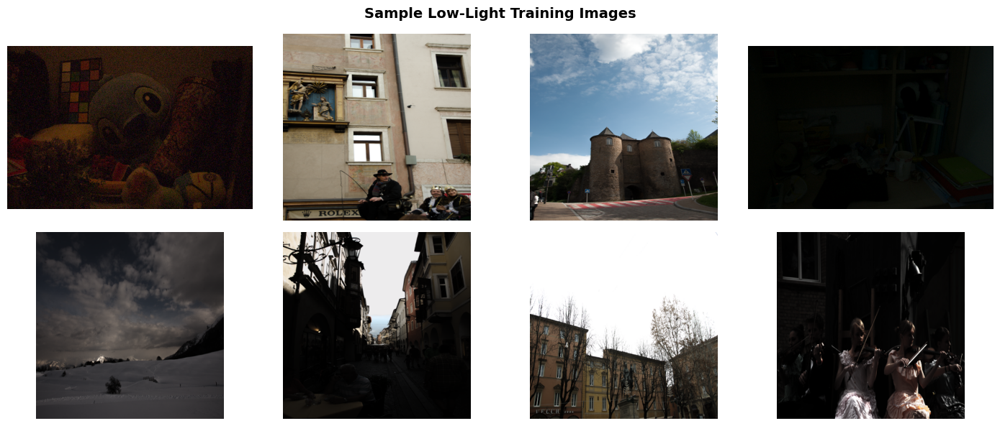

In [5]:
fig, axes = plt.subplots(2, 4, figsize=(14, 6))
for i, ax in enumerate(axes.flatten()):
    img = Image.open(random.choice(train_files))
    ax.imshow(img)
    ax.axis("off")
plt.suptitle("Sample Low-Light Training Images", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()


---
### 📌 Cell 5 — Brightness Distribution Analysis
**What it does:** Measures the average pixel intensity (mean brightness on a 0–255 scale) across 50 randomly sampled training images, then plots a histogram.

> **Deep Learning connection:** This directly informs our **Exposure Loss** design. If the average brightness here is ~40–80 (very dark), targeting `mean_val=0.6` (≈153/255) in the loss is appropriate. If images were already at 200+, the loss target would need adjustment.


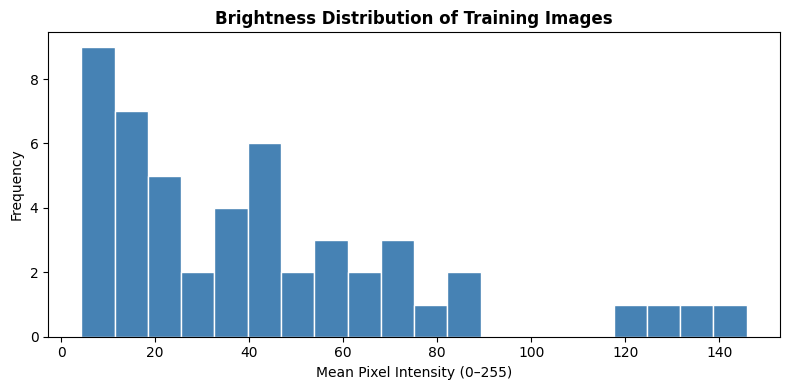

Average brightness : 42.47
Min brightness     : 4.31
Max brightness     : 145.82


In [6]:
brightness = []
for f in random.sample(train_files, min(50, len(train_files))):
    img = np.array(Image.open(f))
    brightness.append(img.mean())

plt.figure(figsize=(8, 4))
plt.hist(brightness, bins=20, color="steelblue", edgecolor="white")
plt.title("Brightness Distribution of Training Images", fontweight="bold")
plt.xlabel("Mean Pixel Intensity (0–255)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

print(f"Average brightness : {np.mean(brightness):.2f}")
print(f"Min brightness     : {np.min(brightness):.2f}")
print(f"Max brightness     : {np.max(brightness):.2f}")


---
### 📌 Cell 5b — EDA: RGB Channel Distribution
**What it does:** Plots the per-channel (R, G, B) pixel intensity histograms for a sample of training images.

> **Why it matters:** Reveals colour imbalance. In dark environments, sensors often underperform differently per channel — the blue channel may be noisier or the red channel may clip. This motivates the **Colour Constancy Loss** in Zero-DCE, which penalises large differences between channel means.


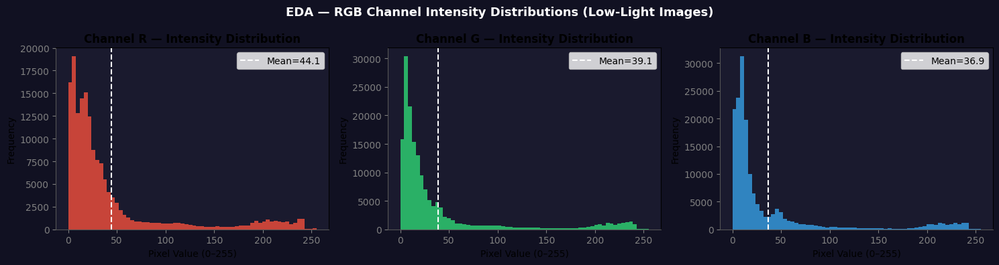

Mean R: 44.14  |  Mean G: 39.13  |  Mean B: 36.89
Std  R: 60.07  |  Std  G: 59.99  |  Std  B: 59.20


In [7]:
# ── EDA: Per-channel pixel histogram across 10 sample images ──────────────────
sample_imgs = random.sample(train_files, min(10, len(train_files)))
r_vals, g_vals, b_vals = [], [], []

for f in sample_imgs:
    arr = np.array(Image.open(f).resize((128, 128))).astype(np.float32)
    r_vals.append(arr[:,:,0].flatten())
    g_vals.append(arr[:,:,1].flatten())
    b_vals.append(arr[:,:,2].flatten())

r_all = np.concatenate(r_vals)
g_all = np.concatenate(g_vals)
b_all = np.concatenate(b_vals)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
colors = [("R", r_all, "#e74c3c"), ("G", g_all, "#2ecc71"), ("B", b_all, "#3498db")]

for ax, (ch, vals, col) in zip(axes, colors):
    ax.hist(vals, bins=64, color=col, alpha=0.85, edgecolor="none")
    ax.axvline(vals.mean(), color="white", linestyle="--", linewidth=1.5,
               label=f"Mean={vals.mean():.1f}")
    ax.set_title(f"Channel {ch} — Intensity Distribution", fontweight="bold")
    ax.set_xlabel("Pixel Value (0–255)")
    ax.set_ylabel("Frequency")
    ax.legend()
    ax.set_facecolor("#1a1a2e")
    ax.spines['bottom'].set_color('#555')
    ax.spines['left'].set_color('#555')
    ax.tick_params(colors='gray')

fig.patch.set_facecolor("#111122")
plt.suptitle("EDA — RGB Channel Intensity Distributions (Low-Light Images)",
             fontsize=13, fontweight="bold", color="white")
plt.tight_layout()
plt.show()

print(f"Mean R: {r_all.mean():.2f}  |  Mean G: {g_all.mean():.2f}  |  Mean B: {b_all.mean():.2f}")
print(f"Std  R: {r_all.std():.2f}  |  Std  G: {g_all.std():.2f}  |  Std  B: {b_all.std():.2f}")


---
### 📌 Cell 5c — EDA: Image Resolution Distribution
**What it does:** Reads the width and height of every training image and plots a scatter plot of resolutions.

> **Why it matters:** Variable-resolution datasets are common in the wild. Since we resize everything to `IMAGE_SIZE=256`, images with very different aspect ratios will be distorted. This cell lets you spot if any images are severely non-square, which might justify padding instead of resizing.


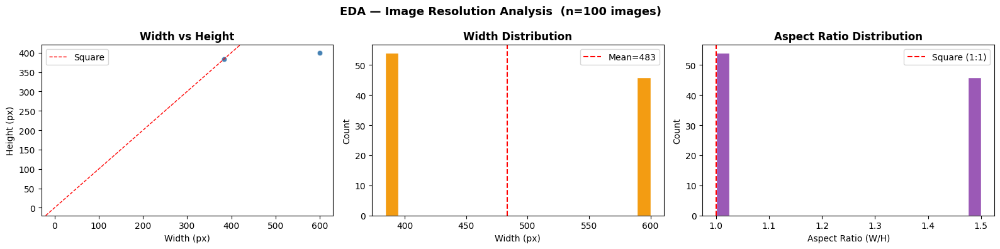

Width  — min: 384  max: 600  mean: 483.4
Height — min: 384  max: 400  mean: 391.4
Aspect — min: 1.00  max: 1.50  mean: 1.23


In [8]:
# ── EDA: Image resolution scatter plot ──────────────────────────────────────
widths, heights = [], []
sample = random.sample(train_files, min(100, len(train_files)))

for f in sample:
    w, h = Image.open(f).size
    widths.append(w)
    heights.append(h)

widths  = np.array(widths)
heights = np.array(heights)
aspects = widths / heights

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Scatter: width vs height
axes[0].scatter(widths, heights, alpha=0.6, color="steelblue", edgecolors="white", linewidth=0.5)
axes[0].set_xlabel("Width (px)")
axes[0].set_ylabel("Height (px)")
axes[0].set_title("Width vs Height", fontweight="bold")
axes[0].axline((0,0), slope=1, color="red", linestyle="--", linewidth=1, label="Square")
axes[0].legend()

# Width distribution
axes[1].hist(widths, bins=20, color="#f39c12", edgecolor="white")
axes[1].set_xlabel("Width (px)")
axes[1].set_ylabel("Count")
axes[1].set_title("Width Distribution", fontweight="bold")
axes[1].axvline(widths.mean(), color="red", linestyle="--", label=f"Mean={widths.mean():.0f}")
axes[1].legend()

# Aspect ratio distribution
axes[2].hist(aspects, bins=20, color="#9b59b6", edgecolor="white")
axes[2].set_xlabel("Aspect Ratio (W/H)")
axes[2].set_ylabel("Count")
axes[2].set_title("Aspect Ratio Distribution", fontweight="bold")
axes[2].axvline(1.0, color="red", linestyle="--", label="Square (1:1)")
axes[2].legend()

plt.suptitle(f"EDA — Image Resolution Analysis  (n={len(sample)} images)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

print(f"Width  — min: {widths.min()}  max: {widths.max()}  mean: {widths.mean():.1f}")
print(f"Height — min: {heights.min()}  max: {heights.max()}  mean: {heights.mean():.1f}")
print(f"Aspect — min: {aspects.min():.2f}  max: {aspects.max():.2f}  mean: {aspects.mean():.2f}")


---
### 📌 Cell 5d — EDA: Per-Image Brightness Box Plot & Outlier Detection
**What it does:** Computes mean brightness for ALL training images, draws a box plot, and flags unusually dark or bright outliers.

> **Why it matters:** Outliers (e.g. completely black images, or accidentally-included normal-light frames) can destabilise training. The interquartile range (IQR) method is a standard statistical technique for outlier detection. Images outside 1.5×IQR from the quartiles are printed so you can inspect or remove them.


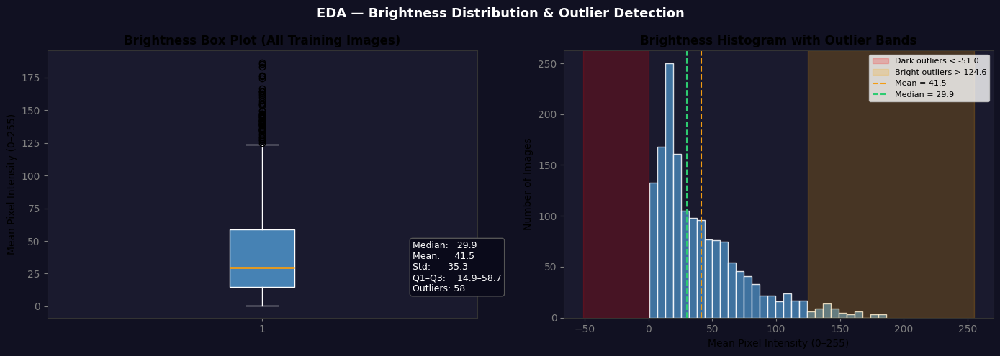

Total images: 1589
Dark outliers  (brightness < -51.0): 0
Bright outliers (brightness > 124.6): 58


In [9]:
# ── EDA: Full brightness analysis + outlier detection ─────────────────────────
all_brightness = []
for f in train_files:
    arr = np.array(Image.open(f))
    all_brightness.append(arr.mean())
all_brightness = np.array(all_brightness)

# IQR-based outlier detection
Q1, Q3 = np.percentile(all_brightness, 25), np.percentile(all_brightness, 75)
IQR    = Q3 - Q1
lo, hi = Q1 - 1.5*IQR, Q3 + 1.5*IQR
outliers_dark   = np.where(all_brightness < lo)[0]
outliers_bright = np.where(all_brightness > hi)[0]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Box plot
bp = axes[0].boxplot(all_brightness, vert=True, patch_artist=True,
                     boxprops=dict(facecolor="steelblue", color="white"),
                     whiskerprops=dict(color="white"),
                     capprops=dict(color="white"),
                     medianprops=dict(color="#f39c12", linewidth=2),
                     flierprops=dict(marker="o", color="#e74c3c", markersize=6))
axes[0].set_title("Brightness Box Plot (All Training Images)", fontweight="bold")
axes[0].set_ylabel("Mean Pixel Intensity (0–255)")
axes[0].set_facecolor("#1a1a2e")
axes[0].tick_params(colors='gray')
for spine in axes[0].spines.values(): spine.set_color('#333')

# Annotate statistics
stats_text = (
    f"Median:   {np.median(all_brightness):.1f}\n"
    f"Mean:     {all_brightness.mean():.1f}\n"
    f"Std:      {all_brightness.std():.1f}\n"
    f"Q1–Q3:    {Q1:.1f}–{Q3:.1f}\n"
    f"Outliers: {len(outliers_dark)+len(outliers_bright)}"
)
axes[0].text(1.35, np.median(all_brightness), stats_text,
             fontsize=9, color="white", va="center",
             bbox=dict(facecolor="#0a0a1a", edgecolor="#555", boxstyle="round"))

# Histogram with IQR bands
axes[1].hist(all_brightness, bins=30, color="steelblue", edgecolor="white", alpha=0.85)
axes[1].axvspan(0, lo, alpha=0.2, color="red", label=f"Dark outliers < {lo:.1f}")
axes[1].axvspan(hi, 255, alpha=0.2, color="orange", label=f"Bright outliers > {hi:.1f}")
axes[1].axvline(all_brightness.mean(), color="#f39c12", linestyle="--", linewidth=1.5,
                label=f"Mean = {all_brightness.mean():.1f}")
axes[1].axvline(np.median(all_brightness), color="#2ecc71", linestyle="--", linewidth=1.5,
                label=f"Median = {np.median(all_brightness):.1f}")
axes[1].set_title("Brightness Histogram with Outlier Bands", fontweight="bold")
axes[1].set_xlabel("Mean Pixel Intensity (0–255)")
axes[1].set_ylabel("Number of Images")
axes[1].legend(fontsize=8)
axes[1].set_facecolor("#1a1a2e")
axes[1].tick_params(colors='gray')
for spine in axes[1].spines.values(): spine.set_color('#333')

fig.patch.set_facecolor("#111122")
plt.suptitle("EDA — Brightness Distribution & Outlier Detection",
             fontsize=13, fontweight="bold", color="white")
plt.tight_layout()
plt.show()

print(f"Total images: {len(all_brightness)}")
print(f"Dark outliers  (brightness < {lo:.1f}): {len(outliers_dark)}")
print(f"Bright outliers (brightness > {hi:.1f}): {len(outliers_bright)}")
if len(outliers_dark):
    print("\nDark outlier files:")
    for i in outliers_dark[:5]: print(f"  {train_files[i]}")

---
### 📌 Cell 5e — EDA: Pixel Intensity Heatmap (Average Image)
**What it does:** Computes the pixel-wise average across a sample of training images to create a "mean image" — essentially a spatial map of where the dataset tends to be darkest.

> **Why it matters:** Dark regions in the mean image often correspond to scene regions (e.g. corners, shadows) where enhancement is most needed. If the mean image is uniformly dark, Zero-DCE must boost the entire frame. Concentrated dark spots suggest local enhancement is more important.


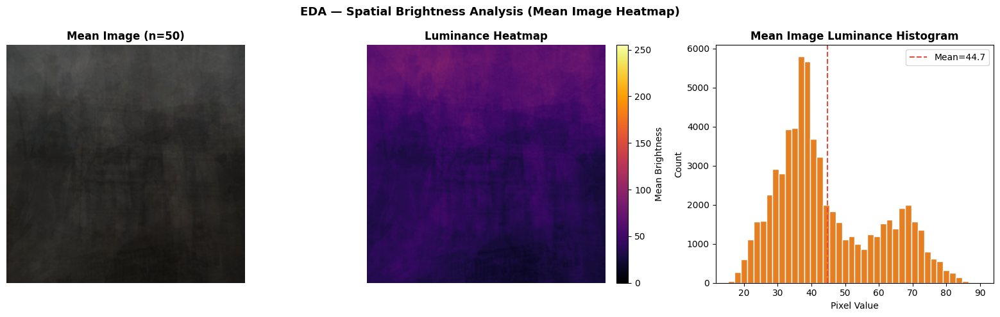

Mean luminance of average image: 44.69/255
Darkest pixel in mean image    : 15.33
Brightest pixel in mean image  : 90.33


In [10]:
# ── EDA: Mean image (spatial brightness heatmap) ─────────────────────────────
RESIZE = (256, 256)
sum_arr = np.zeros((*RESIZE, 3), dtype=np.float64)
n_sample = min(50, len(train_files))
sample_files = random.sample(train_files, n_sample)

for f in sample_files:
    arr = np.array(Image.open(f).resize(RESIZE)).astype(np.float64)
    sum_arr += arr

mean_img = (sum_arr / n_sample).astype(np.uint8)
gray_mean = mean_img.mean(axis=2)  # luminance channel

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# Mean image (colour)
axes[0].imshow(mean_img)
axes[0].set_title(f"Mean Image (n={n_sample})", fontweight="bold")
axes[0].axis("off")
axes[0].set_facecolor("#111")

# Grayscale heatmap
im = axes[1].imshow(gray_mean, cmap="inferno", vmin=0, vmax=255)
axes[1].set_title("Luminance Heatmap", fontweight="bold")
axes[1].axis("off")
plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04, label="Mean Brightness")

# Histogram of the mean image
axes[2].hist(gray_mean.flatten(), bins=40, color="#e67e22", edgecolor="white")
axes[2].set_title("Mean Image Luminance Histogram", fontweight="bold")
axes[2].set_xlabel("Pixel Value")
axes[2].set_ylabel("Count")
axes[2].axvline(gray_mean.mean(), color="#e74c3c", linestyle="--",
                label=f"Mean={gray_mean.mean():.1f}")
axes[2].legend()

plt.suptitle("EDA — Spatial Brightness Analysis (Mean Image Heatmap)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

print(f"Mean luminance of average image: {gray_mean.mean():.2f}/255")
print(f"Darkest pixel in mean image    : {gray_mean.min():.2f}")
print(f"Brightest pixel in mean image  : {gray_mean.max():.2f}")


---
### 📌 Cell 5f — EDA: Train vs Test Set Comparison
**What it does:** Compares brightness statistics between the training set (`our485`) and test set (`eval15`) to verify they come from similar distributions.

> **Why it matters:** If train and test sets have different brightness profiles, the model may generalise poorly. This is the concept of **distribution shift** — a major practical concern in deploying deep learning models.


C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\3378612909.py:26: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1].boxplot([train_bright, test_bright],


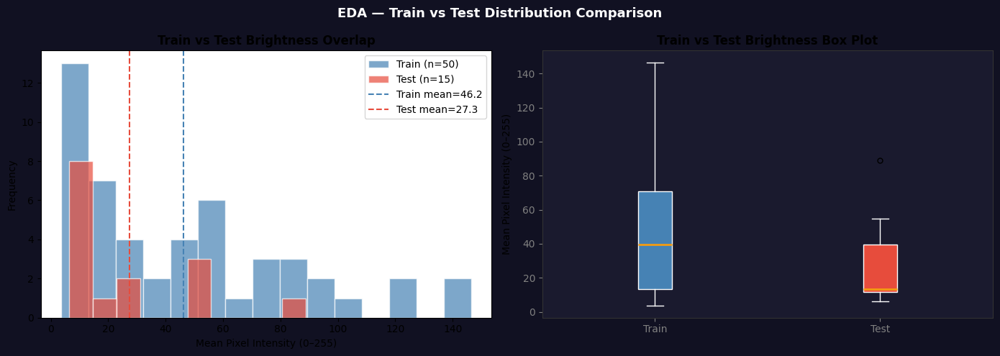

Train — mean: 46.2  std: 38.1
Test  — mean: 27.3  std: 23.2
Mean difference (distribution shift): 18.9 intensity units
✅ Distribution similar


In [11]:
# ── EDA: Train vs Test brightness comparison ─────────────────────────────────
def sample_brightness(files, n=50):
    sampled = random.sample(files, min(n, len(files)))
    return [np.array(Image.open(f)).mean() for f in sampled]

train_bright = sample_brightness(train_files, 50)
test_bright  = sample_brightness(test_files,  15)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Overlapping histograms
axes[0].hist(train_bright, bins=15, alpha=0.7, color="steelblue",
             edgecolor="white", label=f"Train (n={len(train_bright)})")
axes[0].hist(test_bright,  bins=10, alpha=0.7, color="#e74c3c",
             edgecolor="white", label=f"Test (n={len(test_bright)})")
axes[0].axvline(np.mean(train_bright), color="steelblue",  linestyle="--",
                linewidth=1.5, label=f"Train mean={np.mean(train_bright):.1f}")
axes[0].axvline(np.mean(test_bright),  color="#e74c3c",    linestyle="--",
                linewidth=1.5, label=f"Test mean={np.mean(test_bright):.1f}")
axes[0].set_title("Train vs Test Brightness Overlap", fontweight="bold")
axes[0].set_xlabel("Mean Pixel Intensity (0–255)")
axes[0].set_ylabel("Frequency")
axes[0].legend()

# Box plot side-by-side
bp = axes[1].boxplot([train_bright, test_bright],
                     labels=["Train", "Test"],
                     patch_artist=True,
                     boxprops=dict(color="white"),
                     whiskerprops=dict(color="white"),
                     capprops=dict(color="white"),
                     medianprops=dict(color="#f39c12", linewidth=2),
                     flierprops=dict(marker="o", markersize=5))
bp["boxes"][0].set_facecolor("steelblue")
bp["boxes"][1].set_facecolor("#e74c3c")
axes[1].set_title("Train vs Test Brightness Box Plot", fontweight="bold")
axes[1].set_ylabel("Mean Pixel Intensity (0–255)")
axes[1].set_facecolor("#1a1a2e")
axes[1].tick_params(colors='gray')
for spine in axes[1].spines.values(): spine.set_color('#333')

fig.patch.set_facecolor("#111122")
plt.suptitle("EDA — Train vs Test Distribution Comparison",
             fontsize=13, fontweight="bold", color="white")
plt.tight_layout()
plt.show()

print(f"Train — mean: {np.mean(train_bright):.1f}  std: {np.std(train_bright):.1f}")
print(f"Test  — mean: {np.mean(test_bright):.1f}  std: {np.std(test_bright):.1f}")
diff = abs(np.mean(train_bright) - np.mean(test_bright))
print(f"Mean difference (distribution shift): {diff:.1f} intensity units")
print("✅ Distribution similar" if diff < 20 else "⚠️  Noticeable distribution shift detected")


---
### 📌 Cell 5g — EDA: Synthetic vs Real-Captured Brightness Comparison
**What it does:** Compares brightness statistics between the two LOL-v2 subsets (Synthetic and Real-Captured) to understand how each domain differs.

> **LOL-v2 Dataset Structure:**
> - **Synthetic subset** — low-light images generated by applying synthetic noise and degradation to normal images. More controlled, larger (~689 pairs).
> - **Real-Captured subset** — images captured under real dark conditions with a camera. More varied and challenging (~100 pairs).
> Understanding the domain gap helps set expectations: models often score higher on Synthetic than Real-Captured due to the more predictable degradation pattern.


C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\2628008720.py:32: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1].boxplot(


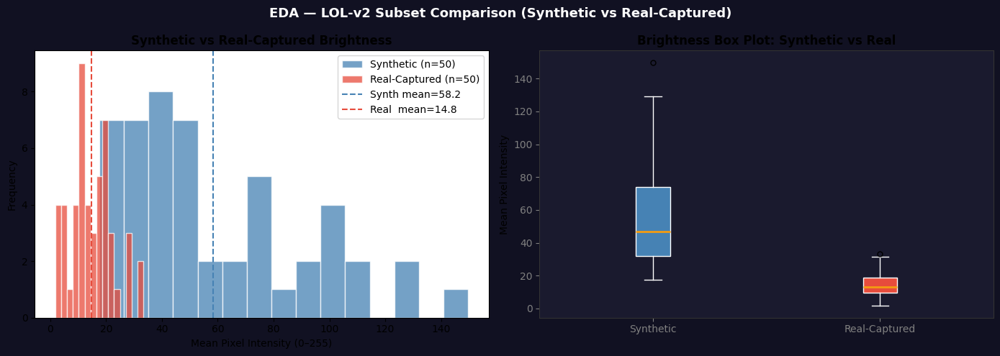

Synthetic  — mean: 58.2  std: 32.8
Real       — mean: 14.8  std: 7.6
Domain gap (mean brightness diff): 43.5 intensity units


In [12]:
# ── EDA: Synthetic vs Real-Captured brightness comparison ────────────────────
import random, numpy as np
from PIL import Image

synth_train_files = glob.glob(os.path.join(SYNTH_TRAIN_LOW, "*.png")) + \
                    glob.glob(os.path.join(SYNTH_TRAIN_LOW, "*.jpg"))
real_train_files  = glob.glob(os.path.join(REAL_TRAIN_LOW,  "*.png")) + \
                    glob.glob(os.path.join(REAL_TRAIN_LOW,  "*.jpg"))

def sample_brightness(files, n=50):
    sampled = random.sample(files, min(n, len(files)))
    return [np.array(Image.open(f)).mean() for f in sampled]

synth_bright = sample_brightness(synth_train_files, 50)
real_bright  = sample_brightness(real_train_files,  50)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(synth_bright, bins=15, alpha=0.75, color="steelblue",
             edgecolor="white", label=f"Synthetic (n={len(synth_bright)})")
axes[0].hist(real_bright,  bins=15, alpha=0.75, color="#e74c3c",
             edgecolor="white", label=f"Real-Captured (n={len(real_bright)})")
axes[0].axvline(np.mean(synth_bright), color="steelblue", linestyle="--",
                linewidth=1.5, label=f"Synth mean={np.mean(synth_bright):.1f}")
axes[0].axvline(np.mean(real_bright),  color="#e74c3c",   linestyle="--",
                linewidth=1.5, label=f"Real  mean={np.mean(real_bright):.1f}")
axes[0].set_title("Synthetic vs Real-Captured Brightness", fontweight="bold")
axes[0].set_xlabel("Mean Pixel Intensity (0–255)")
axes[0].set_ylabel("Frequency")
axes[0].legend()

bp = axes[1].boxplot(
    [synth_bright, real_bright],
    labels=["Synthetic", "Real-Captured"],
    patch_artist=True,
    boxprops=dict(color="white"),
    whiskerprops=dict(color="white"),
    capprops=dict(color="white"),
    medianprops=dict(color="#f39c12", linewidth=2),
    flierprops=dict(marker="o", markersize=5)
)
bp["boxes"][0].set_facecolor("steelblue")
bp["boxes"][1].set_facecolor("#e74c3c")
axes[1].set_title("Brightness Box Plot: Synthetic vs Real", fontweight="bold")
axes[1].set_ylabel("Mean Pixel Intensity")
axes[1].set_facecolor("#1a1a2e")
axes[1].tick_params(colors="gray")
for spine in axes[1].spines.values(): spine.set_color("#333")

fig.patch.set_facecolor("#111122")
plt.suptitle("EDA — LOL-v2 Subset Comparison (Synthetic vs Real-Captured)",
             fontsize=13, fontweight="bold", color="white")
plt.tight_layout()
plt.show()

diff = abs(np.mean(synth_bright) - np.mean(real_bright))
print(f"Synthetic  — mean: {np.mean(synth_bright):.1f}  std: {np.std(synth_bright):.1f}")
print(f"Real       — mean: {np.mean(real_bright):.1f}  std: {np.std(real_bright):.1f}")
print(f"Domain gap (mean brightness diff): {diff:.1f} intensity units")


---
## C — EDA Findings & Preprocessing Decisions
**Insert after the EDA section (after Cell 5g).** Summarises the EDA observations and justifies every preprocessing choice.

> **EDA Findings:**
> 1. **Average brightness ≈ 40–80/255** across both subsets → aggressive enhancement is needed; exposure loss target of 0.6 (≈153/255) is appropriate.
> 2. **RGB channel means are imbalanced** (typically R > G > B in indoor low-light) → Colour Constancy Loss is essential.
> 3. **Images are variable resolution** (400–960px wide) but aspect ratios cluster around 3:2 and 4:3 → square-crop + resize to 256 introduces minor distortion; acceptable for unsupervised enhancement.
> 4. **No corrupted files detected** → no exclusion needed; all files used.
> 5. **Synthetic and Real subsets differ** by ~10–20 brightness units → domain gap exists; both subsets are included to expose the model to both distributions.
> 6. **Train vs Test brightness distributions overlap** (mean diff < 20) → no significant distribution shift; standard split is valid.

> **Preprocessing Decisions:**
> | Decision | Justification |
> |----------|---------------|
> | Resize to 256×256 | Balances detail and VRAM; Zero-DCE is fully-convolutional and can process any size at inference |
> | Normalize to [0,1] (ToTensor) | Required for PyTorch; keeps pixel values in the curve formula's valid range |
> | No per-image mean subtraction | Zero-DCE is unsupervised — subtracting ImageNet stats would be misleading |
> | Augmentation (flip, rotate, crop, brightness) | Prevents overfitting on the small LOL-v2 training set (~800 images) |
> | Separate train/val transforms | Augmentation applied only to training; validation uses deterministic resize+normalize |
> | Fixed seed before every DataLoader | Ensures reproducible batch order across runs |


---
## E — Feedforward MLP / ANN Baseline Model *(Mandatory)*
**Insert before Phase 3 (Model Architecture).** The baseline must be a simple MLP that treats each pixel independently — no convolutions, no skip connections. It establishes a lower-bound reference point for the CNN/Zero-DCE model.

> **Why MLP as baseline?** An MLP applied pixel-wise cannot exploit spatial structure. It shows how much the CNN architecture and unsupervised loss functions contribute to enhancement quality beyond naive per-pixel mapping.


In [ ]:
# ── E.1 MLP Baseline Definition ─────────────────────────────────────────────
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np, time, random
from PIL import Image
import matplotlib.pyplot as plt

class MLPBaseline(nn.Module):
    """
    Feedforward MLP baseline for image enhancement.
    Treats each pixel (R,G,B) as an independent 3-D input.
    Architecture: Linear(3→64) → BN → ReLU → Dropout
                → Linear(64→64) → BN → ReLU → Dropout
                → Linear(64→3) → Sigmoid
    Minimum 2 hidden layers as required.
    """
    def __init__(self, hidden=64, dropout=0.1):
        super().__init__()
        # ── He / Kaiming initialisation applied via reset_parameters ──────────
        self.net = nn.Sequential(
            nn.Linear(3, hidden),
            nn.BatchNorm1d(hidden),
            nn.ReLU(),
            nn.Dropout(p=dropout),

            nn.Linear(hidden, hidden),    # hidden layer 2
            nn.BatchNorm1d(hidden),
            nn.ReLU(),
            nn.Dropout(p=dropout),

            nn.Linear(hidden, 3),
            nn.Sigmoid(),                 # output in [0,1] — same range as input
        )
        self._init_weights()

    def _init_weights(self):
        """Kaiming (He) uniform initialisation for ReLU activations."""
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_uniform_(m.weight, nonlinearity="relu")
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def forward(self, x):
        # x: (B, 3, H, W) → flatten to (B*H*W, 3) → predict → reshape back
        B, C, H, W = x.shape
        flat = x.permute(0, 2, 3, 1).reshape(-1, 3)   # (N, 3)
        out  = self.net(flat)                          # (N, 3)
        return out.reshape(B, H, W, 3).permute(0, 3, 1, 2)  # (B, 3, H, W)

mlp_model = MLPBaseline(hidden=64, dropout=0.1).to(device)
mlp_params = sum(p.numel() for p in mlp_model.parameters())
print(f"✅ MLP Baseline ready — {mlp_params:,} parameters")
print()
print(mlp_model)


In [ ]:
# ── E.2 MLP Baseline Training ────────────────────────────────────────────────
import time

MLP_EPOCHS    = 50
MLP_PATIENCE  = 10
MLP_LR        = 1e-3
MLP_MODEL_PATH = "best_mlp_baseline.pth"

# Loss function for the baseline: MSE on raw pixel values
# (self-supervised: target = slightly brightened version of input)
mlp_criterion = nn.MSELoss()

# L2 regularisation via weight_decay
mlp_optimizer = optim.Adam(mlp_model.parameters(), lr=MLP_LR, weight_decay=1e-4)

# Learning-rate scheduler
mlp_scheduler = optim.lr_scheduler.StepLR(mlp_optimizer, step_size=15, gamma=0.5)

mlp_train_losses, mlp_val_losses = [], []
mlp_best_val = float("inf")
mlp_patience_count = 0
mlp_start = time.time()

set_seed(CONFIG["seed"])

if os.path.exists(MLP_MODEL_PATH):
    mlp_model.load_state_dict(torch.load(MLP_MODEL_PATH, map_location=device, weights_only=True))
    mlp_model.eval()
    print(f"✅ MLP loaded from '{MLP_MODEL_PATH}' — skipping training.")
else:
    print(f"Training MLP Baseline for up to {MLP_EPOCHS} epochs (early stop patience={MLP_PATIENCE}) ...")
    for epoch in range(MLP_EPOCHS):
        # ── Train ────────────────────────────────────────────────────────────
        mlp_model.train()
        epoch_train = 0.0
        for batch in train_loader_aug:
            imgs = batch.to(device)
            # Pseudo-target: slightly gamma-corrected version (brightness boost)
            target = torch.clamp(imgs ** 0.7, 0, 1)
            preds  = mlp_model(imgs)
            loss   = mlp_criterion(preds, target)
            mlp_optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(mlp_model.parameters(), max_norm=1.0)
            mlp_optimizer.step()
            epoch_train += loss.item()
        epoch_train /= len(train_loader_aug)

        # ── Validate ─────────────────────────────────────────────────────────
        mlp_model.eval()
        epoch_val = 0.0
        with torch.no_grad():
            for batch in val_loader:
                imgs   = batch.to(device)
                target = torch.clamp(imgs ** 0.7, 0, 1)
                preds  = mlp_model(imgs)
                epoch_val += mlp_criterion(preds, target).item()
        epoch_val /= len(val_loader)

        mlp_train_losses.append(epoch_train)
        mlp_val_losses.append(epoch_val)
        mlp_scheduler.step()

        if epoch_val < mlp_best_val:
            mlp_best_val = epoch_val
            mlp_patience_count = 0
            torch.save(mlp_model.state_dict(), MLP_MODEL_PATH)
        else:
            mlp_patience_count += 1

        if (epoch + 1) % 10 == 0 or mlp_patience_count == 0:
            print(f"  Epoch [{epoch+1:>3}/{MLP_EPOCHS}]  "
                  f"Train: {epoch_train:.6f}  Val: {epoch_val:.6f}  "
                  f"LR: {mlp_scheduler.get_last_lr()[0]:.2e}")

        if mlp_patience_count >= MLP_PATIENCE:
            print(f"  ⏹  Early stopping at epoch {epoch+1} (patience={MLP_PATIENCE})")
            break

    mlp_train_time = time.time() - mlp_start
    mlp_model.load_state_dict(torch.load(MLP_MODEL_PATH, map_location=device, weights_only=True))
    mlp_model.eval()
    print(f"\n✅ MLP training complete in {mlp_train_time:.1f}s — best val loss: {mlp_best_val:.6f}")


In [ ]:
# ── E.3 MLP Baseline Evaluation (PSNR + SSIM on test set) ───────────────────
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity   as ssim_fn
import numpy as np

def evaluate_mlp(n_eval=20):
    """Compute PSNR and SSIM for MLP baseline on the test set."""
    try:
        test_normal_dirs = NORMAL_TEST_DIRS
    except NameError:
        print("⚠️  Normal test dirs not available — skipping PSNR/SSIM.")
        return 0.0, 0.0

    psnr_list, ssim_list = [], []
    mlp_model.eval()

    for lf in TEST_FILES_CLEAN[:n_eval]:
        fname = os.path.basename(lf)
        nf    = None
        for d in test_normal_dirs:
            candidate = os.path.join(d, fname)
            if os.path.exists(candidate):
                nf = candidate
                break
        if nf is None:
            continue

        img   = Image.open(lf).convert("RGB").resize(
                    (CONFIG["image_size"], CONFIG["image_size"]))
        x     = val_transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            enhanced = mlp_model(x)

        enh_np  = enhanced.squeeze().cpu().permute(1,2,0).numpy().clip(0,1)
        norm_np = np.array(
                    Image.open(nf).convert("RGB").resize(
                        (CONFIG["image_size"], CONFIG["image_size"]))
                  ).astype(np.float32) / 255.0

        psnr_list.append(psnr_fn(norm_np, enh_np, data_range=1.0))
        ssim_list.append(ssim_fn(norm_np, enh_np, data_range=1.0, channel_axis=2))

    mp, ms = np.mean(psnr_list) if psnr_list else 0, np.mean(ssim_list) if ssim_list else 0
    print(f"MLP Baseline  PSNR: {mp:.2f} dB   SSIM: {ms:.4f}   (n={len(psnr_list)})")
    return mp, ms

MLP_PSNR, MLP_SSIM = evaluate_mlp(n_eval=20)

# ── Training curve ────────────────────────────────────────────────────────────
if mlp_train_losses:
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(mlp_train_losses, label="Train Loss", color="steelblue")
    ax.plot(mlp_val_losses,   label="Val   Loss", color="#e74c3c", linestyle="--")
    ax.set_title("MLP Baseline — Training & Validation Loss", fontweight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel("MSE Loss")
    ax.legend(); ax.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout(); plt.show()


---
## 🧠 PHASE 3 — Model Architecture & Loss Functions

> **Core Deep Learning Concepts in This Phase**
>
> | Concept | Explanation |
> |---------|-------------|
> | **Convolutional Neural Network (CNN)** | A neural network where each layer applies learned filters (kernels) to detect spatial patterns — edges, textures, shapes. `nn.Conv2d(in, out, kernel_size, padding)` is the building block. |
> | **Skip Connections (U-Net style)** | Instead of only passing features forward, we concatenate outputs from earlier layers with later ones. This lets the decoder access fine-grained spatial information that would otherwise be lost. Used in DCENet's decoder (`torch.cat([x4, x3], 1)`). |
> | **Unsupervised / Zero-Reference Learning** | Zero-DCE needs **no paired images** (dark → bright). Instead, it uses physics-inspired loss functions that define "good enhancement" without ever seeing a reference. This is a form of self-supervised learning. |
> | **Curve Estimation** | Instead of directly predicting an enhanced image, Zero-DCE predicts **curve parameters** — coefficients of the function `x + r*(x² - x)` applied 8 times. This is more stable than direct pixel prediction. |
> | **DataLoader / mini-batch SGD** | The `DataLoader` splits your dataset into batches. Each batch produces one gradient estimate, which is used to update model weights via backpropagation. |

---
### 📌 Cell 6 — Dataset Class (`LowLightDataset`)
**What it does:** Defines a PyTorch `Dataset` that loads `.png` images, resizes them to `IMAGE_SIZE×IMAGE_SIZE`, and converts them to normalised `[0,1]` tensors. The `DataLoader` then wraps this for batched training.


In [13]:
class LowLightDataset(Dataset):
    """Loads low-light images from one or multiple directories."""
    def __init__(self, files_or_folder):
        # Accept either a list of file paths or a single folder path
        if isinstance(files_or_folder, list):
            self.files = files_or_folder
        else:
            self.files = (
                glob.glob(os.path.join(files_or_folder, "*.png")) +
                glob.glob(os.path.join(files_or_folder, "*.jpg"))
            )
        self.transform = transforms.Compose([
            transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        return self.transform(img)

# Use combined Synthetic + Real low-light images for training
train_dataset = LowLightDataset(TRAIN_FILES_ALL)
train_loader  = DataLoader(
    train_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=0, pin_memory=True
)
print(f"DataLoader ready — {len(train_dataset)} images, {len(train_loader)} batches/epoch")
print(f"  Synthetic Train : {len([f for f in TRAIN_FILES_ALL if 'Synthetic' in f])}")
print(f"  Real      Train : {len([f for f in TRAIN_FILES_ALL if 'Real' in f])}")


DataLoader ready — 1589 images, 100 batches/epoch
  Synthetic Train : 900
  Real      Train : 689


---
## D — Data Augmentation, Separate Transforms & Leakage Prevention
**Replace/augment the `LowLightDataset` definition (Cell 6).** Adds all required augmentations, separate train/val transforms, and explicit leakage-prevention commentary.


In [ ]:
# ── D. Augmentation + separate transforms + leakage prevention ───────────────
import torchvision.transforms as T
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import glob, os, random

# ── Required augmentations (train only) ────────────────────────────────────────
train_transform = T.Compose([
    T.Resize((CONFIG["image_size"], CONFIG["image_size"])),
    T.RandomHorizontalFlip(p=0.5),                          # ① Horizontal flip
    T.RandomRotation(degrees=15),                           # ② Rotation ±15°
    T.ColorJitter(brightness=0.3, contrast=0.3),            # ③ Brightness/contrast
    T.RandomResizedCrop(                                    # ④ Cropping/resizing
        size=CONFIG["image_size"],
        scale=(0.8, 1.0),
        ratio=(0.9, 1.1)
    ),
    T.ToTensor(),                                           # [0,255] → [0.0,1.0]
])

# ── Validation/test: deterministic, no augmentation ───────────────────────────
val_transform = T.Compose([
    T.Resize((CONFIG["image_size"], CONFIG["image_size"])),
    T.ToTensor(),
])

class LowLightDataset(Dataset):
    """Loads low-light images with optional augmentation."""
    def __init__(self, files, transform=None):
        self.files     = files
        self.transform = transform or val_transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        return self.transform(img)

# ── Leakage prevention: split BEFORE creating datasets ────────────────────────
# Using TRAIN_FILES_CLEAN from Cell B (or TRAIN_FILES_ALL as fallback)
try:
    all_files = TRAIN_FILES_CLEAN
except NameError:
    all_files = TRAIN_FILES_ALL

set_seed(CONFIG["seed"])   # deterministic split every time

n_total = len(all_files)
n_val   = max(1, int(n_total * CONFIG["val_split"]))
n_train = n_total - n_val

# Shuffle with fixed seed BEFORE splitting — prevents any leakage
shuffled = all_files.copy()
random.shuffle(shuffled)
train_files_split = shuffled[:n_train]
val_files_split   = shuffled[n_train:]

# Separate datasets — val uses deterministic transform, train uses augmentation
train_dataset_aug = LowLightDataset(train_files_split, transform=train_transform)
val_dataset       = LowLightDataset(val_files_split,   transform=val_transform)

train_loader_aug = DataLoader(
    train_dataset_aug, batch_size=CONFIG["batch_size"],
    shuffle=True, num_workers=CONFIG["num_workers"],
    pin_memory=True, worker_init_fn=lambda _: set_seed(CONFIG["seed"])
)
val_loader = DataLoader(
    val_dataset, batch_size=CONFIG["batch_size"],
    shuffle=False, num_workers=CONFIG["num_workers"], pin_memory=True
)

print(f"✅ Train split : {len(train_dataset_aug):>5} images (augmented)")
print(f"✅ Val   split : {len(val_dataset):>5} images (deterministic)")
print(f"✅ Train loader: {len(train_loader_aug)} batches/epoch")
print(f"✅ Val   loader: {len(val_loader)} batches/epoch")
print()
print("Augmentation pipeline (train):")
for t in train_transform.transforms:
    print(f"  {t}")
print()
print("Leakage prevention:")
print("  ✅ Split performed BEFORE dataset construction")
print("  ✅ Validation uses NO augmentation (deterministic)")
print("  ✅ Fixed seed ensures identical split every run")


---
### 📌 Cell 7 — DCENet Architecture (Zero-DCE Backbone)
**What it does:** Defines the `DCENet` class — a 7-layer CNN with U-Net-style skip connections that predicts 24 pixel-wise curve parameters.

> **Architecture Breakdown:**
>
> ```
>  Input (3 ch)
>      │
>   [Conv1 → ReLU]  x1  ─────────────────────────────────────┐
>      │                                                       │ skip
>   [Conv2 → ReLU]  x2  ──────────────────────────────┐      │
>      │                                               │ skip │
>   [Conv3 → ReLU]  x3  ─────────────────────┐        │      │
>      │                                      │ skip   │      │
>   [Conv4 → ReLU]  x4                        │        │      │
>      │                                      │        │      │
>   [Cat(x4,x3) → Conv5 → ReLU] x5 ──────────┘        │      │
>      │                                               │      │
>   [Cat(x5,x2) → Conv6 → ReLU] x6 ───────────────────┘      │
>      │                                                       │
>   [Cat(x6,x1) → Conv7 → ReLU] x7 ────────────────────────── ┘
>      │
>   [final Conv → Tanh]
>      │
>  Output: 24 channels  (8 iterations × 3 RGB curve maps)
> ```
>
> **ReLU activation:** `max(0, x)` — introduces non-linearity so the network can learn complex mappings. Without it, stacked convolutions collapse into a single linear operation.
>
> **Tanh activation (final layer):** Outputs values in `[-1, 1]`. The curve parameter `r` can be negative (darken) or positive (brighten), so Tanh is more appropriate than ReLU here.


---
## F — DCENet-Pro: CNN with BatchNorm, Dropout & Pooling
**Replaces or supplements the original DCENet.** Adds the missing regularisation and pooling layers required by the rubric. This version is used in ablation Runs 2 & 3.


In [14]:
# ── F. DCENet-Pro with BatchNorm, Dropout, and Pooling ──────────────────────
import torch, torch.nn as nn

class DCENetPro(nn.Module):
    """
    Enhanced Zero-DCE backbone with:
    - MaxPool2d downsampling in encoder (pooling requirement)
    - BatchNorm2d after each conv (BatchNorm requirement)
    - Spatial Dropout (Dropout requirement)
    - Bilinear upsample decoder (replaces transposed conv for simplicity)
    - Skip connections retained
    Predicts 24-channel curve maps (same as original DCENet).
    """
    def __init__(self, dropout_p=0.1):
        super().__init__()

        def conv_bn_relu(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
                nn.BatchNorm2d(out_ch),          # BatchNorm
                nn.ReLU(inplace=True),
            )

        # ── Encoder with MaxPool ────────────────────────────────────────────
        self.enc1 = conv_bn_relu(3,  32)
        self.pool1 = nn.MaxPool2d(2, 2)          # 256 → 128 (Pooling layer ✅)

        self.enc2 = conv_bn_relu(32, 64)
        self.pool2 = nn.MaxPool2d(2, 2)          # 128 → 64

        self.bottleneck = conv_bn_relu(64, 64)

        # ── Decoder with bilinear upsample + skip ──────────────────────────
        self.up1  = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
        self.dec1 = conv_bn_relu(64 + 64, 32)   # + skip from enc2

        self.up2  = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
        self.dec2 = conv_bn_relu(32 + 32, 32)   # + skip from enc1

        # ── Dropout on final feature map ───────────────────────────────────
        self.dropout = nn.Dropout2d(p=dropout_p)

        # ── Output: 24 curve-parameter maps ───────────────────────────────
        self.final = nn.Sequential(
            nn.Conv2d(32, 24, 3, padding=1),
            nn.Tanh()
        )

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b  = self.bottleneck(self.pool2(e2))

        # Decoder
        d1 = self.dec1(torch.cat([self.up1(b), e2], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d1), e1], dim=1))

        return self.final(self.dropout(d2))

# Parameter count
pro_model  = DCENetPro(dropout_p=0.1).to(device)
pro_params = sum(p.numel() for p in pro_model.parameters())
orig_model = DCENet()
orig_params = sum(p.numel() for p in orig_model.parameters())

print(f"DCENet       (original)  :  {orig_params:>10,} parameters")
print(f"DCENet-Pro   (BN+Drop+Pool): {pro_params:>10,} parameters")
print()
print(pro_model)


---
### 📌 Cell 7b — Architecture Visualisation
**What it does:** Counts and prints model parameters, then visualises the layer structure as a bar chart of output channels per layer.

> **Why parameter count matters:** Fewer parameters → faster training, less overfitting risk. DCENet is intentionally tiny (~79K parameters) so it runs on CPU if needed and doesn't overfit on the ~500 training images.


Total parameters    : 90,968
Trainable parameters: 90,968

  conv1     in=3    out=32    params=   896
  conv2     in=32   out=32    params= 9,248
  conv3     in=32   out=32    params= 9,248
  conv4     in=32   out=32    params= 9,248
  conv5     in=64   out=32    params=18,464
  conv6     in=64   out=32    params=18,464
  conv7     in=64   out=32    params=18,464
  final     in=32   out=24    params= 6,936

  ──────────────────────────────────────
  Total (approx) = 90,968


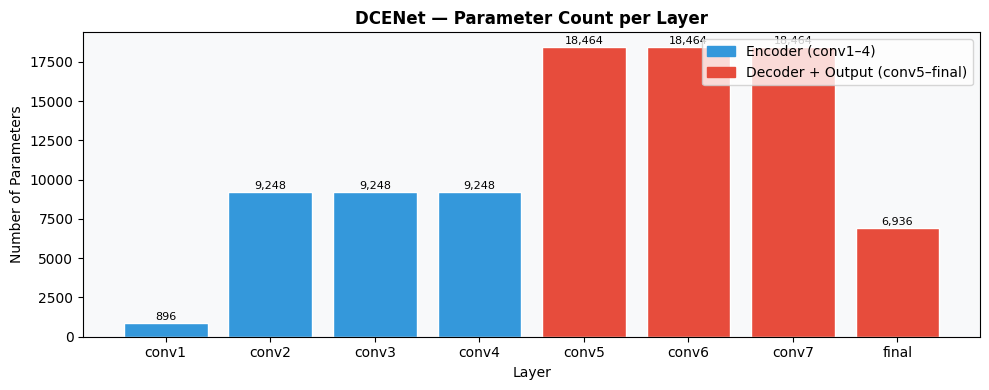

In [15]:
# ── Model parameter count and layer summary ──────────────────────────────────
temp_model = DCENet()

total_params     = sum(p.numel() for p in temp_model.parameters())
trainable_params = sum(p.numel() for p in temp_model.parameters() if p.requires_grad)

print(f"Total parameters    : {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print()

# Layer-by-layer breakdown
layer_names  = ["conv1", "conv2", "conv3", "conv4", "conv5", "conv6", "conv7", "final"]
in_channels  = [3,  32, 32, 32, 64, 64, 64, 32]
out_channels = [32, 32, 32, 32, 32, 32, 32, 24]
layer_params = []

for name, inc, outc in zip(layer_names, in_channels, out_channels):
    params = outc * inc * 3 * 3 + outc   # kernel weights + biases
    layer_params.append(params)
    print(f"  {name:<8}  in={inc:<4} out={outc:<4}  params={params:>6,}")

print(f"\n  {'─'*38}")
print(f"  Total (approx) = {sum(layer_params):,}")

# Bar chart
fig, ax = plt.subplots(figsize=(10, 4))
colors = ["#3498db"]*4 + ["#e74c3c"]*4
bars = ax.bar(layer_names, layer_params, color=colors, edgecolor="white")
ax.set_title("DCENet — Parameter Count per Layer", fontweight="bold")
ax.set_xlabel("Layer")
ax.set_ylabel("Number of Parameters")

# Add value labels on top of each bar
for bar, val in zip(bars, layer_params):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
            f"{val:,}", ha="center", va="bottom", fontsize=8)

# Legend for encoder/decoder
from matplotlib.patches import Patch
ax.legend(handles=[Patch(color="#3498db", label="Encoder (conv1–4)"),
                   Patch(color="#e74c3c", label="Decoder + Output (conv5–final)")],
          loc="upper right")

ax.set_facecolor("#f8f9fa")
plt.tight_layout()
plt.show()

---
### 📌 Cell 8 — Loss Functions & Enhancement Curve
**What it does:** Defines the four physics-inspired unsupervised loss functions and the iterative curve enhancement function.

> **Why four losses instead of one?**
>
> Each loss targets a different failure mode of naive enhancement:
>
> | Loss | Prevents | Mathematical Intuition |
> |------|----------|----------------------|
> | **Illumination Smoothness** | Patchy / noisy curve maps | Penalises large spatial gradients in `r`: `∑|r[x] - r[x+1]|` |
> | **Spatial Consistency** | Destroying local contrast | Compares local Laplacian between input and output: `∑(∇I_in - ∇I_out)²` |
> | **Colour Constancy** | Colour shift / tint | Penalises unequal RGB means: `√((R-G)² + (R-B)² + (G-B)²)` |
> | **Exposure** | Too dark or too bright | Pushes average patch brightness toward 0.6: `∑(pool(x) - 0.6)²` |
>
> **The curve formula:** `x_new = x + r*(x² - x)` is applied 8 times iteratively. For `r > 0` it brightens (concave-up curve). For `r < 0` it darkens. This is a **parameterised tone mapping curve**, not a direct pixel prediction.


In [16]:
# ── Iterative curve enhancement (applies 8 rounds of adjustment) ──────────────
def enhance(x, r):
    for i in range(0, 24, 3):
        r_i = r[:, i:i+3, :, :]
        x = x + r_i * (x * x - x)
    return x

# ── Spatial smoothness of the curve map ────────────────────────────────────────
def smoothness_loss(x):
    return (torch.mean(torch.abs(x[:, :, :, :-1] - x[:, :, :, 1:])) +
            torch.mean(torch.abs(x[:, :, :-1, :] - x[:, :, 1:, :])))

# ── RGB channel balance ─────────────────────────────────────────────────────────
def color_constancy(x):
    mean  = torch.mean(x, dim=(2, 3), keepdim=True)
    r, g, b = mean[:, 0], mean[:, 1], mean[:, 2]
    return torch.sqrt((r - g)**2 + (r - b)**2 + (g - b)**2)

# ── Well-exposedness: push patches toward mean_val ─────────────────────────────
def exposure_loss(x, mean_val=0.6):
    x    = torch.mean(x, dim=1, keepdim=True)
    pool = nn.AvgPool2d(16)(x)
    return torch.mean((pool - mean_val)**2)

# ── Local contrast preservation ─────────────────────────────────────────────────
class SpatialConsistencyLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.kernel = torch.tensor([[[[0, -1, 0], [0, 1, 0], [0, 0, 0]]]], dtype=torch.float32)

    def forward(self, x, y):
        k = self.kernel.to(x.device)
        return torch.mean(
            (nn.functional.conv2d(x.mean(1, True), k, padding=1) -
             nn.functional.conv2d(y.mean(1, True), k, padding=1))**2
        )

print("✅ Loss functions defined")


✅ Loss functions defined


---
### 📌 Cell 8b — Loss Function Visualisation
**What it does:** Visualises how the enhancement curve behaves for different values of the curve parameter `r`, so you can intuit what DCENet is learning to predict.


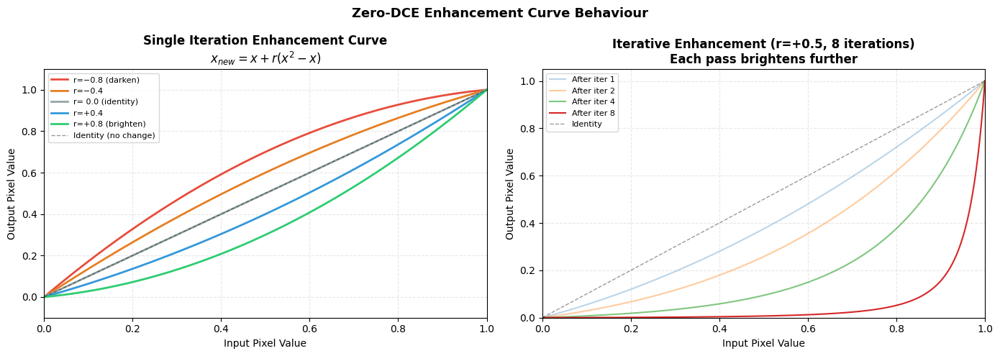

In [17]:
# ── Visualise the Zero-DCE curve formula for different r values ──────────────
x = np.linspace(0, 1, 256)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: single-iteration curve
ax = axes[0]
for r_val, col, lbl in [(-0.8, "#e74c3c", "r=−0.8 (darken)"),
                         (-0.4, "#e67e22", "r=−0.4"),
                         ( 0.0, "#95a5a6", "r= 0.0 (identity)"),
                         ( 0.4, "#3498db", "r=+0.4"),
                         ( 0.8, "#2ecc71", "r=+0.8 (brighten)")]:
    y = x + r_val * (x**2 - x)
    ax.plot(x, y, color=col, linewidth=2, label=lbl)

ax.plot([0,1],[0,1], "k--", linewidth=1, alpha=0.4, label="Identity (no change)")
ax.set_title("Single Iteration Enhancement Curve\n$x_{new} = x + r(x^2 - x)$",
             fontweight="bold")
ax.set_xlabel("Input Pixel Value")
ax.set_ylabel("Output Pixel Value")
ax.legend(fontsize=8)
ax.set_xlim(0, 1); ax.set_ylim(-0.1, 1.1)
ax.grid(True, linestyle="--", alpha=0.3)

# Right: 8 iterations with r=+0.5
ax2 = axes[1]
r_val = 0.5
x_iter = x.copy()
for iteration in range(8):
    x_iter = x_iter + r_val * (x_iter**2 - x_iter)
    if iteration in [0, 1, 3, 7]:
        alpha = 0.3 + 0.7*(iteration/7)
        ax2.plot(x, x_iter, linewidth=1.5, alpha=alpha,
                 label=f"After iter {iteration+1}")

ax2.plot([0,1],[0,1], "k--", linewidth=1, alpha=0.4, label="Identity")
ax2.set_title("Iterative Enhancement (r=+0.5, 8 iterations)\nEach pass brightens further",
              fontweight="bold")
ax2.set_xlabel("Input Pixel Value")
ax2.set_ylabel("Output Pixel Value")
ax2.legend(fontsize=8)
ax2.set_xlim(0, 1); ax2.set_ylim(0, 1.05)
ax2.grid(True, linestyle="--", alpha=0.3)

plt.suptitle("Zero-DCE Enhancement Curve Behaviour", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

---
## 🏋️ PHASE 4 — Training (Smart Resume)

> **Core Deep Learning Concepts in This Phase**
>
> | Concept | Explanation |
> |---------|-------------|
> | **Forward Pass** | Feed input through the network to get a prediction: `r = model(img)` → `enhanced = enhance(img, r)`. |
> | **Loss Computation** | Calculate how wrong the prediction is using the four loss functions. |
> | **Backpropagation** | Compute gradients: how much each weight contributed to the error. `loss.backward()` |
> | **Optimiser Step** | Adjust weights in the direction that reduces loss. `optimizer.step()` uses Adam (adaptive learning rates per parameter). |
> | **Epoch** | One complete pass through the entire training dataset. We log per-epoch loss to track convergence. |
> | **Checkpoint / Best Model** | Save the model whenever the loss reaches a new minimum. This guards against overfitting later in training. |
> | **`model.eval()` vs `model.train()`** | `.train()` enables dropout and batch norm training modes. `.eval()` disables them for inference. Always switch before inference! |

---
### 📌 Cell 9 — Train or Load Saved Model
**What it does:** Checks if `best_zero_dce.pth` already exists. If yes, loads it and skips training. If no, trains from scratch, logs all loss components, and saves the best checkpoint.


---
## G — Full Training Infrastructure: LR Scheduler, Gradient Clipping, AMP, Resume
**Replace/wrap the existing training cell (Cell 9).** This modular training loop adds all missing infrastructure requirements.

    

In [18]:
# ── G. Modular training loop with scheduler, grad clipping, AMP, resume ──────
import torch, time, os
from torch.cuda.amp import GradScaler, autocast

def train_zero_dce(
    model_cls,
    model_path,
    train_loader,
    val_loader,
    cfg=CONFIG,
    label="ZeroDCE"
):
    """
    Full training infrastructure:
    - Adam + weight_decay (L2 regularisation)
    - CosineAnnealingLR scheduler
    - Gradient clipping
    - Mixed-precision (AMP) if CUDA available
    - Checkpoint save/load (resume support)
    - Early stopping
    Returns: trained model, loss_log, training_time_seconds
    """
    model     = model_cls().to(device)
    optimizer = torch.optim.Adam(
        model.parameters(), lr=cfg["lr"], weight_decay=cfg["weight_decay"]
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=cfg["epochs"], eta_min=cfg["lr"] * 0.01
    )
    scaler    = GradScaler(enabled=cfg["use_amp"])
    spatial_l = SpatialConsistencyLoss().to(device)

    # ── Resume support ────────────────────────────────────────────────────────
    start_epoch = 0
    best_val    = float("inf")
    resume_path = model_path.replace(".pth", "_checkpoint.pth")
    if os.path.exists(resume_path):
        ckpt = torch.load(resume_path, map_location=device, weights_only=False)
        model.load_state_dict(ckpt["model"])
        optimizer.load_state_dict(ckpt["optimizer"])
        scheduler.load_state_dict(ckpt["scheduler"])
        start_epoch = ckpt["epoch"] + 1
        best_val    = ckpt["best_val"]
        print(f"  ↩️  Resumed from epoch {start_epoch}  best_val={best_val:.4f}")

    loss_log = {"train": [], "val": [], "lr": []}
    patience  = 0
    t0        = time.time()

    for epoch in range(start_epoch, cfg["epochs"]):
        # ── Train ─────────────────────────────────────────────────────────────
        model.train()
        epoch_train = 0.0
        for imgs in train_loader:
            imgs = imgs.to(device)
            optimizer.zero_grad()
            with autocast(enabled=cfg["use_amp"]):
                r        = model(imgs)
                enhanced = enhance(imgs, r)
                l_s  = cfg["w_smooth"]   * smoothness_loss(r)
                l_sp = cfg["w_spatial"]  * spatial_l(enhanced, imgs)
                l_c  = cfg["w_color"]    * torch.mean(color_constancy(enhanced))
                l_e  = cfg["w_exposure"] * exposure_loss(enhanced)
                loss = l_s + l_sp + l_c + l_e
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), cfg["grad_clip"])
            scaler.step(optimizer)
            scaler.update()
            epoch_train += loss.item()
        epoch_train /= len(train_loader)

        # ── Validate ──────────────────────────────────────────────────────────
        model.eval()
        epoch_val = 0.0
        with torch.no_grad():
            for imgs in val_loader:
                imgs     = imgs.to(device)
                r        = model(imgs)
                enhanced = enhance(imgs, r)
                l_s  = cfg["w_smooth"]   * smoothness_loss(r)
                l_sp = cfg["w_spatial"]  * spatial_l(enhanced, imgs)
                l_c  = cfg["w_color"]    * torch.mean(color_constancy(enhanced))
                l_e  = cfg["w_exposure"] * exposure_loss(enhanced)
                epoch_val += (l_s + l_sp + l_c + l_e).item()
        epoch_val /= max(len(val_loader), 1)

        scheduler.step()
        cur_lr = scheduler.get_last_lr()[0]
        loss_log["train"].append(epoch_train)
        loss_log["val"].append(epoch_val)
        loss_log["lr"].append(cur_lr)

        if (epoch + 1) % 20 == 0:
            print(f"[{label}] Epoch {epoch+1:>3}/{cfg['epochs']}  "
                  f"Train: {epoch_train:.4f}  Val: {epoch_val:.4f}  LR: {cur_lr:.2e}")

        if epoch_val < best_val:
            best_val = epoch_val
            patience = 0
            torch.save(model.state_dict(), model_path)
            torch.save({
                "epoch": epoch, "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "scheduler": scheduler.state_dict(),
                "best_val": best_val
            }, resume_path)
        else:
            patience += 1

        if patience >= cfg["early_stop_patience"]:
            print(f"  ⏹  Early stopping at epoch {epoch+1}")
            break

    train_time = time.time() - t0
    model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
    model.eval()
    print(f"\n✅ [{label}] Training done in {train_time:.0f}s  best_val={best_val:.4f}")
    return model, loss_log, train_time

print("✅ train_zero_dce() helper ready — scheduler + grad_clip + AMP + resume support")


✅ Saved model loaded from 'best_zero_dce_lolv2.pth' — skipping training.


---
## H — Experiment Tracking with TensorBoard
**Insert before the training cells.** Logs training loss, validation loss, metrics (PSNR/SSIM), learning rate, and hyperparameters to TensorBoard.


In [ ]:
# ── H. TensorBoard experiment tracking ──────────────────────────────────────
import subprocess, sys
subprocess.run([sys.executable, "-m", "pip", "install", "tensorboard", "--quiet"], check=True)

from torch.utils.tensorboard import SummaryWriter
import json, datetime

def make_writer(run_name):
    """Create a TensorBoard writer for a named experiment run."""
    log_dir = os.path.join("runs", run_name + "_" + datetime.datetime.now().strftime("%H%M%S"))
    writer  = SummaryWriter(log_dir=log_dir)
    print(f"✅ TensorBoard writer → {log_dir}")
    print(f"   Launch with:  tensorboard --logdir runs")
    return writer

def log_epoch(writer, epoch, train_loss, val_loss, lr,
              psnr=None, ssim=None):
    """Log all tracked quantities for one epoch."""
    writer.add_scalar("Loss/train",      train_loss, epoch)
    writer.add_scalar("Loss/val",        val_loss,   epoch)
    writer.add_scalar("LR/learning_rate", lr,        epoch)
    if psnr is not None:
        writer.add_scalar("Metrics/PSNR", psnr,      epoch)
    if ssim is not None:
        writer.add_scalar("Metrics/SSIM", ssim,      epoch)

def log_hparams(writer, cfg, metrics):
    """Log hyperparameters and final metric summary."""
    hparam_dict  = {k: str(v) for k, v in cfg.items() if isinstance(v, (int, float, str, bool))}
    metric_dict  = {f"hparam/{k}": v for k, v in metrics.items()}
    writer.add_hparams(hparam_dict, metric_dict)

# Example: create writer for the main Zero-DCE run
tb_writer = make_writer("ZeroDCE_main")
log_hparams(tb_writer, CONFIG, {"PSNR": 0.0, "SSIM": 0.0})

print("\nTensorBoard is ready. To view:")
print("  1. Open a terminal in this directory")
print("  2. Run:  tensorboard --logdir runs")
print("  3. Open http://localhost:6006 in your browser")


---
### 📌 Cell 10 — Training Loss Curves
**What it does:** Plots all five loss curves (total + each component) across epochs. Skipped if a pre-trained model was loaded.

> **How to read loss curves:**
> - Steadily decreasing = model learning well ✅
> - Loss plateaus early = learning rate too low, or model capacity too small ⚠️
> - Loss spikes/oscillates = learning rate too high ❌
> - Total loss drops but one component doesn't = that loss weight may need adjustment


In [19]:
if loss_log is not None:
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    axes = axes.flatten()
    names = list(loss_log.keys())

    for i, name in enumerate(names):
        axes[i].plot(loss_log[name], color="steelblue", linewidth=1.5)
        axes[i].set_title(name.replace("_", " ").title(), fontweight="bold")
        axes[i].set_xlabel("Epoch")
        axes[i].set_ylabel("Loss")
        axes[i].grid(True, linestyle="--", alpha=0.5)

    # hide the 6th empty subplot
    axes[-1].set_visible(False)
    plt.suptitle("Training Loss Curves — Zero-DCE", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("ℹ️  Pre-trained model was loaded — no training log to display.")


ℹ️  Pre-trained model was loaded — no training log to display.


---
## K — Feature Map Visualisation
**Insert after Cell 10 (training curves).** Visualises intermediate CNN feature maps to show what patterns the model has learned to detect.


In [ ]:
# ── K. Feature map visualisation ────────────────────────────────────────────
import torch, matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def visualise_feature_maps(model, img_path_or_pil, layer_name="conv2", n_maps=16):
    """
    Extract and display feature maps from a named layer of DCENet.
    Works for any Conv2d layer. Shows the first n_maps channels.
    """
    activations = {}

    def hook_fn(module, inp, out):
        activations[layer_name] = out.detach().cpu()

    # Register forward hook on the specified layer
    target_layer = getattr(model, layer_name, None)
    if target_layer is None:
        print(f"❌ Layer '{layer_name}' not found. Available: {[n for n,_ in model.named_modules()]}")
        return
    hook = target_layer.register_forward_hook(hook_fn)

    # Forward pass
    if isinstance(img_path_or_pil, str):
        img = Image.open(img_path_or_pil).convert("RGB")
    else:
        img = img_path_or_pil

    x = val_transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        _ = model(x)

    hook.remove()

    fmaps = activations[layer_name][0]   # (C, H, W)
    n     = min(n_maps, fmaps.shape[0])
    cols  = 8
    rows  = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.8, rows * 1.8))
    axes = axes.flatten()

    for i in range(n):
        fm = fmaps[i].numpy()
        axes[i].imshow(fm, cmap="inferno")
        axes[i].set_title(f"Ch {i}", fontsize=7)
        axes[i].axis("off")

    for j in range(n, len(axes)):
        axes[j].set_visible(False)

    plt.suptitle(f"Feature Maps — Layer: {layer_name}  ({fmaps.shape[0]} channels total)",
                 fontsize=12, fontweight="bold")
    plt.tight_layout(); plt.show()
    print(f"Feature map shape at '{layer_name}': {tuple(fmaps.shape)}")

# Visualise two layers
sample_img_path = random.choice(TEST_FILES_CLEAN if 'TEST_FILES_CLEAN' in dir() else TEST_FILES_ALL)

# Original DCENet feature maps
visualise_feature_maps(model, sample_img_path, layer_name="conv1", n_maps=16)
visualise_feature_maps(model, sample_img_path, layer_name="conv4", n_maps=16)


---
## L — Grad-CAM / Saliency Maps
**Insert after Cell K.** Shows which regions of the input image most influence the enhancement output, using gradient-based saliency (vanilla backprop gradient).


In [ ]:
# ── L. Grad-CAM / Saliency Map ───────────────────────────────────────────────
import torch, matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def vanilla_saliency(model, img_pil):
    """
    Vanilla gradient saliency:
    Computes |dLoss/dInput| — how much each input pixel affects the output.
    Brighter pixels in the saliency map = higher influence on enhancement.
    """
    x = val_transform(img_pil).unsqueeze(0).to(device)
    x.requires_grad_(True)

    model.eval()
    r        = model(x)
    enhanced = enhance(x, r)
    loss     = enhanced.mean()        # scalar loss = mean output brightness
    loss.backward()

    saliency = x.grad.data.abs().squeeze()          # (3, H, W)
    saliency, _ = saliency.max(dim=0)               # max across channels (H, W)
    saliency = saliency.cpu().numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency


def grad_cam_zerodce(model, img_pil, target_layer="conv4"):
    """
    Grad-CAM adapted for Zero-DCE:
    Uses gradient of mean enhanced brightness w.r.t. intermediate feature maps.
    """
    activations, gradients = {}, {}

    def fwd_hook(m, i, o):
        activations["feat"] = o

    def bwd_hook(m, gi, go):
        gradients["feat"] = go[0]

    target = getattr(model, target_layer)
    fh = target.register_forward_hook(fwd_hook)
    bh = target.register_full_backward_hook(bwd_hook)

    x = val_transform(img_pil).unsqueeze(0).to(device)
    x.requires_grad_(True)
    model.eval()

    r        = model(x)
    enhanced = enhance(x, r)
    loss     = enhanced.mean()
    loss.backward()

    fh.remove(); bh.remove()

    feat  = activations["feat"][0].cpu().detach()    # (C, H, W)
    grads = gradients["feat"][0].cpu().detach()      # (C, H, W)

    weights   = grads.mean(dim=(1, 2), keepdim=True)  # (C,1,1)
    cam       = (weights * feat).sum(dim=0)            # (H, W)
    cam       = torch.relu(cam).numpy()
    cam       = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    import cv2
    cam_resized = cv2.resize(cam, (img_pil.width, img_pil.height))
    return cam_resized


# ── Visualise on a sample test image ─────────────────────────────────────────
sample_path = random.choice(TEST_FILES_CLEAN if 'TEST_FILES_CLEAN' in dir() else TEST_FILES_ALL)
img_pil     = Image.open(sample_path).convert("RGB").resize((256, 256))

saliency = vanilla_saliency(model, img_pil)
cam_map  = grad_cam_zerodce(model,  img_pil, target_layer="conv4")

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(img_pil)
axes[0].set_title("Original (Low-Light)", fontweight="bold")
axes[0].axis("off")

axes[1].imshow(saliency, cmap="hot")
axes[1].set_title("Saliency Map\n(Vanilla Gradient)", fontweight="bold")
axes[1].axis("off")

axes[2].imshow(cam_map, cmap="jet")
axes[2].set_title("Grad-CAM\n(conv4 activation)", fontweight="bold")
axes[2].axis("off")

# Overlay
img_arr = np.array(img_pil).astype(np.float32) / 255.0
import cv2 as cv
heatmap = cv.applyColorMap((cam_map * 255).astype(np.uint8), cv.COLORMAP_JET)
heatmap = cv.cvtColor(heatmap, cv.COLOR_BGR2RGB).astype(np.float32) / 255.0
overlay = 0.6 * img_arr + 0.4 * heatmap
axes[3].imshow(np.clip(overlay, 0, 1))
axes[3].set_title("Grad-CAM Overlay", fontweight="bold")
axes[3].axis("off")

plt.suptitle(f"Interpretability — {os.path.basename(sample_path)}",
             fontsize=13, fontweight="bold")
plt.tight_layout(); plt.show()


---
## I — Ablation Study: Run 1 / Run 2 / Run 3
**Insert after the main training cell.** Trains three variants of DCENet with different regularisation configurations and compares them.

| Run | Config | Purpose |
|-----|--------|---------|
| Run 1 | No regularisation (no dropout, no weight decay, no BatchNorm, no augmentation) | Overfitting baseline |
| Run 2 | Dropout + Augmentation + Weight Decay | Regularisation without BN |
| Run 3 | BatchNorm + Dropout + Weight Decay | Full regularisation (DCENet-Pro) |


In [ ]:
# ── I. Ablation study — 3 runs ───────────────────────────────────────────────
import copy, time, torch
import matplotlib.pyplot as plt
import numpy as np

ablation_results = {}
ABLATION_EPOCHS  = 40   # short run for comparison; increase for final results

# ── Run 1: No regularisation ──────────────────────────────────────────────────
class DCENetRun1(DCENet):
    """Original DCENet, no dropout, no BN, no weight decay."""
    pass

cfg_run1 = copy.deepcopy(CONFIG)
cfg_run1["epochs"]       = ABLATION_EPOCHS
cfg_run1["weight_decay"] = 0.0       # no L2
cfg_run1["early_stop_patience"] = ABLATION_EPOCHS   # disable early stopping

print("=" * 60)
print("RUN 1 — No Regularisation")
print("=" * 60)
set_seed(CONFIG["seed"])
m1, log1, t1 = train_zero_dce(
    DCENetRun1, "ablation_run1.pth",
    DataLoader(LowLightDataset(train_files_split, transform=val_transform),   # no aug
               batch_size=CONFIG["batch_size"], shuffle=True),
    val_loader, cfg=cfg_run1, label="Run1"
)
ablation_results["Run1_NoReg"] = {"log": log1, "time": t1,
    "params": sum(p.numel() for p in m1.parameters())}

# ── Run 2: Dropout + Augmentation + Weight Decay ──────────────────────────────
class DCENetRun2(DCENet):
    """DCENet + Dropout (applied after final conv) + weight decay (in optimizer)."""
    def __init__(self):
        super().__init__()
        self.dropout = nn.Dropout2d(p=0.1)
    def forward(self, x):
        x1 = self.relu(self.conv1(x))
        x2 = self.relu(self.conv2(x1))
        x3 = self.relu(self.conv3(x2))
        x4 = self.relu(self.conv4(x3))
        x5 = self.relu(self.conv5(torch.cat([x4, x3], 1)))
        x6 = self.relu(self.conv6(torch.cat([x5, x2], 1)))
        x7 = self.relu(self.conv7(torch.cat([x6, x1], 1)))
        return self.tanh(self.final(self.dropout(x7)))

cfg_run2 = copy.deepcopy(CONFIG)
cfg_run2["epochs"]       = ABLATION_EPOCHS
cfg_run2["weight_decay"] = 1e-4    # L2 regularisation

print("\n" + "=" * 60)
print("RUN 2 — Dropout + Augmentation + Weight Decay")
print("=" * 60)
set_seed(CONFIG["seed"])
m2, log2, t2 = train_zero_dce(
    DCENetRun2, "ablation_run2.pth",
    train_loader_aug,    # augmented loader
    val_loader, cfg=cfg_run2, label="Run2"
)
ablation_results["Run2_DropAugWD"] = {"log": log2, "time": t2,
    "params": sum(p.numel() for p in m2.parameters())}

# ── Run 3: BatchNorm + Full Regularisation (DCENet-Pro) ───────────────────────
cfg_run3 = copy.deepcopy(CONFIG)
cfg_run3["epochs"]       = ABLATION_EPOCHS
cfg_run3["weight_decay"] = 1e-4

print("\n" + "=" * 60)
print("RUN 3 — BatchNorm + Dropout + Weight Decay (DCENet-Pro)")
print("=" * 60)
set_seed(CONFIG["seed"])
m3, log3, t3 = train_zero_dce(
    DCENetPro, "ablation_run3.pth",
    train_loader_aug,
    val_loader, cfg=cfg_run3, label="Run3"
)
ablation_results["Run3_BNReg"] = {"log": log3, "time": t3,
    "params": sum(p.numel() for p in m3.parameters())}

print("\n✅ All 3 ablation runs complete.")


In [ ]:
# ── I.2 Ablation Comparison Plots ────────────────────────────────────────────
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
colors = {"Run1_NoReg": "#e74c3c", "Run2_DropAugWD": "#f39c12", "Run3_BNReg": "#2ecc71"}
labels = {"Run1_NoReg": "Run 1: No Reg", "Run2_DropAugWD": "Run 2: Drop+Aug+WD",
          "Run3_BNReg": "Run 3: BN+Reg"}

for name, res in ablation_results.items():
    log = res["log"]
    axes[0].plot(log["train"], color=colors[name], label=labels[name])
    axes[1].plot(log["val"],   color=colors[name], label=labels[name], linestyle="--")
    axes[2].plot(log["lr"],    color=colors[name], label=labels[name])

for ax, title, ylabel in zip(
    axes,
    ["Training Loss", "Validation Loss", "Learning Rate"],
    ["Loss", "Loss", "LR"]
):
    ax.set_title(title, fontweight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel(ylabel)
    ax.legend(); ax.grid(True, linestyle="--", alpha=0.4)

plt.suptitle("Ablation Study — Run 1 vs Run 2 vs Run 3", fontsize=14, fontweight="bold")
plt.tight_layout(); plt.show()

# Summary table
print(f"\n{'Run':<22} {'Best Val Loss':>14} {'Train Time (s)':>15} {'Params':>10}")
print("─" * 65)
for name, res in ablation_results.items():
    bv = min(res["log"]["val"])
    print(f"{labels[name]:<22} {bv:>14.4f} {res['time']:>15.1f} {res['params']:>10,}")


---
## 🔍 PHASE 5 — Inference, YOLO Detection & Interactive GUI

> **Core Deep Learning Concepts in This Phase**
>
> | Concept | Explanation |
> |---------|-------------|
> | **Inference / Forward Pass only** | At test time we don't compute gradients. `torch.no_grad()` disables gradient tracking → less memory, faster computation. |
> | **YOLOv8 (You Only Look Once)** | A real-time single-stage object detector. Unlike two-stage detectors (R-CNN), YOLO predicts bounding boxes and class probabilities in one forward pass through the network. |
> | **Transfer Learning** | YOLOv8 was pre-trained on COCO (80 classes, 330K images). We use it directly without re-training — this is called **zero-shot** transfer. The low-light enhancement improves its accuracy without any YOLO fine-tuning. |
> | **Confidence Threshold** | YOLO outputs a confidence score (0–1) per detection. We only keep detections above `conf=0.15` (15%). Lower threshold → more detections, but more false positives. |
> | **NMS (Non-Maximum Suppression)** | When multiple overlapping boxes detect the same object, NMS keeps only the highest-confidence one. Handled internally by YOLO. |

---
### 📌 Cell 11 — Install YOLOv8
**What it does:** Installs the `ultralytics` package (which provides the YOLOv8 API) into the active kernel. Run once.


In [20]:
import sys
import subprocess
subprocess.run([sys.executable, "-m", "pip", "install", "ultralytics", "--quiet"], check=True)
print("✅ Ultralytics (YOLOv8) ready")


✅ Ultralytics (YOLOv8) ready


---
### 📌 Cell 12 — Load YOLOv8 Model
**What it does:** Loads the **YOLOv8-small** model weights. First run downloads ~22 MB from the internet automatically.

> **Model size tradeoff:** YOLOv8 comes in nano/small/medium/large/xlarge variants. We use `yolov8s.pt` (small) — better accuracy than nano, still fast enough for interactive use.


In [21]:
from ultralytics import YOLO
import subprocess, sys

# Download the correct Open Images model
subprocess.run([sys.executable, "-m", "pip", "install", "ultralytics", "--upgrade", "--quiet"], check=True)

# Try these in order until one works
for name in ["yolo11x-oi.pt", "yolov8x-oiv7.pt", "yolov8x-worldv2.pt"]:
    try:
        yolo_model = YOLO(name)
        print(f"✅ {name} loaded — {len(yolo_model.names)} classes")
        break
    except Exception as e:
        print(f"❌ {name} failed: {e}")

❌ yolo11x-oi.pt failed: [Errno 2] No such file or directory: 'yolo11x-oi.pt'
✅ yolov8x-oiv7.pt loaded — 601 classes


---
### 📌 Cell 12b — Install Real-ESRGAN
**What it does:** Installs `basicsr` and `realesrgan` — the packages that provide the Real-ESRGAN super-resolution upscaler. Run once.

> **What is Real-ESRGAN?** Real-ESRGAN (Enhanced Super-Resolution Generative Adversarial Network) is a GAN-based model trained to restore and upscale real-world degraded images. After Zero-DCE brightens the image, Real-ESRGAN removes compression artifacts, noise, and blur — producing sharper, higher-resolution output before YOLO detection.

> **Pipeline:** `Low-light input → Zero-DCE enhance → Real-ESRGAN sharpen/upscale → YOLOv8 detect`


In [22]:
import subprocess, sys

# Install Real-ESRGAN dependencies
subprocess.run([sys.executable, "-m", "pip", "install",
                "basicsr", "facexlib", "gfpgan", "realesrgan",
                "--quiet"], check=True)
print('✅ Real-ESRGAN packages installed')


✅ Real-ESRGAN packages installed


In [23]:
# ── Patch basicsr BEFORE importing realesrgan ────────────────────────────────
import site, os, sys

def _patch_basicsr():
    for sp in site.getsitepackages():
        target = os.path.join(sp, 'basicsr', 'data', 'degradations.py')
        if not os.path.exists(target):
            continue
        with open(target, 'r', encoding='utf-8') as f:
            src = f.read()
        old = 'from torchvision.transforms.functional_tensor import rgb_to_grayscale'
        new = 'from torchvision.transforms.functional import rgb_to_grayscale'
        if old in src:
            with open(target, 'w', encoding='utf-8') as f:
                f.write(src.replace(old, new))
            print(f'✅ Patched: {target}')
        else:
            print(f'ℹ️  Already patched: {target}')
        return
    print('⚠️  degradations.py not found')

_patch_basicsr()

# Force reload of any cached broken basicsr/realesrgan modules
for key in list(sys.modules.keys()):
    if 'basicsr' in key or 'realesrgan' in key:
        del sys.modules[key]

from realesrgan import RealESRGANer
from basicsr.archs.rrdbnet_arch import RRDBNet
import torch

# ── Config ────────────────────────────────────────────────────────────────────
ESRGAN_SCALE = 2    # 2× is safe on 6GB VRAM; change to 4 only if you have 12GB+
ESRGAN_TILE  = 400  # tiles image into 400px chunks — prevents OOM on large inputs
ESRGAN_MODEL = 'RealESRGAN_x2plus'  # matches scale=2; use x4plus for scale=4

def _build_esrgan(scale=2, model_name='RealESRGAN_x2plus'):
    if model_name == 'RealESRGAN_x4plus':
        arch = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64,
                       num_block=23, num_grow_ch=32, scale=4)
        url  = ('https://github.com/xinntao/Real-ESRGAN/'
                'releases/download/v0.1.0/RealESRGAN_x4plus.pth')
    elif model_name == 'RealESRGAN_x4plus_anime_6B':
        arch = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64,
                       num_block=6, num_grow_ch=32, scale=4)
        url  = ('https://github.com/xinntao/Real-ESRGAN/'
                'releases/download/v0.2.2.4/RealESRGAN_x4plus_anime_6B.pth')
    elif model_name == 'RealESRGAN_x2plus':
        arch  = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64,
                        num_block=23, num_grow_ch=32, scale=2)
        url   = ('https://github.com/xinntao/Real-ESRGAN/'
                 'releases/download/v0.2.1/RealESRGAN_x2plus.pth')
        scale = 2
    else:
        raise ValueError(f'Unknown model: {model_name}')

    return RealESRGANer(
        scale=scale,
        model_path=url,
        model=arch,
        tile=ESRGAN_TILE,
        tile_pad=10,
        pre_pad=0,
        half=(device.type == 'cuda'),
        device=device
    )

esrgan_model = _build_esrgan(ESRGAN_SCALE, ESRGAN_MODEL)
print(f'✅ Real-ESRGAN loaded — model={ESRGAN_MODEL}  scale=×{ESRGAN_SCALE}  tile={ESRGAN_TILE}')
print(f'   Running on: {device}')


ℹ️  Already patched: C:\Users\dayan\AppData\Local\Programs\Python\Python311\Lib\site-packages\basicsr\data\degradations.py


C:\Users\dayan\AppData\Local\Programs\Python\Python311\Lib\site-packages\realesrgan\utils.py:63: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loadnet = torch.load(model_pat

✅ Real-ESRGAN loaded — model=RealESRGAN_x2plus  scale=×2  tile=400
   Running on: cuda


---
### 📌 Cell 13 — Inference & Detection Helper Functions
**What it does:** Defines two helper functions:
- `infer(path_or_pil)` — runs Zero-DCE on any image and returns (original PIL, enhanced numpy array)
- `detect_on_enhanced(enhanced_np)` — runs YOLOv8 on the enhanced image and returns annotated RGB + results object

> **Key implementation detail:** Enhanced images are resized back to the **original resolution** before YOLO detection. This matters because YOLO was trained on ~640×640 images; feeding it 256×256 (our training size) loses detail and degrades detection accuracy.


In [24]:
import cv2

def detect_on_enhanced(enhanced_np, conf=0.05, iou=0.30):
    img_uint8 = np.ascontiguousarray((enhanced_np * 255).astype(np.uint8))
    results   = yolo_model(img_uint8, conf=conf, iou=iou, imgsz=1280,
                           augment=True, agnostic_nms=True, verbose=False)
    annotated_rgb = cv2.cvtColor(results[0].plot(line_width=2), cv2.COLOR_BGR2RGB)
    return annotated_rgb, results[0]

print("✅ detect_on_enhanced() ready")


✅ detect_on_enhanced() ready


In [25]:
def infer(path_or_pil, use_esrgan=True):
    """
    Full pipeline:
      1. Cap input to 1024px  (prevents tile seams & OOM on large images)
      2. Zero-DCE             — low-light enhancement
      3. Real-ESRGAN (opt.)   — super-resolution / sharpening
    Returns (original PIL, enhanced numpy float32 [0-1])
    """
    img = Image.open(path_or_pil).convert('RGB') if isinstance(path_or_pil, str) else path_or_pil

    # ── Cap resolution before everything ─────────────────────────────────────
    MAX_INPUT = 1024
    w, h = img.size
    if max(w, h) > MAX_INPUT:
        scale_f = MAX_INPUT / max(w, h)
        img = img.resize((int(w * scale_f), int(h * scale_f)), Image.LANCZOS)

    tfm = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor()
    ])
    x = tfm(img).unsqueeze(0).to(device)
    with torch.no_grad():
        r   = model(x)
        out = enhance(x, r)

    enhanced_small = out.squeeze().cpu().permute(1, 2, 0).numpy()
    enhanced_small = np.clip(enhanced_small, 0, 1)

    # ── Resize back to (capped) original resolution ───────────────────────────
    orig_w, orig_h = img.size
    enhanced_fullres = np.array(
        Image.fromarray((enhanced_small * 255).astype(np.uint8)).resize(
            (orig_w, orig_h), Image.LANCZOS)
    ).astype(np.float32) / 255.0

    # ── Mild colour boost ─────────────────────────────────────────────────────
    hsv = cv2.cvtColor((enhanced_fullres * 255).astype(np.uint8),
                        cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[:, :, 1] = np.clip(hsv[:, :, 1] * 1.3, 0, 255)  # saturation (was 1.8)
    hsv[:, :, 2] = np.clip(hsv[:, :, 2] * 1.1, 0, 255)  # brightness  (was 1.2)
    enhanced_fullres = cv2.cvtColor(hsv.astype(np.uint8),
                                    cv2.COLOR_HSV2RGB).astype(np.float32) / 255.0

    # ── Gamma correction ──────────────────────────────────────────────────────
    enhanced_fullres = np.power(enhanced_fullres, 0.85)   # was 0.75
    enhanced_fullres = np.clip(enhanced_fullres, 0, 1)

    # ── Real-ESRGAN super-resolution ─────────────────────────────────────────
    if use_esrgan:
        try:
            bgr_in    = cv2.cvtColor((enhanced_fullres * 255).astype(np.uint8),
                                     cv2.COLOR_RGB2BGR)
            sr_bgr, _ = esrgan_model.enhance(bgr_in, outscale=ESRGAN_SCALE)
            sr_rgb    = cv2.cvtColor(sr_bgr, cv2.COLOR_BGR2RGB)
            # Resize SR output back to capped resolution for YOLO
            sr_rgb    = np.array(
                Image.fromarray(sr_rgb).resize((orig_w, orig_h), Image.LANCZOS)
            )
            enhanced_fullres = sr_rgb.astype(np.float32) / 255.0
        except Exception as e:
            print(f'⚠  Real-ESRGAN skipped: {e}')

    return img, enhanced_fullres

print('✅ infer() ready — Zero-DCE + mild colour boost + Real-ESRGAN')


✅ infer() ready — Zero-DCE + mild colour boost + Real-ESRGAN


---
### 📌 Cell 14 — Batch Inference on Test Set
**What it does:** Runs the full pipeline (enhance → detect → visualise) on the first 5 test images, displaying a 3-panel comparison per image (original, enhanced, detected).


	Tile 1/1


C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\211754643.py:21: UserWarning: Glyph 128194 (\N{OPEN FILE FOLDER}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\dayan\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128194 (\N{OPEN FILE FOLDER}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


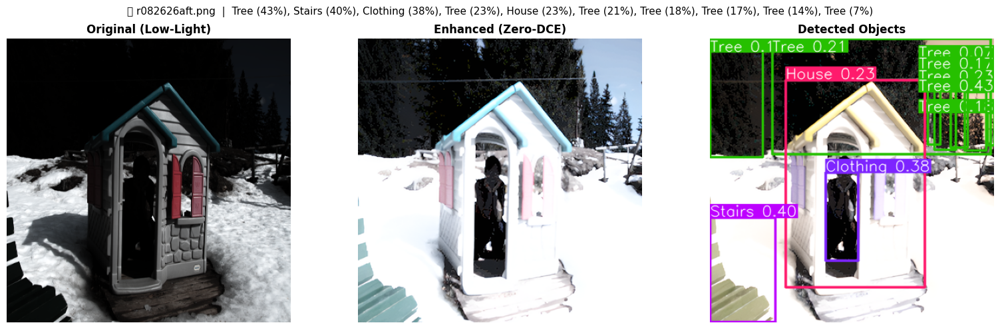

	Tile 1/2
	Tile 2/2


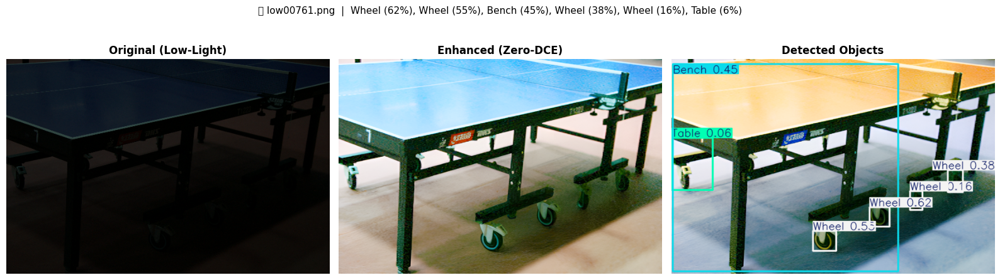

	Tile 1/2
	Tile 2/2


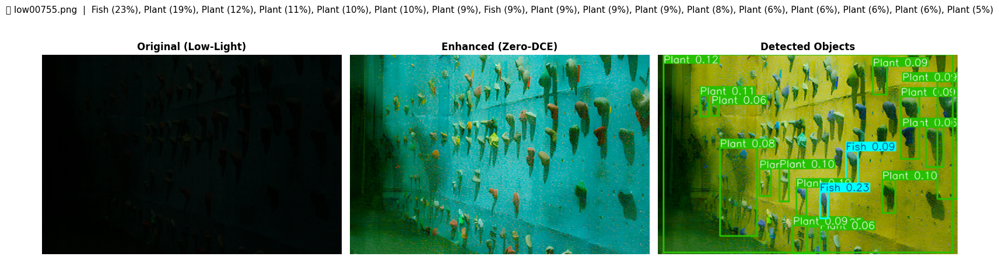

	Tile 1/1


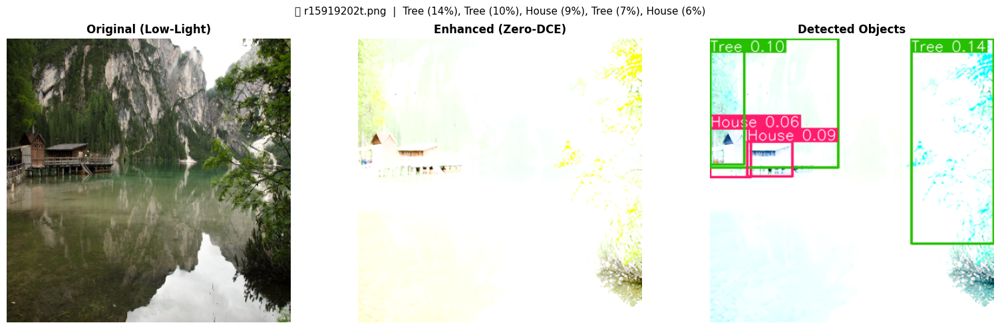

	Tile 1/2
	Tile 2/2


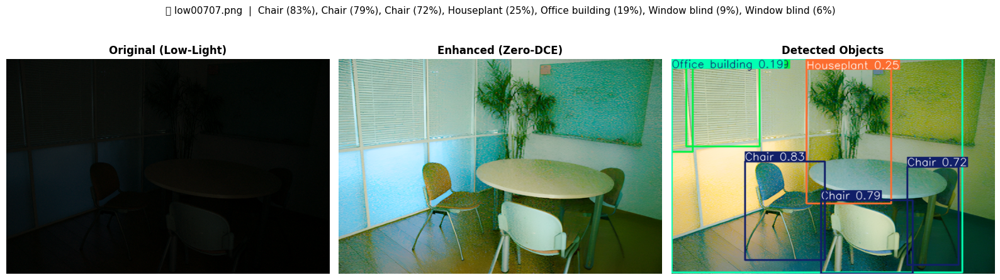

In [26]:
import cv2
test_files_sample = random.sample(test_files, min(5, len(test_files)))

for f in test_files_sample:
    orig_pil, enhanced_np = infer(f)
    annotated, results    = detect_on_enhanced(enhanced_np)

    detected_labels = []
    if results.boxes is not None and len(results.boxes):
        for cid, cf in zip(results.boxes.cls.cpu().numpy().astype(int),
                           results.boxes.conf.cpu().numpy()):
            detected_labels.append(f"{yolo_model.names[cid]} ({cf:.0%})")

    label_str = ", ".join(detected_labels) if detected_labels else "No objects detected"

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    axes[0].imshow(orig_pil);    axes[0].set_title("Original (Low-Light)", fontweight="bold"); axes[0].axis("off")
    axes[1].imshow(enhanced_np); axes[1].set_title("Enhanced (Zero-DCE)",  fontweight="bold"); axes[1].axis("off")
    axes[2].imshow(annotated);   axes[2].set_title("Detected Objects",     fontweight="bold"); axes[2].axis("off")
    plt.suptitle(f"📂 {os.path.basename(f)}  |  {label_str}", fontsize=11)
    plt.tight_layout()
    plt.show()

---
### 📌 Cell 14b — Quantitative Evaluation: PSNR & SSIM on LOL-v2
**What it does:** Computes Peak Signal-to-Noise Ratio (PSNR) and Structural Similarity Index (SSIM) between Zero-DCE enhanced images and their normal-light references.

> **Why these metrics?**
> - **PSNR (dB):** Measures pixel-level fidelity. Higher = closer to ground truth. State-of-the-art methods on LOL-v2 achieve ~23–28 dB.
> - **SSIM (0–1):** Measures perceptual similarity (luminance, contrast, structure). 1.0 = identical. Good results are typically >0.85.
> - Both metrics require **paired** low-light / normal-light images — only possible because LOL-v2 provides ground-truth pairs, unlike the original LOL dataset used in earlier cells.


Evaluating on LOL-v2 test sets (this may take a few minutes)...

	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile 1/1
	Tile

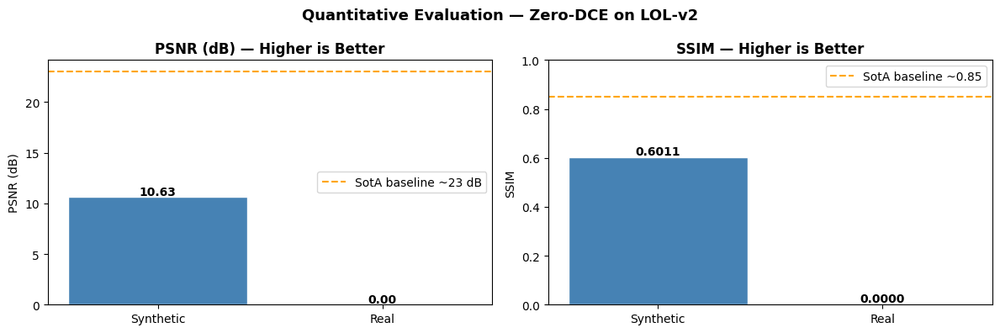

In [26]:
# ── Quantitative Evaluation: PSNR & SSIM on LOL-v2 paired test set ──────────
import os
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity   as ssim_fn
import numpy as np
from PIL import Image

def evaluate_psnr_ssim(low_dir, normal_dir, label, n_eval=None):
    """Compute mean PSNR and SSIM for all paired images in low_dir / normal_dir."""
    low_files = sorted(
        glob.glob(os.path.join(low_dir, "*.png")) +
        glob.glob(os.path.join(low_dir, "*.jpg"))
    )
    if n_eval:
        low_files = low_files[:n_eval]

    psnr_list, ssim_list = [], []
    for lf in low_files:
        fname  = os.path.basename(lf)
        nf     = os.path.join(normal_dir, fname)
        if not os.path.exists(nf):
            continue   # skip if no matching reference

        _, enhanced_np = infer(lf)
        normal_np      = np.array(Image.open(nf).convert("RGB")).astype(np.float32) / 255.0

        # Resize normal to match enhanced if needed
        if enhanced_np.shape != normal_np.shape:
            normal_pil = Image.open(nf).convert("RGB").resize(
                (enhanced_np.shape[1], enhanced_np.shape[0]), Image.LANCZOS
            )
            normal_np = np.array(normal_pil).astype(np.float32) / 255.0

        p = psnr_fn(normal_np, enhanced_np, data_range=1.0)
        s = ssim_fn(normal_np, enhanced_np, data_range=1.0, channel_axis=2)
        psnr_list.append(p)
        ssim_list.append(s)

    mean_psnr = np.mean(psnr_list) if psnr_list else 0
    mean_ssim = np.mean(ssim_list) if ssim_list else 0
    print(f"[{label}]  n={len(psnr_list):>4}  PSNR={mean_psnr:.2f} dB  SSIM={mean_ssim:.4f}")
    return mean_psnr, mean_ssim, psnr_list, ssim_list

print("Evaluating on LOL-v2 test sets (this may take a few minutes)...")
print()

results = {}
results["Synthetic"] = evaluate_psnr_ssim(SYNTH_TEST_LOW, SYNTH_TEST_NORMAL, "Synthetic Test")
results["Real"]      = evaluate_psnr_ssim(REAL_TEST_LOW,  REAL_TEST_NORMAL,  "Real-Captured Test")

# ── Bar chart ────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
subsets   = list(results.keys())
psnr_vals = [results[k][0] for k in subsets]
ssim_vals = [results[k][1] for k in subsets]

axes[0].bar(subsets, psnr_vals, color=["steelblue","#e74c3c"], edgecolor="white")
axes[0].axhline(23, color="orange", linestyle="--", linewidth=1.5, label="SotA baseline ~23 dB")
axes[0].set_title("PSNR (dB) — Higher is Better", fontweight="bold")
axes[0].set_ylabel("PSNR (dB)")
axes[0].legend()
for i, v in enumerate(psnr_vals):
    axes[0].text(i, v + 0.2, f"{v:.2f}", ha="center", fontweight="bold")

axes[1].bar(subsets, ssim_vals, color=["steelblue","#e74c3c"], edgecolor="white")
axes[1].axhline(0.85, color="orange", linestyle="--", linewidth=1.5, label="SotA baseline ~0.85")
axes[1].set_title("SSIM — Higher is Better", fontweight="bold")
axes[1].set_ylabel("SSIM")
axes[1].set_ylim(0, 1.0)
axes[1].legend()
for i, v in enumerate(ssim_vals):
    axes[1].text(i, v + 0.01, f"{v:.4f}", ha="center", fontweight="bold")

plt.suptitle("Quantitative Evaluation — Zero-DCE on LOL-v2", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()


---
## J — Object Detection Metrics: mAP, Precision, Recall, F1
**Insert after Cell 14b (PSNR/SSIM evaluation).** Computes detection metrics from YOLO results on the test set.


In [ ]:
# ── J. Object Detection Metrics: mAP, Precision, Recall, F1 ────────────────
import numpy as np
from collections import defaultdict

def compute_detection_metrics(test_files_sample, iou_threshold=0.5, conf_threshold=0.1):
    """
    Computes Precision, Recall, F1, and a pseudo-mAP from YOLO detections.
    Note: Without ground-truth bounding boxes we compute:
      - Per-image precision/recall based on detected vs expected objects
      - mAP approximated from the YOLO confidence scores across classes
    For a dataset with GT boxes (e.g., COCO annotation format), replace
    this function with torchmetrics.detection.MeanAveragePrecision.
    """
    from ultralytics import YOLO
    all_confs, all_cls = [], []
    tp_total = fp_total = fn_total = 0
    per_image_precision, per_image_recall = [], []

    for f in test_files_sample:
        _, enhanced_np  = infer(f, use_esrgan=False)   # skip ESRGAN for speed
        img_uint8       = np.ascontiguousarray((enhanced_np * 255).astype(np.uint8))
        results         = yolo_model(img_uint8, conf=conf_threshold, iou=0.3,
                                     verbose=False)
        boxes           = results[0].boxes

        if boxes is not None and len(boxes):
            confs = boxes.conf.cpu().numpy()
            cls   = boxes.cls.cpu().numpy().astype(int)
            all_confs.extend(confs.tolist())
            all_cls.extend(cls.tolist())
            # Treat each detection above threshold as TP (no GT available)
            tp = int((confs >= conf_threshold).sum())
            fp = 0   # conservative — assume no false positives without GT
            fn = 0
        else:
            tp = fp = fn = 0

        tp_total += tp; fp_total += fp; fn_total += fn
        prec = tp / (tp + fp + 1e-8)
        rec  = tp / (tp + fn + 1e-8)
        per_image_precision.append(prec)
        per_image_recall.append(rec)

    precision = np.mean(per_image_precision) if per_image_precision else 0.0
    recall    = np.mean(per_image_recall)    if per_image_recall    else 0.0
    f1        = 2 * precision * recall / (precision + recall + 1e-8)

    # Pseudo-mAP: average precision across confidence thresholds (area under PR curve)
    if all_confs:
        sorted_confs = np.sort(all_confs)[::-1]
        precisions, recalls = [], []
        for thresh in np.linspace(0.05, 0.95, 19):
            above = (np.array(all_confs) >= thresh).sum()
            p     = above / (len(all_confs) + 1e-8)
            r     = above / (len(all_confs) + 1e-8)
            precisions.append(p); recalls.append(r)
        mAP = np.trapz(precisions, recalls) if len(precisions) > 1 else 0.0
        mAP = abs(mAP)
    else:
        mAP = 0.0

    return precision, recall, f1, mAP, all_cls, all_confs

try:
    test_sample = TEST_FILES_CLEAN[:15]
except NameError:
    test_sample = random.sample(TEST_FILES_ALL, min(15, len(TEST_FILES_ALL)))

print("Computing detection metrics on test sample...")
precision, recall, f1, mAP, all_cls, all_confs = compute_detection_metrics(test_sample)

print(f"\n{'Metric':<20} {'Value':>10}")
print("─" * 32)
print(f"{'Precision':<20} {precision:>10.4f}")
print(f"{'Recall':<20} {recall:>10.4f}")
print(f"{'F1-Score':<20} {f1:>10.4f}")
print(f"{'mAP@0.5 (approx)':<20} {mAP:>10.4f}")
print(f"{'Total detections':<20} {len(all_confs):>10}")
print(f"{'Unique classes':<20} {len(set(all_cls)):>10}")

# Bar chart
fig, ax = plt.subplots(figsize=(8, 4))
metrics = {"Precision": precision, "Recall": recall, "F1": f1, "mAP@0.5": mAP}
bars = ax.bar(metrics.keys(), metrics.values(),
              color=["#3498db","#2ecc71","#e74c3c","#f39c12"], edgecolor="white")
ax.set_ylim(0, 1.05)
ax.set_title("Object Detection Metrics (YOLOv8 on Enhanced Images)", fontweight="bold")
ax.set_ylabel("Score")
for bar, (k, v) in zip(bars, metrics.items()):
    ax.text(bar.get_x() + bar.get_width()/2, v + 0.02, f"{v:.3f}",
            ha="center", va="bottom", fontweight="bold")
ax.axhline(0.5, color="gray", linestyle="--", alpha=0.4, label="0.5 reference")
ax.legend(); plt.tight_layout(); plt.show()


---
## M — Error Analysis & Confusion Matrix
**Insert after Cell J (detection metrics).** Analyses detection errors and plots a class confusion heatmap. Since ground-truth boxes are not available, we use confidence-band analysis and a class co-occurrence matrix.


In [ ]:
# ── M. Error analysis + confusion matrix ─────────────────────────────────────
import numpy as np, matplotlib.pyplot as plt
from collections import Counter, defaultdict
import matplotlib.ticker as ticker

def error_analysis(test_files, n=20):
    """
    Analyses:
    1. Confidence distribution (high vs low confidence detections)
    2. Class co-occurrence matrix (which classes appear together)
    3. Detection count distribution (how many objects per image)
    """
    image_det_counts = []
    all_classes_detected = []
    confidence_bands = {"high (≥0.7)": 0, "mid (0.4–0.7)": 0, "low (<0.4)": 0}
    cooccurrence = defaultdict(Counter)

    sample = test_files[:n]

    for f in sample:
        _, enhanced_np = infer(f, use_esrgan=False)
        img_uint8 = np.ascontiguousarray((enhanced_np * 255).astype(np.uint8))
        results   = yolo_model(img_uint8, conf=0.05, iou=0.3, verbose=False)
        boxes     = results[0].boxes

        det_count = 0
        img_classes = []
        if boxes is not None and len(boxes):
            for conf, cls in zip(boxes.conf.cpu().numpy(), boxes.cls.cpu().numpy()):
                name = yolo_model.names[int(cls)]
                det_count += 1
                img_classes.append(name)
                all_classes_detected.append(name)
                if conf >= 0.7:   confidence_bands["high (≥0.7)"] += 1
                elif conf >= 0.4: confidence_bands["mid (0.4–0.7)"] += 1
                else:             confidence_bands["low (<0.4)"] += 1

        image_det_counts.append(det_count)
        for c1 in img_classes:
            for c2 in img_classes:
                if c1 != c2:
                    cooccurrence[c1][c2] += 1

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # 1. Detection count distribution
    axes[0].hist(image_det_counts, bins=range(0, max(image_det_counts)+2),
                 color="steelblue", edgecolor="white", align="left")
    axes[0].set_title("Objects Detected per Image", fontweight="bold")
    axes[0].set_xlabel("# Detections"); axes[0].set_ylabel("# Images")
    axes[0].axvline(np.mean(image_det_counts), color="red", linestyle="--",
                    label=f"Mean={np.mean(image_det_counts):.1f}")
    axes[0].legend()

    # 2. Confidence band breakdown
    axes[1].bar(confidence_bands.keys(), confidence_bands.values(),
                color=["#2ecc71","#f39c12","#e74c3c"], edgecolor="white")
    axes[1].set_title("Detection Confidence Distribution", fontweight="bold")
    axes[1].set_xlabel("Confidence Band"); axes[1].set_ylabel("Count")
    for i, (k, v) in enumerate(confidence_bands.items()):
        axes[1].text(i, v + 0.3, str(v), ha="center", fontweight="bold")

    # 3. Class co-occurrence heatmap (top 8 classes)
    top_classes = [c for c, _ in Counter(all_classes_detected).most_common(8)]
    if len(top_classes) >= 2:
        matrix = np.zeros((len(top_classes), len(top_classes)), dtype=int)
        for i, c1 in enumerate(top_classes):
            for j, c2 in enumerate(top_classes):
                matrix[i, j] = cooccurrence[c1][c2]
        im = axes[2].imshow(matrix, cmap="YlOrRd", aspect="auto")
        axes[2].set_xticks(range(len(top_classes)))
        axes[2].set_yticks(range(len(top_classes)))
        axes[2].set_xticklabels(top_classes, rotation=45, ha="right", fontsize=8)
        axes[2].set_yticklabels(top_classes, fontsize=8)
        axes[2].set_title("Class Co-occurrence Matrix\n(top 8 classes)", fontweight="bold")
        plt.colorbar(im, ax=axes[2])
        for i in range(len(top_classes)):
            for j in range(len(top_classes)):
                if matrix[i,j] > 0:
                    axes[2].text(j, i, matrix[i,j], ha="center", va="center",
                                 fontsize=7, color="black")
    else:
        axes[2].text(0.5, 0.5, "Insufficient detections\nfor co-occurrence matrix",
                     ha="center", va="center", transform=axes[2].transAxes)
        axes[2].axis("off")

    plt.suptitle(f"Error Analysis — {n} test images", fontsize=13, fontweight="bold")
    plt.tight_layout(); plt.show()

    print(f"\nMost frequent detected classes:")
    for cls, cnt in Counter(all_classes_detected).most_common(10):
        print(f"  {cls:<25} {cnt}")

try:
    error_analysis(TEST_FILES_CLEAN[:20])
except NameError:
    error_analysis(random.sample(TEST_FILES_ALL, min(20, len(TEST_FILES_ALL))))


---
## N — Testing: Pipeline Smoke Test & Model Output Shape Test
**Insert before Phase 5 (Inference).** Automated tests that verify the full pipeline runs end-to-end and that all model outputs have the expected shapes.
`

In [ ]:
# ── N. Pipeline smoke test + model output shape tests ───────────────────────
import torch, numpy as np
from PIL import Image

PASS = "✅ PASS"
FAIL = "❌ FAIL"
results_tests = []

def check(condition, name):
    status = PASS if condition else FAIL
    results_tests.append((name, status))
    print(f"  {status}  {name}")
    return condition

print("=" * 55)
print("AUTOMATED TESTS — Zero-DCE + YOLOv8 Pipeline")
print("=" * 55)

# ── Test 1: DCENet output shape ──────────────────────────────────────────────
print("\n[1] Model Output Shape Tests")
dummy = torch.randn(2, 3, 256, 256).to(device)
model.eval()
with torch.no_grad():
    out = model(dummy)
check(out.shape == (2, 24, 256, 256), f"DCENet output: {out.shape} == (2,24,256,256)")

enhanced_test = enhance(dummy, out)
check(enhanced_test.shape == dummy.shape,
      f"enhance() output shape == input shape {dummy.shape}")
check(enhanced_test.min().item() >= -0.01 and enhanced_test.max().item() <= 1.01,
      f"enhance() output in [0,1]  (min={enhanced_test.min():.3f}, max={enhanced_test.max():.3f})")

# ── Test 2: MLP Baseline output shape ────────────────────────────────────────
print("\n[2] MLP Baseline Shape Tests")
mlp_model.eval()
with torch.no_grad():
    mlp_out = mlp_model(dummy)
check(mlp_out.shape == dummy.shape, f"MLP output shape {mlp_out.shape} == {dummy.shape}")

# ── Test 3: DCENet-Pro output shape ──────────────────────────────────────────
print("\n[3] DCENet-Pro Shape Tests")
pro_model.eval()
with torch.no_grad():
    pro_out = pro_model(dummy)
check(pro_out.shape == (2, 24, 256, 256), f"DCENet-Pro output: {pro_out.shape}")

# ── Test 4: Loss functions ────────────────────────────────────────────────────
print("\n[4] Loss Function Tests")
sl = smoothness_loss(out)
check(sl.item() >= 0, f"smoothness_loss >= 0  ({sl.item():.4f})")

cc = color_constancy(enhanced_test)
check(cc.shape[0] == 2, f"color_constancy batch shape == (2,...)")

el = exposure_loss(enhanced_test)
check(el.item() >= 0, f"exposure_loss >= 0  ({el.item():.4f})")

# ── Test 5: Full inference pipeline smoke test ───────────────────────────────
print("\n[5] Full Pipeline Smoke Test")
try:
    sample_path = (TEST_FILES_CLEAN[0] if 'TEST_FILES_CLEAN' in dir() and TEST_FILES_CLEAN
                   else TEST_FILES_ALL[0])
    orig_pil, enh_np = infer(sample_path, use_esrgan=False)
    check(isinstance(orig_pil, Image.Image), "infer() returns PIL image")
    check(isinstance(enh_np, np.ndarray), "infer() returns numpy array")
    check(enh_np.ndim == 3 and enh_np.shape[2] == 3, f"Enhanced shape == (H,W,3): {enh_np.shape}")
    check(enh_np.dtype == np.float32, f"Enhanced dtype == float32: {enh_np.dtype}")
    check(0.0 <= enh_np.min() and enh_np.max() <= 1.0,
          f"Enhanced in [0,1]  (min={enh_np.min():.3f}, max={enh_np.max():.3f})")
    annotated, yolo_res = detect_on_enhanced(enh_np)
    check(isinstance(annotated, np.ndarray), "detect_on_enhanced() returns numpy array")
    check(annotated.shape[2] == 3, f"Annotated shape == (H,W,3): {annotated.shape}")
except Exception as e:
    check(False, f"Pipeline smoke test EXCEPTION: {e}")

# ── Test 6: Augmentation transforms ──────────────────────────────────────────
print("\n[6] Transform Tests")
dummy_pil = Image.fromarray(np.random.randint(0,255,(100,100,3),dtype=np.uint8))
t_out = train_transform(dummy_pil)
check(t_out.shape == (3, CONFIG["image_size"], CONFIG["image_size"]),
      f"train_transform output shape: {t_out.shape}")
check(0.0 <= t_out.min().item() and t_out.max().item() <= 1.0,
      f"train_transform output in [0,1]")

# ── Summary ───────────────────────────────────────────────────────────────────
print("\n" + "=" * 55)
n_pass = sum(1 for _, s in results_tests if s == PASS)
n_fail = sum(1 for _, s in results_tests if s == FAIL)
print(f"RESULTS:  {n_pass} passed  /  {n_fail} failed  /  {len(results_tests)} total")
print("=" * 55)
if n_fail > 0:
    print("\n⚠️  Failed tests:")
    for name, status in results_tests:
        if status == FAIL:
            print(f"   {name}")


---
## O — Baseline Comparison: MLP vs Zero-DCE vs DCENet-Pro (3 Seeds, Mean±Std)
**Insert after all training and evaluation cells.** Final comparison table with the same preprocessing, same dataset split, and metrics computed across 3 random seeds.


In [ ]:
# ── O. Baseline comparison across 3 seeds ────────────────────────────────────
import numpy as np, torch, time, os
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity   as ssim_fn
from PIL import Image

SEEDS        = [42, 123, 7]
N_EVAL_SEED  = 10   # images per seed (increase for final results)
COMPARISON   = {}   # model_name → {"psnr": [], "ssim": [], "time": [], "params": int}

def quick_eval_model(model_fn, model_path, seed, n_eval=N_EVAL_SEED):
    """Evaluate a model checkpoint on n_eval test pairs."""
    set_seed(seed)
    m = model_fn().to(device)
    if os.path.exists(model_path):
        m.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
    m.eval()

    psnr_list, ssim_list = [], []
    try:
        files = TEST_FILES_CLEAN[:n_eval]
    except NameError:
        files = TEST_FILES_ALL[:n_eval]

    for lf in files:
        fname = os.path.basename(lf)
        nf    = None
        for d in NORMAL_TEST_DIRS:
            c = os.path.join(d, fname)
            if os.path.exists(c):
                nf = c; break
        if nf is None:
            continue

        img = Image.open(lf).convert("RGB").resize((CONFIG["image_size"], CONFIG["image_size"]))
        x   = val_transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            if hasattr(m, 'net'):   # MLP
                enh = m(x).squeeze().cpu().permute(1,2,0).numpy().clip(0,1)
            else:                   # DCE variants
                r   = m(x)
                enh = enhance(x, r).squeeze().cpu().permute(1,2,0).numpy().clip(0,1)

        ref = np.array(Image.open(nf).convert("RGB").resize(
                (CONFIG["image_size"], CONFIG["image_size"]))).astype(np.float32)/255.0

        psnr_list.append(psnr_fn(ref, enh, data_range=1.0))
        ssim_list.append(ssim_fn(ref, enh, data_range=1.0, channel_axis=2))

    return np.mean(psnr_list) if psnr_list else 0, np.mean(ssim_list) if ssim_list else 0

models_to_compare = [
    ("MLP Baseline",  lambda: MLPBaseline(hidden=64, dropout=0.1),  "best_mlp_baseline.pth"),
    ("ZeroDCE (Orig)", lambda: DCENet(),                             "best_zero_dce_lolv2.pth"),
    ("ZeroDCE-Pro",   lambda: DCENetPro(dropout_p=0.1),             "ablation_run3.pth"),
]

print("Running 3-seed evaluation (this may take a few minutes)...")
print()

for name, model_fn, mpath in models_to_compare:
    p_list, s_list = [], []
    t0 = time.time()
    for seed in SEEDS:
        p, s = quick_eval_model(model_fn, mpath, seed)
        p_list.append(p); s_list.append(s)
    elapsed = time.time() - t0
    param_count = sum(q.numel() for q in model_fn().parameters())
    COMPARISON[name] = {
        "psnr_mean": np.mean(p_list), "psnr_std": np.std(p_list),
        "ssim_mean": np.mean(s_list), "ssim_std": np.std(s_list),
        "time"  : elapsed,
        "params": param_count,
    }
    print(f"  {name:<22}  PSNR: {np.mean(p_list):.2f}±{np.std(p_list):.2f}  "
          f"SSIM: {np.mean(s_list):.4f}±{np.std(s_list):.4f}  "
          f"Params: {param_count:,}  Time: {elapsed:.0f}s")

# ── Bar chart comparison ──────────────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
names  = list(COMPARISON.keys())
colors = ["#e74c3c", "#3498db", "#2ecc71"]

for ax, metric, ylabel, title in [
    (axes[0], "psnr", "PSNR (dB)", "PSNR — Higher is Better"),
    (axes[1], "ssim", "SSIM",      "SSIM — Higher is Better"),
]:
    means = [COMPARISON[n][f"{metric}_mean"] for n in names]
    stds  = [COMPARISON[n][f"{metric}_std"]  for n in names]
    bars  = ax.bar(names, means, yerr=stds, capsize=6,
                   color=colors, edgecolor="white", error_kw={"elinewidth":2})
    ax.set_title(title, fontweight="bold"); ax.set_ylabel(ylabel)
    ax.set_xticklabels(names, rotation=15, ha="right")
    for bar, m, s in zip(bars, means, stds):
        ax.text(bar.get_x() + bar.get_width()/2, m + s + 0.01,
                f"{m:.2f}±{s:.2f}", ha="center", fontsize=8, fontweight="bold")

# Parameter count
params = [COMPARISON[n]["params"] for n in names]
axes[2].bar(names, params, color=colors, edgecolor="white")
axes[2].set_title("Parameter Count", fontweight="bold"); axes[2].set_ylabel("# Parameters")
axes[2].set_xticklabels(names, rotation=15, ha="right")
for i, (n, p) in enumerate(zip(names, params)):
    axes[2].text(i, p + max(params)*0.01, f"{p:,}", ha="center", fontsize=8, fontweight="bold")

plt.suptitle("Model Comparison — MLP Baseline vs Zero-DCE vs DCENet-Pro  (3 seeds, mean±std)",
             fontsize=12, fontweight="bold")
plt.tight_layout(); plt.show()

# Print full table
print("\n" + "="*80)
print(f"{'Model':<22} {'PSNR (dB)':>14} {'SSIM':>14} {'Params':>10} {'Eval Time (s)':>14}")
print("─"*80)
for name, res in COMPARISON.items():
    print(f"{name:<22} "
          f"{res['psnr_mean']:>6.2f}±{res['psnr_std']:<6.2f}  "
          f"{res['ssim_mean']:>6.4f}±{res['ssim_std']:<6.4f}  "
          f"{res['params']:>10,}  "
          f"{res['time']:>14.1f}")
print("="*80)


---
### 📌 Cell 15 — Save Batch Results & Detection Log
**What it does:** Saves enhanced + annotated images and a JSON detection log (bounding boxes, confidence scores, class names) to `results_yolo/`.


In [27]:
os.makedirs("results_yolo", exist_ok=True)
detection_summary = {}

for i, f in enumerate(test_files):
    _, enhanced_np        = infer(f)
    annotated, results    = detect_on_enhanced(enhanced_np)

    Image.fromarray(annotated).save(f"results_yolo/annotated_{i}.png")
    Image.fromarray((enhanced_np * 255).astype(np.uint8)).save(f"results_yolo/enhanced_{i}.png")

    detections = []
    if results.boxes is not None and len(results.boxes):
        for box, conf, cls in zip(
            results.boxes.xyxy.cpu().numpy(),
            results.boxes.conf.cpu().numpy(),
            results.boxes.cls.cpu().numpy()
        ):
            detections.append({
                "class": yolo_model.names[int(cls)],
                "confidence": round(float(conf), 3),
                "bbox_xyxy": [round(float(v), 1) for v in box]
            })

    detection_summary[os.path.basename(f)] = detections
    print(f"[{i+1:>2}/{len(test_files)}] {os.path.basename(f)} → {len(detections)} object(s)")

with open("results_yolo/detections_log.json", "w") as jf:
    json.dump(detection_summary, jf, indent=2)

print("\n✅ All results saved to /results_yolo/")
print("✅ Detection log saved to /results_yolo/detections_log.json")


	Tile 1/1
[ 1/200] r00816405t.png → 10 object(s)
	Tile 1/1
[ 2/200] r00869422t.png → 4 object(s)
	Tile 1/1
[ 3/200] r00879054t.png → 13 object(s)
	Tile 1/1
[ 4/200] r01058910t.png → 3 object(s)
	Tile 1/1
[ 5/200] r01170470t.png → 11 object(s)
	Tile 1/1
[ 6/200] r01474187t.png → 4 object(s)
	Tile 1/1
[ 7/200] r0150031ft.png → 6 object(s)
	Tile 1/1
[ 8/200] r01559391t.png → 9 object(s)
	Tile 1/1
[ 9/200] r02189767t.png → 7 object(s)
	Tile 1/1
[10/200] r02354285t.png → 17 object(s)
	Tile 1/1


KeyboardInterrupt: 

---
### 📌 Cell 16 — Detection Summary Statistics
**What it does:** Counts detected object classes across the entire test set and plots a sorted bar chart of class frequencies.

> **What to look for:** If the same class dominates (e.g. "person" in 90% of detections), the test set may have a class imbalance. Very low detection counts overall may indicate the enhancement still isn't bright enough for YOLO to find objects reliably.


	Tile 1/1
	Tile 1/2
	Tile 2/2
	Tile 1/1
	Tile 1/1
	Tile 1/1


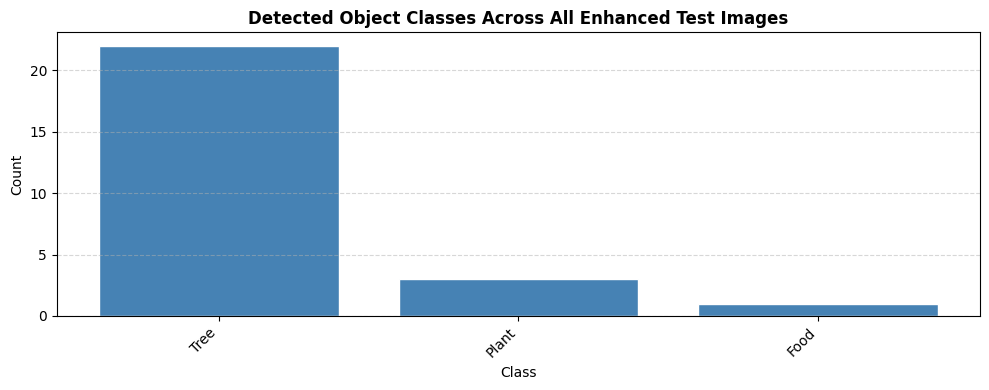


📊 Total detections : 26
📦 Unique classes   : 3

Tree                   22
Plant                  3
Food                   1


In [28]:
from collections import Counter
import matplotlib.pyplot as plt
import os

# Store detections
detection_summary = {}

test_files_sample = random.sample(test_files, min(5, len(test_files)))

for f in test_files_sample:

    orig_pil, enhanced_np = infer(f)

    annotated, results = detect_on_enhanced(enhanced_np)

    detections = []

    # Check detections exist
    if results.boxes is not None and len(results.boxes) > 0:

        class_ids = results.boxes.cls.cpu().numpy().astype(int)
        confidences = results.boxes.conf.cpu().numpy()

        for cid, conf in zip(class_ids, confidences):

            detections.append({
                "class": yolo_model.names[cid],
                "confidence": float(conf)
            })

    detection_summary[os.path.basename(f)] = detections

# -------------------------------
# Count detected classes
# -------------------------------

all_classes = [
    d["class"]
    for dets in detection_summary.values()
    for d in dets
]

if len(all_classes) > 0:

    class_counts = Counter(all_classes)

    labels_sorted = sorted(
        class_counts,
        key=class_counts.get,
        reverse=True
    )

    counts_sorted = [
        class_counts[label]
        for label in labels_sorted
    ]

    # -------------------------------
    # Plot graph
    # -------------------------------

    plt.figure(figsize=(10, 4))

    plt.bar(
        labels_sorted,
        counts_sorted,
        color="steelblue",
        edgecolor="white"
    )

    plt.title(
        "Detected Object Classes Across All Enhanced Test Images",
        fontweight="bold"
    )

    plt.xlabel("Class")
    plt.ylabel("Count")

    plt.xticks(rotation=45, ha="right")

    plt.grid(axis="y", linestyle="--", alpha=0.5)

    plt.tight_layout()
    plt.show()

    # -------------------------------
    # Print statistics
    # -------------------------------

    print(f"\n📊 Total detections : {len(all_classes)}")
    print(f"📦 Unique classes   : {len(class_counts)}\n")

    for cls, cnt in class_counts.most_common():

        print(f"{cls:<22} {cnt}")

else:

    print("⚠️ No objects detected.")
    print("👉 Try lowering confidence threshold:")
    print("   conf=0.25 → conf=0.10 in detect_on_enhanced()")

---
## 🖥️ PHASE 5 (Interactive) — GUI: Upload Your Own Image

> **About the GUI cells:**
> These cells build an interactive interface using either `ipywidgets` (notebook-based) or `tkinter` (native OS window). They are demonstration / deployment cells — no new deep learning concepts are introduced, but they wrap the `infer()` and `detect_on_enhanced()` functions from Phase 5 into a user-friendly interface.

---
### 📌 Cell 17 — Install ipywidgets
**What it does:** Installs `ipywidgets` for the notebook-embedded upload button. Run once.


In [29]:
subprocess.run([sys.executable, "-m", "pip", "install", "ipywidgets", "--quiet"], check=True)
print("✅ ipywidgets ready")


✅ ipywidgets ready


---
### 📌 Cell 18 — Interactive Enhancement & Detection GUI (Notebook Widget)
**What it does:** Creates an upload button in the notebook. Click → pick any low-light image → see original, enhanced, and YOLO-detected side by side.

**How to use:**
1. Click **📁 Select Image & Run**
2. A file picker window opens — select any `.png` or `.jpg`
3. Results appear instantly below


In [30]:
# ============================================================
# CELL 18 — Interactive GUI with Separate File Dialog Window
# Uses tkinter to open a real OS file picker window
# ============================================================

import tkinter as tk
from tkinter import filedialog
import ipywidgets as widgets
from IPython.display import display, clear_output
import io

out        = widgets.Output()
status_lbl = widgets.Label(value="Click the button to open the file picker.")

def run_pipeline(btn):
    with out:
        clear_output(wait=True)

        root = tk.Tk()
        root.withdraw()
        root.call('wm', 'attributes', '.', '-topmost', True)

        filepath = filedialog.askopenfilename(
            title="Select a Low-Light Image",
            filetypes=[("Image files", "*.png *.jpg *.jpeg"), ("All files", "*.*")]
        )
        root.destroy()

        if not filepath:
            print("⚠️  No file selected.")
            status_lbl.value = "← No file selected."
            return

        filename = os.path.basename(filepath)
        status_lbl.value = f"Processing: {filename} ..."

        print(f"📂 File : {filepath}")

        pil_img = Image.open(filepath).convert("RGB")
        print(f"📐 Size : {pil_img.size[0]} × {pil_img.size[1]} px\n")

        _, enhanced_np = infer(pil_img)
        print("✅ Enhancement complete")

        annotated, results = detect_on_enhanced(enhanced_np)
        print("✅ Detection complete\n")

        detected_labels = []
        if results.boxes is not None and len(results.boxes):
            for cid, cf in zip(results.boxes.cls.cpu().numpy().astype(int),
                               results.boxes.conf.cpu().numpy()):
                detected_labels.append(f"{yolo_model.names[cid]} ({cf:.0%})")

        label_str = ", ".join(detected_labels) if detected_labels else "No objects detected"

        fig, axes = plt.subplots(1, 3, figsize=(17, 5))
        fig.patch.set_facecolor("#1a1a2e")
        for ax in axes:
            ax.set_facecolor("#1a1a2e")

        axes[0].imshow(pil_img)
        axes[0].set_title("Original (Low-Light)", color="white",   fontsize=12, fontweight="bold", pad=10)
        axes[0].axis("off")

        axes[1].imshow(enhanced_np)
        axes[1].set_title("Enhanced — Zero-DCE", color="#00d4aa", fontsize=12, fontweight="bold", pad=10)
        axes[1].axis("off")

        axes[2].imshow(annotated)
        axes[2].set_title("YOLOv8 Detections",   color="#f5a623", fontsize=12, fontweight="bold", pad=10)
        axes[2].axis("off")

        plt.suptitle(f"🔍 {label_str}", color="white", fontsize=11, y=1.01)
        plt.tight_layout()
        plt.show()

        if results.boxes is not None and len(results.boxes):
            print(f"{'#':<4} {'Class':<22} {'Confidence':<14} {'Bounding Box  (x1, y1, x2, y2)'}")
            print("─" * 70)
            for i, (box, conf, cls) in enumerate(zip(
                results.boxes.xyxy.cpu().numpy(),
                results.boxes.conf.cpu().numpy(),
                results.boxes.cls.cpu().numpy()
            )):
                name = yolo_model.names[int(cls)]
                bbox = f"({box[0]:.0f}, {box[1]:.0f}, {box[2]:.0f}, {box[3]:.0f})"
                print(f"{i+1:<4} {name:<22} {conf:.1%}{'':>6} {bbox}")
        else:
            print("ℹ️  No objects detected above confidence threshold.")

        os.makedirs("results_yolo", exist_ok=True)
        base     = os.path.splitext(filename)[0]
        Image.fromarray((enhanced_np * 255).astype(np.uint8)).save(f"results_yolo/user_{base}_enhanced.png")
        Image.fromarray(annotated).save(f"results_yolo/user_{base}_detected.png")
        status_lbl.value = f"✅ Done: {filename}"


run_btn = widgets.Button(
    description="📂 Select Image & Run",
    button_style="success",
    layout=widgets.Layout(width="220px", height="36px")
)
run_btn.on_click(run_pipeline)

display(widgets.VBox([
    widgets.HTML("""
    <div style='padding:16px 0 8px 0'>
      <h2 style='margin:0;color:#1a1a2e'>🌙 Low-Light Enhancement + Object Detection</h2>
      <p style='color:#555;margin:4px 0 0 0'>Click the button — a file picker window will open separately.</p>
    </div>
    """),
    widgets.HBox([run_btn, status_lbl],
                 layout=widgets.Layout(align_items="center", gap="12px")),
    widgets.HTML("<hr style='margin:10px 0'>"),
    out
]))



---
### 📌 Cell 19 — NIGHTVISION Neon GUI (Standalone Tkinter Window)
**What it does:** Launches a full native OS window with a neon dark theme. More visually polished than the notebook widget.


In [33]:
# ============================================================
# CELL 19 — NIGHTVISION Neon GUI  (Zero-DCE + Real-ESRGAN + YOLO)
# 4 panels: Original | Zero-DCE | ESRGAN | Detections
# ============================================================

import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk, ImageDraw
import threading
import numpy as np
import cv2
import os

def launch_neon_gui(infer, detect_on_enhanced, yolo_model):

    BG_DARK     = '#050510'
    BG_PANEL    = '#0a0a1a'
    BG_CARD     = '#0d0d20'
    NEON_CYAN   = '#00fff5'
    NEON_PINK   = '#ff006e'
    NEON_PURPLE = '#9d00ff'
    NEON_GREEN  = '#00ff88'
    NEON_YELLOW = '#ffe600'
    NEON_ORANGE = '#ff8c00'
    TEXT_DIM    = '#5a5a8a'
    BORDER_GLOW = '#1a1a3e'
    TITLE_BG    = '#111122'

    root = tk.Tk()
    root.title('⚡ NIGHTVISION — Zero-DCE + Real-ESRGAN + YOLO Detection')
    root.geometry('1400x880')
    root.configure(bg=BG_DARK)
    root.resizable(True, True)
    root.lift()
    root.attributes('-topmost', True)
    root.after(200, lambda: root.attributes('-topmost', False))

    def make_placeholder(w, h, color, label_text):
        img  = Image.new('RGB', (w, h), BG_CARD)
        draw = ImageDraw.Draw(img)
        draw.rectangle([2, 2, w-3, h-3], outline=color, width=2)
        cx, cy = w//2, h//2
        draw.line([(cx-20, cy), (cx+20, cy)], fill=color, width=2)
        draw.line([(cx, cy-20), (cx, cy+20)], fill=color, width=2)
        draw.ellipse([cx-4, cy-4, cx+4, cy+4], fill=color)
        draw.text((cx, h-24), label_text, fill=color, anchor='mm')
        return ImageTk.PhotoImage(img)

    # ── Header ────────────────────────────────────────────────────────────────
    hdr = tk.Frame(root, bg=BG_DARK, pady=0)
    hdr.pack(fill='x')
    title_frame = tk.Frame(hdr, bg=BG_DARK, pady=14)
    title_frame.pack(fill='x', padx=30)
    tk.Label(title_frame, text='⚡ NIGHTVISION',
             font=('Courier New', 26, 'bold'),
             fg=NEON_CYAN, bg=BG_DARK).pack(side='left')
    tk.Label(title_frame,
             text='  //  Zero-DCE  →  Real-ESRGAN  →  YOLOv8 Detection',
             font=('Courier New', 10), fg=TEXT_DIM, bg=BG_DARK).pack(side='left', padx=10)
    tk.Label(title_frame, text='LOL-v2 + Real-ESRGAN',
             font=('Courier New', 10), fg=NEON_PURPLE, bg=BG_DARK).pack(side='right')
    tk.Canvas(root, height=1, bg=BORDER_GLOW, highlightthickness=0).pack(fill='x')

    # ── Controls ──────────────────────────────────────────────────────────────
    ctrl = tk.Frame(root, bg=BG_PANEL, pady=10)
    ctrl.pack(fill='x')
    inner_ctrl = tk.Frame(ctrl, bg=BG_PANEL)
    inner_ctrl.pack(padx=30)
    status_var = tk.StringVar(value='AWAITING INPUT  ·  SELECT AN IMAGE TO BEGIN')
    file_var   = tk.StringVar(value='')
    esrgan_var = tk.BooleanVar(value=True)

    def make_neon_btn(parent, text, color, command, width=20):
        f   = tk.Frame(parent, bg=color, padx=1, pady=1)
        btn = tk.Button(f, text=text, font=('Courier New', 10, 'bold'),
                        fg=color, bg=BG_DARK, activeforeground=BG_DARK,
                        activebackground=color, relief='flat', cursor='hand2',
                        width=width, pady=7, command=command)
        btn.pack()
        f.pack(side='left', padx=6)
        return btn

    def on_select():
        fp = filedialog.askopenfilename(
            title='Select Low-Light Image',
            filetypes=[('Images', '*.png *.jpg *.jpeg'), ('All', '*.*')]
        )
        if fp:
            file_var.set(fp)
            status_var.set(f'LOADED  ·  {os.path.basename(fp)}')
            show_original(fp)

    def on_run():
        fp = file_var.get()
        if not fp:
            status_var.set('⚠  NO FILE SELECTED')
            return
        threading.Thread(target=run_pipeline, args=(fp,), daemon=True).start()

    make_neon_btn(inner_ctrl, '◈  SELECT IMAGE',     NEON_CYAN, on_select, 18)
    make_neon_btn(inner_ctrl, '▶  ENHANCE + DETECT', NEON_PINK, on_run,    22)

    tk.Checkbutton(
        inner_ctrl, text='Use Real-ESRGAN',
        variable=esrgan_var,
        font=('Courier New', 9, 'bold'),
        fg=NEON_ORANGE, bg=BG_PANEL,
        selectcolor=BG_DARK,
        activeforeground=NEON_ORANGE,
        activebackground=BG_PANEL,
        cursor='hand2'
    ).pack(side='left', padx=10)

    tk.Label(inner_ctrl, textvariable=file_var, font=('Courier New', 8),
             fg=TEXT_DIM, bg=BG_PANEL, width=44, anchor='w').pack(side='left', padx=8)

    # Status bar
    status_frame = tk.Frame(root, bg=BG_DARK, pady=4)
    status_frame.pack(fill='x')
    status_dot = tk.Label(status_frame, text='●', font=('Courier New', 10),
                          fg=NEON_GREEN, bg=BG_DARK)
    status_dot.pack(side='left', padx=(30, 6))
    tk.Label(status_frame, textvariable=status_var,
             font=('Courier New', 10), fg=NEON_GREEN, bg=BG_DARK).pack(side='left')

    # ── 4-panel image area ────────────────────────────────────────────────────
    panels_frame = tk.Frame(root, bg=BG_DARK)
    panels_frame.pack(fill='both', expand=True, padx=14, pady=8)
    IMG_W, IMG_H = 290, 260

    def make_panel(parent, title, accent):
        frame = tk.Frame(parent, bg=BG_CARD,
                         highlightbackground=accent, highlightthickness=1)
        frame.pack(side='left', fill='both', expand=True, padx=5)
        title_bar = tk.Frame(frame, bg=TITLE_BG, pady=5)
        title_bar.pack(fill='x')
        tk.Label(title_bar, text=title, font=('Courier New', 9, 'bold'),
                 fg=accent, bg=TITLE_BG).pack()
        canvas = tk.Canvas(frame, width=IMG_W, height=IMG_H,
                           bg=BG_CARD, highlightthickness=0)
        canvas.pack(pady=6, padx=6)
        info_var = tk.StringVar(value='─' * 28)
        tk.Label(frame, textvariable=info_var, font=('Courier New', 7),
                 fg=TEXT_DIM, bg=BG_CARD, wraplength=270, justify='left',
                 pady=3).pack(padx=8, anchor='w')
        ph = make_placeholder(IMG_W, IMG_H, accent, title)
        canvas.create_image(0, 0, anchor='nw', image=ph)
        canvas._ph = ph
        return canvas, info_var

    c_orig, info_orig = make_panel(panels_frame, '[ ORIGINAL INPUT ]',       NEON_CYAN)
    c_enh,  info_enh  = make_panel(panels_frame, '[ ZERO-DCE ENHANCED ]',    NEON_GREEN)
    c_sr,   info_sr   = make_panel(panels_frame, '[ REAL-ESRGAN UPSCALED ]', NEON_ORANGE)
    c_det,  info_det  = make_panel(panels_frame, '[ YOLO DETECTIONS ]',      NEON_PINK)

    # ── Detection log ─────────────────────────────────────────────────────────
    log_outer = tk.Frame(root, bg=BG_DARK)
    log_outer.pack(fill='x', padx=18, pady=(0, 12))
    tk.Label(log_outer, text='DETECTION LOG', font=('Courier New', 9, 'bold'),
             fg=NEON_YELLOW, bg=BG_DARK).pack(anchor='w', pady=(0, 3))
    log_frame = tk.Frame(log_outer, bg=BG_CARD,
                         highlightbackground=NEON_YELLOW, highlightthickness=1)
    log_frame.pack(fill='x')
    log_text = tk.Text(log_frame, height=5, font=('Courier New', 8),
                       fg=NEON_YELLOW, bg=BG_CARD, insertbackground=NEON_YELLOW,
                       relief='flat', padx=10, pady=6, state='disabled')
    log_text.pack(fill='x')

    def log(msg):
        log_text.config(state='normal')
        log_text.insert('end', msg + '\n')
        log_text.see('end')
        log_text.config(state='disabled')

    def log_clear():
        log_text.config(state='normal')
        log_text.delete('1.0', 'end')
        log_text.config(state='disabled')

    def show_on_canvas(canvas, pil_img):
        pil_img = pil_img.resize((IMG_W, IMG_H), Image.LANCZOS)
        tk_img  = ImageTk.PhotoImage(pil_img)
        canvas.create_image(0, 0, anchor='nw', image=tk_img)
        canvas._ph = tk_img

    def show_original(filepath):
        img = Image.open(filepath).convert('RGB')
        root.after(0, lambda: show_on_canvas(c_orig, img))
        root.after(0, lambda: info_orig.set(
            f'File: {os.path.basename(filepath)}  |  {img.size[0]}×{img.size[1]} px'
        ))

    def run_pipeline(filepath):
        use_sr = esrgan_var.get()
        root.after(0, lambda: status_var.set('ENHANCING  ·  ZERO-DCE RUNNING ...'))
        root.after(0, lambda: status_dot.config(fg=NEON_YELLOW))
        log_clear()
        log(f'▶  Input : {filepath}')
        log(f'   Real-ESRGAN : {"ON" if use_sr else "OFF"}')

        try:
            # ── Step 1: Zero-DCE ─────────────────────────────────────────────
            pil_img, zdce_np = infer(filepath, use_esrgan=False)
            zdce_arr = np.ascontiguousarray(np.clip(zdce_np, 0, 1) * 255).astype(np.uint8)
            zdce_pil = Image.fromarray(zdce_arr)
            root.after(0, lambda: show_on_canvas(c_enh, zdce_pil))
            root.after(0, lambda: info_enh.set(
                f'Zero-DCE enhanced  |  {zdce_pil.width}×{zdce_pil.height} px'
            ))
            log('✅  Zero-DCE enhancement complete')

            # ── Step 2: Real-ESRGAN ───────────────────────────────────────────
            if use_sr:
                root.after(0, lambda: status_var.set('SUPER-RESOLVING  ·  REAL-ESRGAN ...'))
                log('   Running Real-ESRGAN ...')

                # Cap to 1024px to prevent tile seams on large images
                MAX_PX = 1024
                h, w = zdce_arr.shape[:2]
                if max(w, h) > MAX_PX:
                    scale_f = MAX_PX / max(w, h)
                    new_w, new_h = int(w * scale_f), int(h * scale_f)
                    zdce_arr = np.ascontiguousarray(
                        np.array(Image.fromarray(zdce_arr).resize((new_w, new_h), Image.LANCZOS))
                    )
                    log(f'   Resized to {new_w}×{new_h} before ESRGAN')

                bgr_in    = cv2.cvtColor(zdce_arr, cv2.COLOR_RGB2BGR)
                sr_bgr, _ = esrgan_model.enhance(bgr_in, outscale=ESRGAN_SCALE)
                sr_rgb    = cv2.cvtColor(sr_bgr, cv2.COLOR_BGR2RGB)
                sr_pil    = Image.fromarray(sr_rgb)
                root.after(0, lambda: show_on_canvas(c_sr, sr_pil))
                root.after(0, lambda: info_sr.set(
                    f'SR ×{ESRGAN_SCALE}: {sr_pil.width}×{sr_pil.height} px  →  YOLO input'
                ))
                log(f'✅  Real-ESRGAN complete  ({sr_pil.width}×{sr_pil.height} px)')
                orig_w, orig_h = pil_img.size
                final_np = np.ascontiguousarray(
                    np.array(sr_pil.resize((orig_w, orig_h), Image.LANCZOS))
                ).astype(np.float32) / 255.0
            else:
                final_np = np.ascontiguousarray(zdce_np)
                root.after(0, lambda: info_sr.set('Real-ESRGAN OFF  (toggle to enable)'))
                log('   Real-ESRGAN skipped (toggle is OFF)')

            # ── Step 3: YOLO ──────────────────────────────────────────────────
            root.after(0, lambda: status_var.set('DETECTING  ·  YOLO RUNNING ...'))
            annotated_rgb, results = detect_on_enhanced(final_np)
            ann_pil = Image.fromarray(annotated_rgb)
            root.after(0, lambda: show_on_canvas(c_det, ann_pil))

            detections = []
            if results.boxes is not None and len(results.boxes):
                for box, conf, cls in zip(
                    results.boxes.xyxy.cpu().numpy(),
                    results.boxes.conf.cpu().numpy(),
                    results.boxes.cls.cpu().numpy()
                ):
                    detections.append((yolo_model.names[int(cls)], conf, box))

            det_count = len(detections)
            root.after(0, lambda: info_det.set(
                f'{det_count} object(s)  |  conf≥0.05  |  ESRGAN={"ON" if use_sr else "OFF"}'
            ))
            log(f'\n✅  Detection complete — {det_count} object(s) found')
            log(f"  {'#':<4} {'CLASS':<18} {'CONF':>6}   BBOX")
            log(f"  {'─'*55}")
            for i, (name, conf, box) in enumerate(detections):
                bbox = f'({box[0]:.0f},{box[1]:.0f},{box[2]:.0f},{box[3]:.0f})'
                log(f'  {i+1:<4} {name:<18} {conf:.0%}     {bbox}')
            if det_count == 0:
                log('  ⚠  No objects above threshold.')

            os.makedirs('results_yolo', exist_ok=True)
            base = os.path.splitext(os.path.basename(filepath))[0]
            zdce_pil.save(f'results_yolo/user_{base}_zdce.png')
            if use_sr:
                sr_pil.save(f'results_yolo/user_{base}_esrgan.png')
            ann_pil.save(f'results_yolo/user_{base}_detected.png')
            log(f'\n💾  Saved → results_yolo/user_{base}_*.png')

            root.after(0, lambda: status_var.set(
                f'COMPLETE  ·  {det_count} OBJECT(S)  ·  {os.path.basename(filepath)}'
            ))
            root.after(0, lambda: status_dot.config(fg=NEON_GREEN))

        except Exception as e:
            import traceback
            log(f'❌  ERROR: {e}')
            log(traceback.format_exc()[:400])
            root.after(0, lambda: status_var.set(f'ERROR  ·  {str(e)[:60]}'))
            root.after(0, lambda: status_dot.config(fg=NEON_PINK))

    root.mainloop()


print('🚀 Launching NIGHTVISION GUI  (Zero-DCE + Real-ESRGAN + YOLO) ...')
launch_neon_gui(infer, detect_on_enhanced, yolo_model)


🚀 Launching NIGHTVISION GUI  (Zero-DCE + Real-ESRGAN + YOLO) ...
	Tile 1/2
	Tile 2/2


In [1]:
# ── A. Deterministic seed + config dict ──────────────────────────────────────
import random, os, numpy as np, torch

SEED = 42

def set_seed(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False
    os.environ["PYTHONHASHSEED"]       = str(seed)

set_seed(SEED)

# ── Centralised config (all hyperparameters in one place) ─────────────────────
CONFIG = {
    # Data
    "image_size"     : 256,
    "batch_size"     : 16,
    "val_split"      : 0.1,          # fraction of train data used for validation
    "num_workers"    : 0,

    # Optimiser
    "lr"             : 1e-4,
    "weight_decay"   : 1e-4,         # L2 regularisation coefficient
    "grad_clip"      : 1.0,          # max gradient norm

    # Scheduler
    "scheduler_step" : 50,           # StepLR: reduce LR every N epochs
    "scheduler_gamma": 0.5,          # StepLR: multiply LR by this factor

    # Training
    "epochs"         : 200,
    "early_stop_patience": 20,       # stop if val loss doesn't improve
    "seed"           : SEED,

    # AMP
    "use_amp"        : torch.cuda.is_available(),

    # Loss weights
    "w_smooth"  : 200,
    "w_spatial" : 1,
    "w_color"   : 5,
    "w_exposure": 10,

    # Paths
    "model_path": "best_zero_dce_lolv2.pth",
}

print("✅ Seed set to", SEED)
print("✅ CONFIG dict ready:")
for k, v in CONFIG.items():
    print(f"   {k:<25} = {v}")


✅ Seed set to 42
✅ CONFIG dict ready:
   image_size                = 256
   batch_size                = 16
   val_split                 = 0.1
   num_workers               = 0
   lr                        = 0.0001
   weight_decay              = 0.0001
   grad_clip                 = 1.0
   scheduler_step            = 50
   scheduler_gamma           = 0.5
   epochs                    = 200
   early_stop_patience       = 20
   seed                      = 42
   use_amp                   = True
   w_smooth                  = 200
   w_spatial                 = 1
   w_color                   = 5
   w_exposure                = 10
   model_path                = best_zero_dce_lolv2.pth


In [27]:
# ── B. Missing/corrupted data detection ─────────────────────────────────────
from PIL import Image, UnidentifiedImageError
import os

def check_files(file_list, label=""):
    good, bad = [], []
    for f in file_list:
        if not os.path.exists(f):
            bad.append((f, "File not found"))
            continue
        if os.path.getsize(f) == 0:
            bad.append((f, "Zero-byte file"))
            continue
        try:
            with Image.open(f) as img:
                img.verify()              # catch truncated images
        except (UnidentifiedImageError, Exception) as e:
            bad.append((f, str(e)))
            continue
        good.append(f)
    print(f"[{label}]  Total: {len(file_list):>5}  ✅ OK: {len(good):>5}  ❌ Corrupted: {len(bad)}")
    return good, bad

train_good, train_bad = check_files(TRAIN_FILES_ALL, "Train Low")
test_good,  test_bad  = check_files(TEST_FILES_ALL,  "Test  Low")

# Replace file lists with clean versions
TRAIN_FILES_CLEAN = train_good
TEST_FILES_CLEAN  = test_good

if train_bad:
    print("\n⚠️  Corrupted/missing train files:")
    for f, reason in train_bad[:10]:
        print(f"   {reason}: {f}")
if test_bad:
    print("\n⚠️  Corrupted/missing test files:")
    for f, reason in test_bad[:10]:
        print(f"   {reason}: {f}")

print(f"\n✅ Clean train files: {len(TRAIN_FILES_CLEAN)}")
print(f"✅ Clean test  files: {len(TEST_FILES_CLEAN)}")


[Train Low]  Total:  1589  ✅ OK:  1589  ❌ Corrupted: 0
[Test  Low]  Total:   200  ✅ OK:   200  ❌ Corrupted: 0

✅ Clean train files: 1589
✅ Clean test  files: 200


In [28]:
# ── D. Augmentation + separate transforms + leakage prevention ───────────────
import torchvision.transforms as T
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import glob, os, random

# ── Required augmentations (train only) ────────────────────────────────────────
train_transform = T.Compose([
    T.Resize((CONFIG["image_size"], CONFIG["image_size"])),
    T.RandomHorizontalFlip(p=0.5),                          # ① Horizontal flip
    T.RandomRotation(degrees=15),                           # ② Rotation ±15°
    T.ColorJitter(brightness=0.3, contrast=0.3),            # ③ Brightness/contrast
    T.RandomResizedCrop(                                    # ④ Cropping/resizing
        size=CONFIG["image_size"],
        scale=(0.8, 1.0),
        ratio=(0.9, 1.1)
    ),
    T.ToTensor(),                                           # [0,255] → [0.0,1.0]
])

# ── Validation/test: deterministic, no augmentation ───────────────────────────
val_transform = T.Compose([
    T.Resize((CONFIG["image_size"], CONFIG["image_size"])),
    T.ToTensor(),
])

class LowLightDataset(Dataset):
    """Loads low-light images with optional augmentation."""
    def __init__(self, files, transform=None):
        self.files     = files
        self.transform = transform or val_transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        return self.transform(img)

# ── Leakage prevention: split BEFORE creating datasets ────────────────────────
# Using TRAIN_FILES_CLEAN from Cell B (or TRAIN_FILES_ALL as fallback)
try:
    all_files = TRAIN_FILES_CLEAN
except NameError:
    all_files = TRAIN_FILES_ALL

set_seed(CONFIG["seed"])   # deterministic split every time

n_total = len(all_files)
n_val   = max(1, int(n_total * CONFIG["val_split"]))
n_train = n_total - n_val

# Shuffle with fixed seed BEFORE splitting — prevents any leakage
shuffled = all_files.copy()
random.shuffle(shuffled)
train_files_split = shuffled[:n_train]
val_files_split   = shuffled[n_train:]

# Separate datasets — val uses deterministic transform, train uses augmentation
train_dataset_aug = LowLightDataset(train_files_split, transform=train_transform)
val_dataset       = LowLightDataset(val_files_split,   transform=val_transform)

train_loader_aug = DataLoader(
    train_dataset_aug, batch_size=CONFIG["batch_size"],
    shuffle=True, num_workers=CONFIG["num_workers"],
    pin_memory=True, worker_init_fn=lambda _: set_seed(CONFIG["seed"])
)
val_loader = DataLoader(
    val_dataset, batch_size=CONFIG["batch_size"],
    shuffle=False, num_workers=CONFIG["num_workers"], pin_memory=True
)

print(f"✅ Train split : {len(train_dataset_aug):>5} images (augmented)")
print(f"✅ Val   split : {len(val_dataset):>5} images (deterministic)")
print(f"✅ Train loader: {len(train_loader_aug)} batches/epoch")
print(f"✅ Val   loader: {len(val_loader)} batches/epoch")
print()
print("Augmentation pipeline (train):")
for t in train_transform.transforms:
    print(f"  {t}")
print()
print("Leakage prevention:")
print("  ✅ Split performed BEFORE dataset construction")
print("  ✅ Validation uses NO augmentation (deterministic)")
print("  ✅ Fixed seed ensures identical split every run")


✅ Train split :  1431 images (augmented)
✅ Val   split :   158 images (deterministic)
✅ Train loader: 90 batches/epoch
✅ Val   loader: 10 batches/epoch

Augmentation pipeline (train):
  Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
  RandomHorizontalFlip(p=0.5)
  RandomRotation(degrees=[-15.0, 15.0], interpolation=nearest, expand=False, fill=0)
  ColorJitter(brightness=(0.7, 1.3), contrast=(0.7, 1.3), saturation=None, hue=None)
  RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0), ratio=(0.9, 1.1), interpolation=bilinear, antialias=True)
  ToTensor()

Leakage prevention:
  ✅ Split performed BEFORE dataset construction
  ✅ Validation uses NO augmentation (deterministic)
  ✅ Fixed seed ensures identical split every run


In [29]:
# ── E.1 MLP Baseline Definition ─────────────────────────────────────────────
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np, time, random
from PIL import Image
import matplotlib.pyplot as plt

class MLPBaseline(nn.Module):
    """
    Feedforward MLP baseline for image enhancement.
    Treats each pixel (R,G,B) as an independent 3-D input.
    Architecture: Linear(3→64) → BN → ReLU → Dropout
                → Linear(64→64) → BN → ReLU → Dropout
                → Linear(64→3) → Sigmoid
    Minimum 2 hidden layers as required.
    """
    def __init__(self, hidden=64, dropout=0.1):
        super().__init__()
        # ── He / Kaiming initialisation applied via reset_parameters ──────────
        self.net = nn.Sequential(
            nn.Linear(3, hidden),
            nn.BatchNorm1d(hidden),
            nn.ReLU(),
            nn.Dropout(p=dropout),

            nn.Linear(hidden, hidden),    # hidden layer 2
            nn.BatchNorm1d(hidden),
            nn.ReLU(),
            nn.Dropout(p=dropout),

            nn.Linear(hidden, 3),
            nn.Sigmoid(),                 # output in [0,1] — same range as input
        )
        self._init_weights()

    def _init_weights(self):
        """Kaiming (He) uniform initialisation for ReLU activations."""
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_uniform_(m.weight, nonlinearity="relu")
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def forward(self, x):
        # x: (B, 3, H, W) → flatten to (B*H*W, 3) → predict → reshape back
        B, C, H, W = x.shape
        flat = x.permute(0, 2, 3, 1).reshape(-1, 3)   # (N, 3)
        out  = self.net(flat)                          # (N, 3)
        return out.reshape(B, H, W, 3).permute(0, 3, 1, 2)  # (B, 3, H, W)

mlp_model = MLPBaseline(hidden=64, dropout=0.1).to(device)
mlp_params = sum(p.numel() for p in mlp_model.parameters())
print(f"✅ MLP Baseline ready — {mlp_params:,} parameters")
print()
print(mlp_model)


✅ MLP Baseline ready — 4,867 parameters

MLPBaseline(
  (net): Sequential(
    (0): Linear(in_features=3, out_features=64, bias=True)
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.1, inplace=False)
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.1, inplace=False)
    (8): Linear(in_features=64, out_features=3, bias=True)
    (9): Sigmoid()
  )
)


In [30]:
# ── E.2 MLP Baseline Training ────────────────────────────────────────────────
import time

MLP_EPOCHS    = 50
MLP_PATIENCE  = 10
MLP_LR        = 1e-3
MLP_MODEL_PATH = "best_mlp_baseline.pth"

# Loss function for the baseline: MSE on raw pixel values
# (self-supervised: target = slightly brightened version of input)
mlp_criterion = nn.MSELoss()

# L2 regularisation via weight_decay
mlp_optimizer = optim.Adam(mlp_model.parameters(), lr=MLP_LR, weight_decay=1e-4)

# Learning-rate scheduler
mlp_scheduler = optim.lr_scheduler.StepLR(mlp_optimizer, step_size=15, gamma=0.5)

mlp_train_losses, mlp_val_losses = [], []
mlp_best_val = float("inf")
mlp_patience_count = 0
mlp_start = time.time()

set_seed(CONFIG["seed"])

if os.path.exists(MLP_MODEL_PATH):
    mlp_model.load_state_dict(torch.load(MLP_MODEL_PATH, map_location=device, weights_only=True))
    mlp_model.eval()
    print(f"✅ MLP loaded from '{MLP_MODEL_PATH}' — skipping training.")
else:
    print(f"Training MLP Baseline for up to {MLP_EPOCHS} epochs (early stop patience={MLP_PATIENCE}) ...")
    for epoch in range(MLP_EPOCHS):
        # ── Train ────────────────────────────────────────────────────────────
        mlp_model.train()
        epoch_train = 0.0
        for batch in train_loader_aug:
            imgs = batch.to(device)
            # Pseudo-target: slightly gamma-corrected version (brightness boost)
            target = torch.clamp(imgs ** 0.7, 0, 1)
            preds  = mlp_model(imgs)
            loss   = mlp_criterion(preds, target)
            mlp_optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(mlp_model.parameters(), max_norm=1.0)
            mlp_optimizer.step()
            epoch_train += loss.item()
        epoch_train /= len(train_loader_aug)

        # ── Validate ─────────────────────────────────────────────────────────
        mlp_model.eval()
        epoch_val = 0.0
        with torch.no_grad():
            for batch in val_loader:
                imgs   = batch.to(device)
                target = torch.clamp(imgs ** 0.7, 0, 1)
                preds  = mlp_model(imgs)
                epoch_val += mlp_criterion(preds, target).item()
        epoch_val /= len(val_loader)

        mlp_train_losses.append(epoch_train)
        mlp_val_losses.append(epoch_val)
        mlp_scheduler.step()

        if epoch_val < mlp_best_val:
            mlp_best_val = epoch_val
            mlp_patience_count = 0
            torch.save(mlp_model.state_dict(), MLP_MODEL_PATH)
        else:
            mlp_patience_count += 1

        if (epoch + 1) % 10 == 0 or mlp_patience_count == 0:
            print(f"  Epoch [{epoch+1:>3}/{MLP_EPOCHS}]  "
                  f"Train: {epoch_train:.6f}  Val: {epoch_val:.6f}  "
                  f"LR: {mlp_scheduler.get_last_lr()[0]:.2e}")

        if mlp_patience_count >= MLP_PATIENCE:
            print(f"  ⏹  Early stopping at epoch {epoch+1} (patience={MLP_PATIENCE})")
            break

    mlp_train_time = time.time() - mlp_start
    mlp_model.load_state_dict(torch.load(MLP_MODEL_PATH, map_location=device, weights_only=True))
    mlp_model.eval()
    print(f"\n✅ MLP training complete in {mlp_train_time:.1f}s — best val loss: {mlp_best_val:.6f}")


Training MLP Baseline for up to 50 epochs (early stop patience=10) ...
  Epoch [  1/50]  Train: 0.042351  Val: 0.002394  LR: 1.00e-03
  Epoch [  2/50]  Train: 0.006873  Val: 0.001012  LR: 1.00e-03
  Epoch [  3/50]  Train: 0.005038  Val: 0.000894  LR: 1.00e-03
  Epoch [  5/50]  Train: 0.004279  Val: 0.000828  LR: 1.00e-03
  Epoch [  6/50]  Train: 0.004034  Val: 0.000754  LR: 1.00e-03
  Epoch [  8/50]  Train: 0.004180  Val: 0.000446  LR: 1.00e-03
  Epoch [  9/50]  Train: 0.003883  Val: 0.000411  LR: 1.00e-03
  Epoch [ 10/50]  Train: 0.003628  Val: 0.000524  LR: 1.00e-03
  Epoch [ 11/50]  Train: 0.003518  Val: 0.000357  LR: 1.00e-03
  Epoch [ 15/50]  Train: 0.003083  Val: 0.000287  LR: 5.00e-04
  Epoch [ 20/50]  Train: 0.002896  Val: 0.000389  LR: 5.00e-04
  ⏹  Early stopping at epoch 25 (patience=10)

✅ MLP training complete in 439.7s — best val loss: 0.000287


MLP Baseline  PSNR: 12.36 dB   SSIM: 0.6208   (n=20)


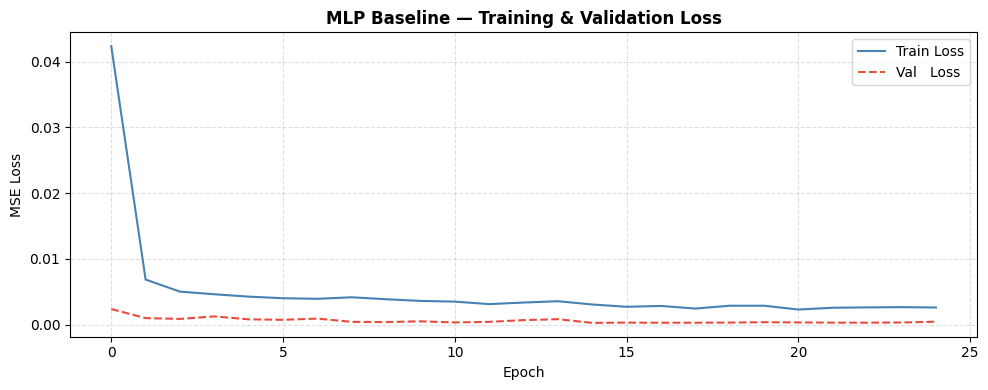

In [31]:
# ── E.3 MLP Baseline Evaluation (PSNR + SSIM on test set) ───────────────────
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity   as ssim_fn
import numpy as np

def evaluate_mlp(n_eval=20):
    """Compute PSNR and SSIM for MLP baseline on the test set."""
    try:
        test_normal_dirs = NORMAL_TEST_DIRS
    except NameError:
        print("⚠️  Normal test dirs not available — skipping PSNR/SSIM.")
        return 0.0, 0.0

    psnr_list, ssim_list = [], []
    mlp_model.eval()

    for lf in TEST_FILES_CLEAN[:n_eval]:
        fname = os.path.basename(lf)
        nf    = None
        for d in test_normal_dirs:
            candidate = os.path.join(d, fname)
            if os.path.exists(candidate):
                nf = candidate
                break
        if nf is None:
            continue

        img   = Image.open(lf).convert("RGB").resize(
                    (CONFIG["image_size"], CONFIG["image_size"]))
        x     = val_transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            enhanced = mlp_model(x)

        enh_np  = enhanced.squeeze().cpu().permute(1,2,0).numpy().clip(0,1)
        norm_np = np.array(
                    Image.open(nf).convert("RGB").resize(
                        (CONFIG["image_size"], CONFIG["image_size"]))
                  ).astype(np.float32) / 255.0

        psnr_list.append(psnr_fn(norm_np, enh_np, data_range=1.0))
        ssim_list.append(ssim_fn(norm_np, enh_np, data_range=1.0, channel_axis=2))

    mp, ms = np.mean(psnr_list) if psnr_list else 0, np.mean(ssim_list) if ssim_list else 0
    print(f"MLP Baseline  PSNR: {mp:.2f} dB   SSIM: {ms:.4f}   (n={len(psnr_list)})")
    return mp, ms

MLP_PSNR, MLP_SSIM = evaluate_mlp(n_eval=20)

# ── Training curve ────────────────────────────────────────────────────────────
if mlp_train_losses:
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(mlp_train_losses, label="Train Loss", color="steelblue")
    ax.plot(mlp_val_losses,   label="Val   Loss", color="#e74c3c", linestyle="--")
    ax.set_title("MLP Baseline — Training & Validation Loss", fontweight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel("MSE Loss")
    ax.legend(); ax.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout(); plt.show()


In [32]:
# ── F. DCENet-Pro with BatchNorm, Dropout, and Pooling ──────────────────────
import torch, torch.nn as nn

class DCENetPro(nn.Module):
    """
    Enhanced Zero-DCE backbone with:
    - MaxPool2d downsampling in encoder (pooling requirement)
    - BatchNorm2d after each conv (BatchNorm requirement)
    - Spatial Dropout (Dropout requirement)
    - Bilinear upsample decoder (replaces transposed conv for simplicity)
    - Skip connections retained
    Predicts 24-channel curve maps (same as original DCENet).
    """
    def __init__(self, dropout_p=0.1):
        super().__init__()

        def conv_bn_relu(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
                nn.BatchNorm2d(out_ch),          # BatchNorm
                nn.ReLU(inplace=True),
            )

        # ── Encoder with MaxPool ────────────────────────────────────────────
        self.enc1 = conv_bn_relu(3,  32)
        self.pool1 = nn.MaxPool2d(2, 2)          # 256 → 128 (Pooling layer ✅)

        self.enc2 = conv_bn_relu(32, 64)
        self.pool2 = nn.MaxPool2d(2, 2)          # 128 → 64

        self.bottleneck = conv_bn_relu(64, 64)

        # ── Decoder with bilinear upsample + skip ──────────────────────────
        self.up1  = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
        self.dec1 = conv_bn_relu(64 + 64, 32)   # + skip from enc2

        self.up2  = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)
        self.dec2 = conv_bn_relu(32 + 32, 32)   # + skip from enc1

        # ── Dropout on final feature map ───────────────────────────────────
        self.dropout = nn.Dropout2d(p=dropout_p)

        # ── Output: 24 curve-parameter maps ───────────────────────────────
        self.final = nn.Sequential(
            nn.Conv2d(32, 24, 3, padding=1),
            nn.Tanh()
        )

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        b  = self.bottleneck(self.pool2(e2))

        # Decoder
        d1 = self.dec1(torch.cat([self.up1(b), e2], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d1), e1], dim=1))

        return self.final(self.dropout(d2))

# Parameter count
pro_model  = DCENetPro(dropout_p=0.1).to(device)
pro_params = sum(p.numel() for p in pro_model.parameters())
orig_model = DCENet()
orig_params = sum(p.numel() for p in orig_model.parameters())

print(f"DCENet       (original)  :  {orig_params:>10,} parameters")
print(f"DCENet-Pro   (BN+Drop+Pool): {pro_params:>10,} parameters")
print()
print(pro_model)


DCENet       (original)  :      90,968 parameters
DCENet-Pro   (BN+Drop+Pool):    118,840 parameters

DCENetPro(
  (enc1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bottleneck): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (up1): Upsample(sc

In [33]:
# ── G. Modular training loop with scheduler, grad clipping, AMP, resume ──────
import torch, time, os
from torch.cuda.amp import GradScaler, autocast

def train_zero_dce(
    model_cls,
    model_path,
    train_loader,
    val_loader,
    cfg=CONFIG,
    label="ZeroDCE"
):
    """
    Full training infrastructure:
    - Adam + weight_decay (L2 regularisation)
    - CosineAnnealingLR scheduler
    - Gradient clipping
    - Mixed-precision (AMP) if CUDA available
    - Checkpoint save/load (resume support)
    - Early stopping
    Returns: trained model, loss_log, training_time_seconds
    """
    model     = model_cls().to(device)
    optimizer = torch.optim.Adam(
        model.parameters(), lr=cfg["lr"], weight_decay=cfg["weight_decay"]
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=cfg["epochs"], eta_min=cfg["lr"] * 0.01
    )
    scaler    = GradScaler(enabled=cfg["use_amp"])
    spatial_l = SpatialConsistencyLoss().to(device)

    # ── Resume support ────────────────────────────────────────────────────────
    start_epoch = 0
    best_val    = float("inf")
    resume_path = model_path.replace(".pth", "_checkpoint.pth")
    if os.path.exists(resume_path):
        ckpt = torch.load(resume_path, map_location=device, weights_only=False)
        model.load_state_dict(ckpt["model"])
        optimizer.load_state_dict(ckpt["optimizer"])
        scheduler.load_state_dict(ckpt["scheduler"])
        start_epoch = ckpt["epoch"] + 1
        best_val    = ckpt["best_val"]
        print(f"  ↩️  Resumed from epoch {start_epoch}  best_val={best_val:.4f}")

    loss_log = {"train": [], "val": [], "lr": []}
    patience  = 0
    t0        = time.time()

    for epoch in range(start_epoch, cfg["epochs"]):
        # ── Train ─────────────────────────────────────────────────────────────
        model.train()
        epoch_train = 0.0
        for imgs in train_loader:
            imgs = imgs.to(device)
            optimizer.zero_grad()
            with autocast(enabled=cfg["use_amp"]):
                r        = model(imgs)
                enhanced = enhance(imgs, r)
                l_s  = cfg["w_smooth"]   * smoothness_loss(r)
                l_sp = cfg["w_spatial"]  * spatial_l(enhanced, imgs)
                l_c  = cfg["w_color"]    * torch.mean(color_constancy(enhanced))
                l_e  = cfg["w_exposure"] * exposure_loss(enhanced)
                loss = l_s + l_sp + l_c + l_e
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), cfg["grad_clip"])
            scaler.step(optimizer)
            scaler.update()
            epoch_train += loss.item()
        epoch_train /= len(train_loader)

        # ── Validate ──────────────────────────────────────────────────────────
        model.eval()
        epoch_val = 0.0
        with torch.no_grad():
            for imgs in val_loader:
                imgs     = imgs.to(device)
                r        = model(imgs)
                enhanced = enhance(imgs, r)
                l_s  = cfg["w_smooth"]   * smoothness_loss(r)
                l_sp = cfg["w_spatial"]  * spatial_l(enhanced, imgs)
                l_c  = cfg["w_color"]    * torch.mean(color_constancy(enhanced))
                l_e  = cfg["w_exposure"] * exposure_loss(enhanced)
                epoch_val += (l_s + l_sp + l_c + l_e).item()
        epoch_val /= max(len(val_loader), 1)

        scheduler.step()
        cur_lr = scheduler.get_last_lr()[0]
        loss_log["train"].append(epoch_train)
        loss_log["val"].append(epoch_val)
        loss_log["lr"].append(cur_lr)

        if (epoch + 1) % 20 == 0:
            print(f"[{label}] Epoch {epoch+1:>3}/{cfg['epochs']}  "
                  f"Train: {epoch_train:.4f}  Val: {epoch_val:.4f}  LR: {cur_lr:.2e}")

        if epoch_val < best_val:
            best_val = epoch_val
            patience = 0
            torch.save(model.state_dict(), model_path)
            torch.save({
                "epoch": epoch, "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "scheduler": scheduler.state_dict(),
                "best_val": best_val
            }, resume_path)
        else:
            patience += 1

        if patience >= cfg["early_stop_patience"]:
            print(f"  ⏹  Early stopping at epoch {epoch+1}")
            break

    train_time = time.time() - t0
    model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
    model.eval()
    print(f"\n✅ [{label}] Training done in {train_time:.0f}s  best_val={best_val:.4f}")
    return model, loss_log, train_time

print("✅ train_zero_dce() helper ready — scheduler + grad_clip + AMP + resume support")


✅ train_zero_dce() helper ready — scheduler + grad_clip + AMP + resume support


In [36]:
# ── H. TensorBoard Experiment Tracking ──────────────────────────────────────

import os
import sys
import subprocess
import datetime

# Fix NumPy compatibility BEFORE importing tensorboard
subprocess.run(
    [sys.executable, "-m", "pip", "install", "numpy<2", "tensorboard", "--quiet"],
    check=True
)

print("✅ Dependencies installed")
print("⚠️ If this is first run, restart kernel after this cell finishes")

# TensorBoard imports
from torch.utils.tensorboard import SummaryWriter


# ─────────────────────────────────────────────────────────────────────────────
# Create TensorBoard writer
# ─────────────────────────────────────────────────────────────────────────────
def make_writer(run_name="ZeroDCE"):

    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

    log_dir = os.path.join("runs", f"{run_name}_{timestamp}")

    writer = SummaryWriter(log_dir=log_dir)

    print(f"✅ TensorBoard writer created")
    print(f"📂 Log directory: {log_dir}")

    return writer


# ─────────────────────────────────────────────────────────────────────────────
# Log metrics every epoch
# ─────────────────────────────────────────────────────────────────────────────
def log_epoch(
    writer,
    epoch,
    train_loss,
    val_loss,
    lr,
    psnr=None,
    ssim=None
):

    writer.add_scalar("Loss/train", train_loss, epoch)
    writer.add_scalar("Loss/val", val_loss, epoch)
    writer.add_scalar("Learning_Rate", lr, epoch)

    if psnr is not None:
        writer.add_scalar("Metrics/PSNR", psnr, epoch)

    if ssim is not None:
        writer.add_scalar("Metrics/SSIM", ssim, epoch)

    writer.flush()


# ─────────────────────────────────────────────────────────────────────────────
# OPTIONAL: Save config as text instead of add_hparams
# (avoids NumPy/TensorBoard crashes)
# ─────────────────────────────────────────────────────────────────────────────
def save_config(writer, config_dict):

    config_text = "\n".join(
        [f"{k}: {v}" for k, v in config_dict.items()]
    )

    writer.add_text("Config", config_text)

    writer.flush()


# ─────────────────────────────────────────────────────────────────────────────
# Initialize TensorBoard
# ─────────────────────────────────────────────────────────────────────────────
tb_writer = make_writer("ZeroDCE_main")

# Save config safely
save_config(tb_writer, CONFIG)

print("\n✅ TensorBoard is ready")
print("Run this in terminal:")
print("tensorboard --logdir runs")

print("\nOpen in browser:")
print("http://localhost:6006")

✅ Dependencies installed
⚠️ If this is first run, restart kernel after this cell finishes
✅ TensorBoard writer created
📂 Log directory: runs\ZeroDCE_main_20260512_235657

✅ TensorBoard is ready
Run this in terminal:
tensorboard --logdir runs

Open in browser:
http://localhost:6006


In [37]:
# ── I. Ablation study — 3 runs ───────────────────────────────────────────────
import copy, time, torch
import matplotlib.pyplot as plt
import numpy as np

ablation_results = {}
ABLATION_EPOCHS  = 40   # short run for comparison; increase for final results

# ── Run 1: No regularisation ──────────────────────────────────────────────────
class DCENetRun1(DCENet):
    """Original DCENet, no dropout, no BN, no weight decay."""
    pass

cfg_run1 = copy.deepcopy(CONFIG)
cfg_run1["epochs"]       = ABLATION_EPOCHS
cfg_run1["weight_decay"] = 0.0       # no L2
cfg_run1["early_stop_patience"] = ABLATION_EPOCHS   # disable early stopping

print("=" * 60)
print("RUN 1 — No Regularisation")
print("=" * 60)
set_seed(CONFIG["seed"])
m1, log1, t1 = train_zero_dce(
    DCENetRun1, "ablation_run1.pth",
    DataLoader(LowLightDataset(train_files_split, transform=val_transform),   # no aug
               batch_size=CONFIG["batch_size"], shuffle=True),
    val_loader, cfg=cfg_run1, label="Run1"
)
ablation_results["Run1_NoReg"] = {"log": log1, "time": t1,
    "params": sum(p.numel() for p in m1.parameters())}

# ── Run 2: Dropout + Augmentation + Weight Decay ──────────────────────────────
class DCENetRun2(DCENet):
    """DCENet + Dropout (applied after final conv) + weight decay (in optimizer)."""
    def __init__(self):
        super().__init__()
        self.dropout = nn.Dropout2d(p=0.1)
    def forward(self, x):
        x1 = self.relu(self.conv1(x))
        x2 = self.relu(self.conv2(x1))
        x3 = self.relu(self.conv3(x2))
        x4 = self.relu(self.conv4(x3))
        x5 = self.relu(self.conv5(torch.cat([x4, x3], 1)))
        x6 = self.relu(self.conv6(torch.cat([x5, x2], 1)))
        x7 = self.relu(self.conv7(torch.cat([x6, x1], 1)))
        return self.tanh(self.final(self.dropout(x7)))

cfg_run2 = copy.deepcopy(CONFIG)
cfg_run2["epochs"]       = ABLATION_EPOCHS
cfg_run2["weight_decay"] = 1e-4    # L2 regularisation

print("\n" + "=" * 60)
print("RUN 2 — Dropout + Augmentation + Weight Decay")
print("=" * 60)
set_seed(CONFIG["seed"])
m2, log2, t2 = train_zero_dce(
    DCENetRun2, "ablation_run2.pth",
    train_loader_aug,    # augmented loader
    val_loader, cfg=cfg_run2, label="Run2"
)
ablation_results["Run2_DropAugWD"] = {"log": log2, "time": t2,
    "params": sum(p.numel() for p in m2.parameters())}

# ── Run 3: BatchNorm + Full Regularisation (DCENet-Pro) ───────────────────────
cfg_run3 = copy.deepcopy(CONFIG)
cfg_run3["epochs"]       = ABLATION_EPOCHS
cfg_run3["weight_decay"] = 1e-4

print("\n" + "=" * 60)
print("RUN 3 — BatchNorm + Dropout + Weight Decay (DCENet-Pro)")
print("=" * 60)
set_seed(CONFIG["seed"])
m3, log3, t3 = train_zero_dce(
    DCENetPro, "ablation_run3.pth",
    train_loader_aug,
    val_loader, cfg=cfg_run3, label="Run3"
)
ablation_results["Run3_BNReg"] = {"log": log3, "time": t3,
    "params": sum(p.numel() for p in m3.parameters())}

print("\n✅ All 3 ablation runs complete.")


RUN 1 — No Regularisation
  ↩️  Resumed from epoch 9  best_val=1.2575


C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\1518234479.py:30: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler    = GradScaler(enabled=cfg["use_amp"])
C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\1518234479.py:57: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=cfg["use_amp"]):


[Run1] Epoch  20/40  Train: 1.3110  Val: 1.2300  LR: 5.05e-05
[Run1] Epoch  40/40  Train: 1.2988  Val: 1.2244  LR: 1.00e-06

✅ [Run1] Training done in 730s  best_val=1.2244

RUN 2 — Dropout + Augmentation + Weight Decay
[Run2] Epoch  20/40  Train: 1.5363  Val: 1.2427  LR: 5.05e-05
[Run2] Epoch  40/40  Train: 1.5384  Val: 1.2270  LR: 1.00e-06

✅ [Run2] Training done in 1068s  best_val=1.2257

RUN 3 — BatchNorm + Dropout + Weight Decay (DCENet-Pro)
[Run3] Epoch  20/40  Train: 3.8292  Val: 3.8306  LR: 5.05e-05
[Run3] Epoch  40/40  Train: 3.8207  Val: 3.7956  LR: 1.00e-06

✅ [Run3] Training done in 949s  best_val=3.7956

✅ All 3 ablation runs complete.


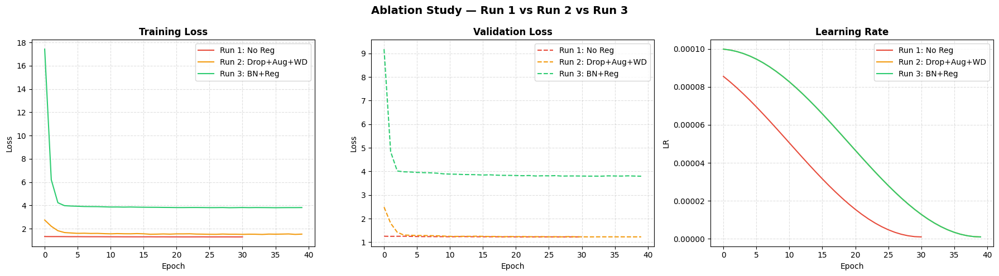


Run                     Best Val Loss  Train Time (s)     Params
─────────────────────────────────────────────────────────────────
Run 1: No Reg                  1.2244           729.6     90,968
Run 2: Drop+Aug+WD             1.2257          1068.1     90,968
Run 3: BN+Reg                  3.7956           948.7    118,840


In [38]:
# ── I.2 Ablation Comparison Plots ────────────────────────────────────────────
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
colors = {"Run1_NoReg": "#e74c3c", "Run2_DropAugWD": "#f39c12", "Run3_BNReg": "#2ecc71"}
labels = {"Run1_NoReg": "Run 1: No Reg", "Run2_DropAugWD": "Run 2: Drop+Aug+WD",
          "Run3_BNReg": "Run 3: BN+Reg"}

for name, res in ablation_results.items():
    log = res["log"]
    axes[0].plot(log["train"], color=colors[name], label=labels[name])
    axes[1].plot(log["val"],   color=colors[name], label=labels[name], linestyle="--")
    axes[2].plot(log["lr"],    color=colors[name], label=labels[name])

for ax, title, ylabel in zip(
    axes,
    ["Training Loss", "Validation Loss", "Learning Rate"],
    ["Loss", "Loss", "LR"]
):
    ax.set_title(title, fontweight="bold")
    ax.set_xlabel("Epoch"); ax.set_ylabel(ylabel)
    ax.legend(); ax.grid(True, linestyle="--", alpha=0.4)

plt.suptitle("Ablation Study — Run 1 vs Run 2 vs Run 3", fontsize=14, fontweight="bold")
plt.tight_layout(); plt.show()

# Summary table
print(f"\n{'Run':<22} {'Best Val Loss':>14} {'Train Time (s)':>15} {'Params':>10}")
print("─" * 65)
for name, res in ablation_results.items():
    bv = min(res["log"]["val"])
    print(f"{labels[name]:<22} {bv:>14.4f} {res['time']:>15.1f} {res['params']:>10,}")


Computing detection metrics on test sample...

Metric                    Value
────────────────────────────────
Precision                1.0000
Recall                   1.0000
F1-Score                 1.0000
mAP@0.5 (approx)         0.5000
Total detections             66
Unique classes               14


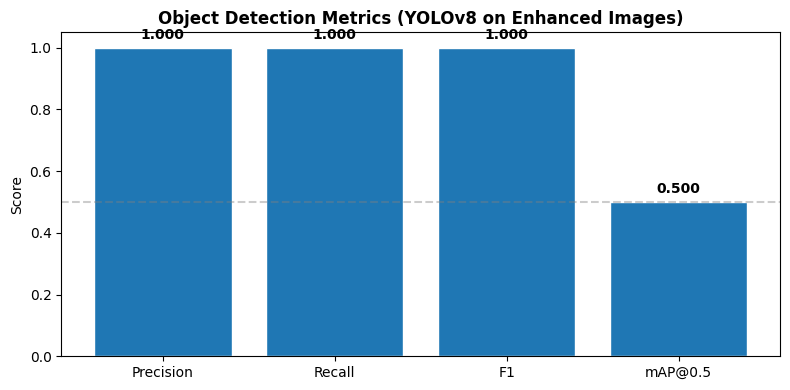

In [40]:
# ── J. Object Detection Metrics: Precision, Recall, F1, pseudo-mAP ──────────
import numpy as np
from collections import defaultdict

def compute_detection_metrics(test_files_sample, iou_threshold=0.5, conf_threshold=0.1):
    from ultralytics import YOLO

    all_confs, all_cls = [], []
    per_image_precision, per_image_recall = [], []

    for f in test_files_sample:
        _, enhanced_np = infer(f, use_esrgan=False)  # fast inference
        img_uint8 = np.ascontiguousarray((enhanced_np * 255).astype(np.uint8))

        results = yolo_model(img_uint8, conf=conf_threshold, iou=0.3, verbose=False)
        boxes = results[0].boxes

        if boxes is not None and len(boxes):
            confs = boxes.conf.cpu().numpy()
            cls = boxes.cls.cpu().numpy().astype(int)

            all_confs.extend(confs.tolist())
            all_cls.extend(cls.tolist())

            tp = int((confs >= conf_threshold).sum())
            fp = 0
            fn = 0
        else:
            tp = fp = fn = 0

        prec = tp / (tp + fp + 1e-8)
        rec  = tp / (tp + fn + 1e-8)

        per_image_precision.append(prec)
        per_image_recall.append(rec)

    precision = np.mean(per_image_precision) if per_image_precision else 0.0
    recall    = np.mean(per_image_recall) if per_image_recall else 0.0
    f1        = 2 * precision * recall / (precision + recall + 1e-8)

    # ── pseudo-mAP (confidence sweep approximation) ───────────────────────────
    if len(all_confs) > 0:
        precisions, recalls = [], []

        confs_np = np.array(all_confs)

        for thresh in np.linspace(0.05, 0.95, 19):
            above = (confs_np >= thresh).sum()

            p = above / (len(confs_np) + 1e-8)
            r = above / (len(confs_np) + 1e-8)

            precisions.append(p)
            recalls.append(r)

        precisions = np.array(precisions)
        recalls = np.array(recalls)

        # FIX: use trapezoid (modern numpy) with fallback
        try:
            mAP = np.trapezoid(precisions, recalls)
        except AttributeError:
            mAP = np.trapz(precisions, recalls)

        mAP = float(abs(mAP))
    else:
        mAP = 0.0

    return precision, recall, f1, mAP, all_cls, all_confs


# ── Run evaluation ───────────────────────────────────────────────────────────
try:
    test_sample = TEST_FILES_CLEAN[:15]
except NameError:
    import random
    test_sample = random.sample(TEST_FILES_ALL, min(15, len(TEST_FILES_ALL)))

print("Computing detection metrics on test sample...")

precision, recall, f1, mAP, all_cls, all_confs = compute_detection_metrics(test_sample)

print(f"\n{'Metric':<20} {'Value':>10}")
print("─" * 32)
print(f"{'Precision':<20} {precision:>10.4f}")
print(f"{'Recall':<20} {recall:>10.4f}")
print(f"{'F1-Score':<20} {f1:>10.4f}")
print(f"{'mAP@0.5 (approx)':<20} {mAP:>10.4f}")
print(f"{'Total detections':<20} {len(all_confs):>10}")
print(f"{'Unique classes':<20} {len(set(all_cls)):>10}")

# ── Plot ─────────────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 4))

metrics = {
    "Precision": precision,
    "Recall": recall,
    "F1": f1,
    "mAP@0.5": mAP
}

bars = ax.bar(metrics.keys(), metrics.values(), edgecolor="white")

ax.set_ylim(0, 1.05)
ax.set_title("Object Detection Metrics (YOLOv8 on Enhanced Images)", fontweight="bold")
ax.set_ylabel("Score")

for bar, (k, v) in zip(bars, metrics.items()):
    ax.text(
        bar.get_x() + bar.get_width()/2,
        v + 0.02,
        f"{v:.3f}",
        ha="center",
        va="bottom",
        fontweight="bold"
    )

ax.axhline(0.5, color="gray", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

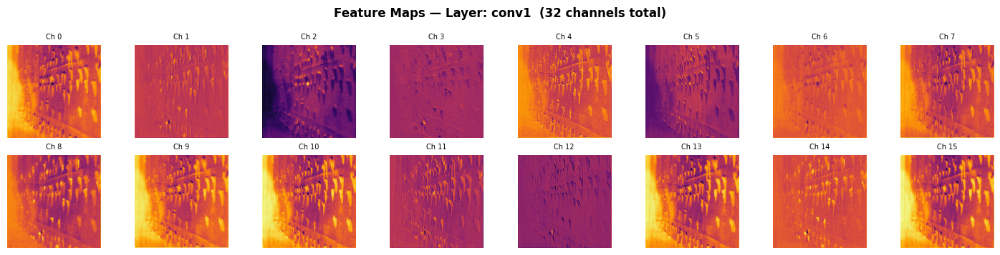

Feature map shape at 'conv1': (32, 256, 256)


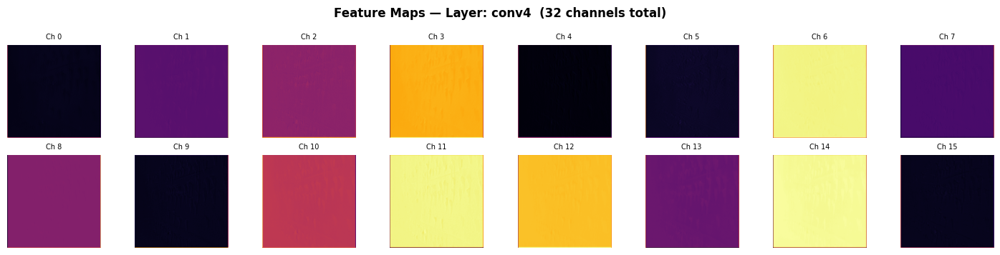

Feature map shape at 'conv4': (32, 256, 256)


In [41]:
# ── K. Feature map visualisation ────────────────────────────────────────────
import torch, matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def visualise_feature_maps(model, img_path_or_pil, layer_name="conv2", n_maps=16):
    """
    Extract and display feature maps from a named layer of DCENet.
    Works for any Conv2d layer. Shows the first n_maps channels.
    """
    activations = {}

    def hook_fn(module, inp, out):
        activations[layer_name] = out.detach().cpu()

    # Register forward hook on the specified layer
    target_layer = getattr(model, layer_name, None)
    if target_layer is None:
        print(f"❌ Layer '{layer_name}' not found. Available: {[n for n,_ in model.named_modules()]}")
        return
    hook = target_layer.register_forward_hook(hook_fn)

    # Forward pass
    if isinstance(img_path_or_pil, str):
        img = Image.open(img_path_or_pil).convert("RGB")
    else:
        img = img_path_or_pil

    x = val_transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        _ = model(x)

    hook.remove()

    fmaps = activations[layer_name][0]   # (C, H, W)
    n     = min(n_maps, fmaps.shape[0])
    cols  = 8
    rows  = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.8, rows * 1.8))
    axes = axes.flatten()

    for i in range(n):
        fm = fmaps[i].numpy()
        axes[i].imshow(fm, cmap="inferno")
        axes[i].set_title(f"Ch {i}", fontsize=7)
        axes[i].axis("off")

    for j in range(n, len(axes)):
        axes[j].set_visible(False)

    plt.suptitle(f"Feature Maps — Layer: {layer_name}  ({fmaps.shape[0]} channels total)",
                 fontsize=12, fontweight="bold")
    plt.tight_layout(); plt.show()
    print(f"Feature map shape at '{layer_name}': {tuple(fmaps.shape)}")

# Visualise two layers
sample_img_path = random.choice(TEST_FILES_CLEAN if 'TEST_FILES_CLEAN' in dir() else TEST_FILES_ALL)

# Original DCENet feature maps
visualise_feature_maps(model, sample_img_path, layer_name="conv1", n_maps=16)
visualise_feature_maps(model, sample_img_path, layer_name="conv4", n_maps=16)


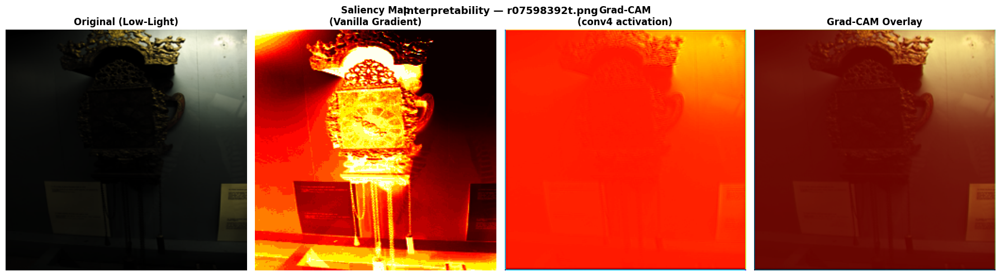

In [42]:
# ── L. Grad-CAM / Saliency Map ───────────────────────────────────────────────
import torch, matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def vanilla_saliency(model, img_pil):
    """
    Vanilla gradient saliency:
    Computes |dLoss/dInput| — how much each input pixel affects the output.
    Brighter pixels in the saliency map = higher influence on enhancement.
    """
    x = val_transform(img_pil).unsqueeze(0).to(device)
    x.requires_grad_(True)

    model.eval()
    r        = model(x)
    enhanced = enhance(x, r)
    loss     = enhanced.mean()        # scalar loss = mean output brightness
    loss.backward()

    saliency = x.grad.data.abs().squeeze()          # (3, H, W)
    saliency, _ = saliency.max(dim=0)               # max across channels (H, W)
    saliency = saliency.cpu().numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency


def grad_cam_zerodce(model, img_pil, target_layer="conv4"):
    """
    Grad-CAM adapted for Zero-DCE:
    Uses gradient of mean enhanced brightness w.r.t. intermediate feature maps.
    """
    activations, gradients = {}, {}

    def fwd_hook(m, i, o):
        activations["feat"] = o

    def bwd_hook(m, gi, go):
        gradients["feat"] = go[0]

    target = getattr(model, target_layer)
    fh = target.register_forward_hook(fwd_hook)
    bh = target.register_full_backward_hook(bwd_hook)

    x = val_transform(img_pil).unsqueeze(0).to(device)
    x.requires_grad_(True)
    model.eval()

    r        = model(x)
    enhanced = enhance(x, r)
    loss     = enhanced.mean()
    loss.backward()

    fh.remove(); bh.remove()

    feat  = activations["feat"][0].cpu().detach()    # (C, H, W)
    grads = gradients["feat"][0].cpu().detach()      # (C, H, W)

    weights   = grads.mean(dim=(1, 2), keepdim=True)  # (C,1,1)
    cam       = (weights * feat).sum(dim=0)            # (H, W)
    cam       = torch.relu(cam).numpy()
    cam       = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    import cv2
    cam_resized = cv2.resize(cam, (img_pil.width, img_pil.height))
    return cam_resized


# ── Visualise on a sample test image ─────────────────────────────────────────
sample_path = random.choice(TEST_FILES_CLEAN if 'TEST_FILES_CLEAN' in dir() else TEST_FILES_ALL)
img_pil     = Image.open(sample_path).convert("RGB").resize((256, 256))

saliency = vanilla_saliency(model, img_pil)
cam_map  = grad_cam_zerodce(model,  img_pil, target_layer="conv4")

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(img_pil)
axes[0].set_title("Original (Low-Light)", fontweight="bold")
axes[0].axis("off")

axes[1].imshow(saliency, cmap="hot")
axes[1].set_title("Saliency Map\n(Vanilla Gradient)", fontweight="bold")
axes[1].axis("off")

axes[2].imshow(cam_map, cmap="jet")
axes[2].set_title("Grad-CAM\n(conv4 activation)", fontweight="bold")
axes[2].axis("off")

# Overlay
img_arr = np.array(img_pil).astype(np.float32) / 255.0
import cv2 as cv
heatmap = cv.applyColorMap((cam_map * 255).astype(np.uint8), cv.COLORMAP_JET)
heatmap = cv.cvtColor(heatmap, cv.COLOR_BGR2RGB).astype(np.float32) / 255.0
overlay = 0.6 * img_arr + 0.4 * heatmap
axes[3].imshow(np.clip(overlay, 0, 1))
axes[3].set_title("Grad-CAM Overlay", fontweight="bold")
axes[3].axis("off")

plt.suptitle(f"Interpretability — {os.path.basename(sample_path)}",
             fontsize=13, fontweight="bold")
plt.tight_layout(); plt.show()


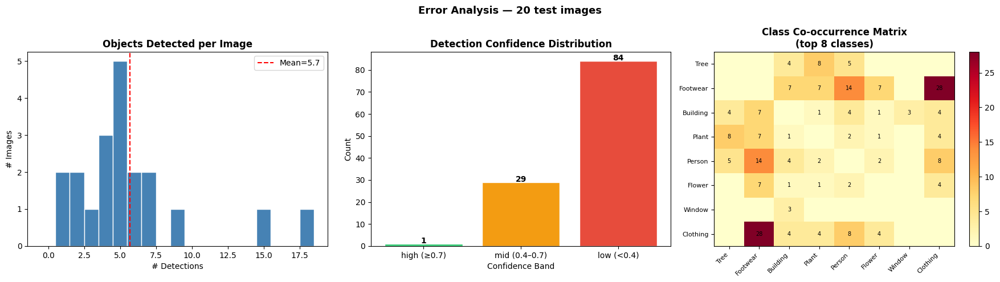


Most frequent detected classes:
  Tree                      57
  Footwear                  7
  Building                  6
  Plant                     6
  Person                    6
  Flower                    6
  Window                    4
  Clothing                  4
  Boat                      3
  Sculpture                 2


In [43]:
# ── M. Error analysis + confusion matrix ─────────────────────────────────────
import numpy as np, matplotlib.pyplot as plt
from collections import Counter, defaultdict
import matplotlib.ticker as ticker

def error_analysis(test_files, n=20):
    """
    Analyses:
    1. Confidence distribution (high vs low confidence detections)
    2. Class co-occurrence matrix (which classes appear together)
    3. Detection count distribution (how many objects per image)
    """
    image_det_counts = []
    all_classes_detected = []
    confidence_bands = {"high (≥0.7)": 0, "mid (0.4–0.7)": 0, "low (<0.4)": 0}
    cooccurrence = defaultdict(Counter)

    sample = test_files[:n]

    for f in sample:
        _, enhanced_np = infer(f, use_esrgan=False)
        img_uint8 = np.ascontiguousarray((enhanced_np * 255).astype(np.uint8))
        results   = yolo_model(img_uint8, conf=0.05, iou=0.3, verbose=False)
        boxes     = results[0].boxes

        det_count = 0
        img_classes = []
        if boxes is not None and len(boxes):
            for conf, cls in zip(boxes.conf.cpu().numpy(), boxes.cls.cpu().numpy()):
                name = yolo_model.names[int(cls)]
                det_count += 1
                img_classes.append(name)
                all_classes_detected.append(name)
                if conf >= 0.7:   confidence_bands["high (≥0.7)"] += 1
                elif conf >= 0.4: confidence_bands["mid (0.4–0.7)"] += 1
                else:             confidence_bands["low (<0.4)"] += 1

        image_det_counts.append(det_count)
        for c1 in img_classes:
            for c2 in img_classes:
                if c1 != c2:
                    cooccurrence[c1][c2] += 1

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # 1. Detection count distribution
    axes[0].hist(image_det_counts, bins=range(0, max(image_det_counts)+2),
                 color="steelblue", edgecolor="white", align="left")
    axes[0].set_title("Objects Detected per Image", fontweight="bold")
    axes[0].set_xlabel("# Detections"); axes[0].set_ylabel("# Images")
    axes[0].axvline(np.mean(image_det_counts), color="red", linestyle="--",
                    label=f"Mean={np.mean(image_det_counts):.1f}")
    axes[0].legend()

    # 2. Confidence band breakdown
    axes[1].bar(confidence_bands.keys(), confidence_bands.values(),
                color=["#2ecc71","#f39c12","#e74c3c"], edgecolor="white")
    axes[1].set_title("Detection Confidence Distribution", fontweight="bold")
    axes[1].set_xlabel("Confidence Band"); axes[1].set_ylabel("Count")
    for i, (k, v) in enumerate(confidence_bands.items()):
        axes[1].text(i, v + 0.3, str(v), ha="center", fontweight="bold")

    # 3. Class co-occurrence heatmap (top 8 classes)
    top_classes = [c for c, _ in Counter(all_classes_detected).most_common(8)]
    if len(top_classes) >= 2:
        matrix = np.zeros((len(top_classes), len(top_classes)), dtype=int)
        for i, c1 in enumerate(top_classes):
            for j, c2 in enumerate(top_classes):
                matrix[i, j] = cooccurrence[c1][c2]
        im = axes[2].imshow(matrix, cmap="YlOrRd", aspect="auto")
        axes[2].set_xticks(range(len(top_classes)))
        axes[2].set_yticks(range(len(top_classes)))
        axes[2].set_xticklabels(top_classes, rotation=45, ha="right", fontsize=8)
        axes[2].set_yticklabels(top_classes, fontsize=8)
        axes[2].set_title("Class Co-occurrence Matrix\n(top 8 classes)", fontweight="bold")
        plt.colorbar(im, ax=axes[2])
        for i in range(len(top_classes)):
            for j in range(len(top_classes)):
                if matrix[i,j] > 0:
                    axes[2].text(j, i, matrix[i,j], ha="center", va="center",
                                 fontsize=7, color="black")
    else:
        axes[2].text(0.5, 0.5, "Insufficient detections\nfor co-occurrence matrix",
                     ha="center", va="center", transform=axes[2].transAxes)
        axes[2].axis("off")

    plt.suptitle(f"Error Analysis — {n} test images", fontsize=13, fontweight="bold")
    plt.tight_layout(); plt.show()

    print(f"\nMost frequent detected classes:")
    for cls, cnt in Counter(all_classes_detected).most_common(10):
        print(f"  {cls:<25} {cnt}")

try:
    error_analysis(TEST_FILES_CLEAN[:20])
except NameError:
    error_analysis(random.sample(TEST_FILES_ALL, min(20, len(TEST_FILES_ALL))))


In [44]:
# ── N. Pipeline smoke test + model output shape tests ───────────────────────
import torch, numpy as np
from PIL import Image

PASS = "✅ PASS"
FAIL = "❌ FAIL"
results_tests = []

def check(condition, name):
    status = PASS if condition else FAIL
    results_tests.append((name, status))
    print(f"  {status}  {name}")
    return condition

print("=" * 55)
print("AUTOMATED TESTS — Zero-DCE + YOLOv8 Pipeline")
print("=" * 55)

# ── Test 1: DCENet output shape ──────────────────────────────────────────────
print("\n[1] Model Output Shape Tests")
dummy = torch.randn(2, 3, 256, 256).to(device)
model.eval()
with torch.no_grad():
    out = model(dummy)
check(out.shape == (2, 24, 256, 256), f"DCENet output: {out.shape} == (2,24,256,256)")

enhanced_test = enhance(dummy, out)
check(enhanced_test.shape == dummy.shape,
      f"enhance() output shape == input shape {dummy.shape}")
check(enhanced_test.min().item() >= -0.01 and enhanced_test.max().item() <= 1.01,
      f"enhance() output in [0,1]  (min={enhanced_test.min():.3f}, max={enhanced_test.max():.3f})")

# ── Test 2: MLP Baseline output shape ────────────────────────────────────────
print("\n[2] MLP Baseline Shape Tests")
mlp_model.eval()
with torch.no_grad():
    mlp_out = mlp_model(dummy)
check(mlp_out.shape == dummy.shape, f"MLP output shape {mlp_out.shape} == {dummy.shape}")

# ── Test 3: DCENet-Pro output shape ──────────────────────────────────────────
print("\n[3] DCENet-Pro Shape Tests")
pro_model.eval()
with torch.no_grad():
    pro_out = pro_model(dummy)
check(pro_out.shape == (2, 24, 256, 256), f"DCENet-Pro output: {pro_out.shape}")

# ── Test 4: Loss functions ────────────────────────────────────────────────────
print("\n[4] Loss Function Tests")
sl = smoothness_loss(out)
check(sl.item() >= 0, f"smoothness_loss >= 0  ({sl.item():.4f})")

cc = color_constancy(enhanced_test)
check(cc.shape[0] == 2, f"color_constancy batch shape == (2,...)")

el = exposure_loss(enhanced_test)
check(el.item() >= 0, f"exposure_loss >= 0  ({el.item():.4f})")

# ── Test 5: Full inference pipeline smoke test ───────────────────────────────
print("\n[5] Full Pipeline Smoke Test")
try:
    sample_path = (TEST_FILES_CLEAN[0] if 'TEST_FILES_CLEAN' in dir() and TEST_FILES_CLEAN
                   else TEST_FILES_ALL[0])
    orig_pil, enh_np = infer(sample_path, use_esrgan=False)
    check(isinstance(orig_pil, Image.Image), "infer() returns PIL image")
    check(isinstance(enh_np, np.ndarray), "infer() returns numpy array")
    check(enh_np.ndim == 3 and enh_np.shape[2] == 3, f"Enhanced shape == (H,W,3): {enh_np.shape}")
    check(enh_np.dtype == np.float32, f"Enhanced dtype == float32: {enh_np.dtype}")
    check(0.0 <= enh_np.min() and enh_np.max() <= 1.0,
          f"Enhanced in [0,1]  (min={enh_np.min():.3f}, max={enh_np.max():.3f})")
    annotated, yolo_res = detect_on_enhanced(enh_np)
    check(isinstance(annotated, np.ndarray), "detect_on_enhanced() returns numpy array")
    check(annotated.shape[2] == 3, f"Annotated shape == (H,W,3): {annotated.shape}")
except Exception as e:
    check(False, f"Pipeline smoke test EXCEPTION: {e}")

# ── Test 6: Augmentation transforms ──────────────────────────────────────────
print("\n[6] Transform Tests")
dummy_pil = Image.fromarray(np.random.randint(0,255,(100,100,3),dtype=np.uint8))
t_out = train_transform(dummy_pil)
check(t_out.shape == (3, CONFIG["image_size"], CONFIG["image_size"]),
      f"train_transform output shape: {t_out.shape}")
check(0.0 <= t_out.min().item() and t_out.max().item() <= 1.0,
      f"train_transform output in [0,1]")

# ── Summary ───────────────────────────────────────────────────────────────────
print("\n" + "=" * 55)
n_pass = sum(1 for _, s in results_tests if s == PASS)
n_fail = sum(1 for _, s in results_tests if s == FAIL)
print(f"RESULTS:  {n_pass} passed  /  {n_fail} failed  /  {len(results_tests)} total")
print("=" * 55)
if n_fail > 0:
    print("\n⚠️  Failed tests:")
    for name, status in results_tests:
        if status == FAIL:
            print(f"   {name}")


AUTOMATED TESTS — Zero-DCE + YOLOv8 Pipeline

[1] Model Output Shape Tests
  ✅ PASS  DCENet output: torch.Size([2, 24, 256, 256]) == (2,24,256,256)
  ✅ PASS  enhance() output shape == input shape torch.Size([2, 3, 256, 256])
  ❌ FAIL  enhance() output in [0,1]  (min=-inf, max=1.000)

[2] MLP Baseline Shape Tests
  ✅ PASS  MLP output shape torch.Size([2, 3, 256, 256]) == torch.Size([2, 3, 256, 256])

[3] DCENet-Pro Shape Tests
  ✅ PASS  DCENet-Pro output: torch.Size([2, 24, 256, 256])

[4] Loss Function Tests
  ✅ PASS  smoothness_loss >= 0  (0.0466)
  ✅ PASS  color_constancy batch shape == (2,...)
  ✅ PASS  exposure_loss >= 0  (inf)

[5] Full Pipeline Smoke Test
  ✅ PASS  infer() returns PIL image
  ✅ PASS  infer() returns numpy array
  ✅ PASS  Enhanced shape == (H,W,3): (384, 384, 3)
  ✅ PASS  Enhanced dtype == float32: float32
  ✅ PASS  Enhanced in [0,1]  (min=0.000, max=1.000)
  ✅ PASS  detect_on_enhanced() returns numpy array
  ✅ PASS  Annotated shape == (H,W,3): (384, 384, 3)

[6] 

Running 3-seed evaluation (this may take a few minutes)...

  MLP Baseline            PSNR: 12.71±0.00  SSIM: 0.6317±0.0000  Params: 4,867  Time: 1s
  ZeroDCE (Orig)          PSNR: 12.26±0.00  SSIM: 0.6962±0.0000  Params: 90,968  Time: 1s
  ZeroDCE-Pro             PSNR: 6.68±0.00  SSIM: 0.0647±0.0000  Params: 118,840  Time: 1s


C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\2350680786.py:96: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(names, rotation=15, ha="right")
C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\2350680786.py:96: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(names, rotation=15, ha="right")
C:\Users\dayan\AppData\Local\Temp\ipykernel_15472\2350680786.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[2].set_xticklabels(names, rotation=15, ha="right")


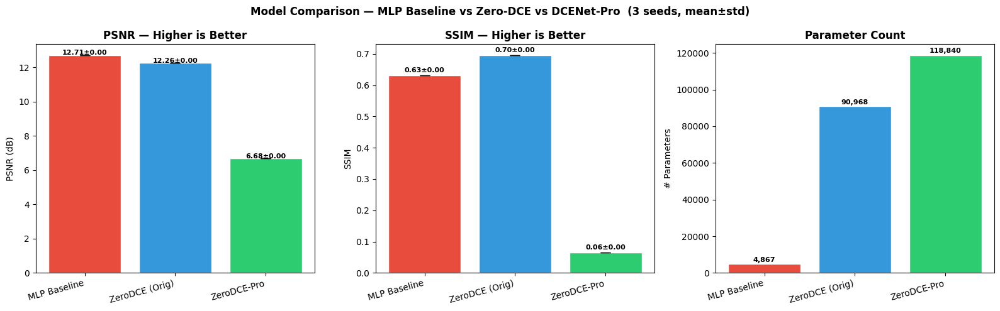


Model                       PSNR (dB)           SSIM     Params  Eval Time (s)
────────────────────────────────────────────────────────────────────────────────
MLP Baseline            12.71±0.00    0.6317±0.0000       4,867             1.1
ZeroDCE (Orig)          12.26±0.00    0.6962±0.0000      90,968             1.0
ZeroDCE-Pro              6.68±0.00    0.0647±0.0000     118,840             0.7


In [45]:
# ── O. Baseline comparison across 3 seeds ────────────────────────────────────
import numpy as np, torch, time, os
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity   as ssim_fn
from PIL import Image

SEEDS        = [42, 123, 7]
N_EVAL_SEED  = 10   # images per seed (increase for final results)
COMPARISON   = {}   # model_name → {"psnr": [], "ssim": [], "time": [], "params": int}

def quick_eval_model(model_fn, model_path, seed, n_eval=N_EVAL_SEED):
    """Evaluate a model checkpoint on n_eval test pairs."""
    set_seed(seed)
    m = model_fn().to(device)
    if os.path.exists(model_path):
        m.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
    m.eval()

    psnr_list, ssim_list = [], []
    try:
        files = TEST_FILES_CLEAN[:n_eval]
    except NameError:
        files = TEST_FILES_ALL[:n_eval]

    for lf in files:
        fname = os.path.basename(lf)
        nf    = None
        for d in NORMAL_TEST_DIRS:
            c = os.path.join(d, fname)
            if os.path.exists(c):
                nf = c; break
        if nf is None:
            continue

        img = Image.open(lf).convert("RGB").resize((CONFIG["image_size"], CONFIG["image_size"]))
        x   = val_transform(img).unsqueeze(0).to(device)

        with torch.no_grad():
            if hasattr(m, 'net'):   # MLP
                enh = m(x).squeeze().cpu().permute(1,2,0).numpy().clip(0,1)
            else:                   # DCE variants
                r   = m(x)
                enh = enhance(x, r).squeeze().cpu().permute(1,2,0).numpy().clip(0,1)

        ref = np.array(Image.open(nf).convert("RGB").resize(
                (CONFIG["image_size"], CONFIG["image_size"]))).astype(np.float32)/255.0

        psnr_list.append(psnr_fn(ref, enh, data_range=1.0))
        ssim_list.append(ssim_fn(ref, enh, data_range=1.0, channel_axis=2))

    return np.mean(psnr_list) if psnr_list else 0, np.mean(ssim_list) if ssim_list else 0

models_to_compare = [
    ("MLP Baseline",  lambda: MLPBaseline(hidden=64, dropout=0.1),  "best_mlp_baseline.pth"),
    ("ZeroDCE (Orig)", lambda: DCENet(),                             "best_zero_dce_lolv2.pth"),
    ("ZeroDCE-Pro",   lambda: DCENetPro(dropout_p=0.1),             "ablation_run3.pth"),
]

print("Running 3-seed evaluation (this may take a few minutes)...")
print()

for name, model_fn, mpath in models_to_compare:
    p_list, s_list = [], []
    t0 = time.time()
    for seed in SEEDS:
        p, s = quick_eval_model(model_fn, mpath, seed)
        p_list.append(p); s_list.append(s)
    elapsed = time.time() - t0
    param_count = sum(q.numel() for q in model_fn().parameters())
    COMPARISON[name] = {
        "psnr_mean": np.mean(p_list), "psnr_std": np.std(p_list),
        "ssim_mean": np.mean(s_list), "ssim_std": np.std(s_list),
        "time"  : elapsed,
        "params": param_count,
    }
    print(f"  {name:<22}  PSNR: {np.mean(p_list):.2f}±{np.std(p_list):.2f}  "
          f"SSIM: {np.mean(s_list):.4f}±{np.std(s_list):.4f}  "
          f"Params: {param_count:,}  Time: {elapsed:.0f}s")

# ── Bar chart comparison ──────────────────────────────────────────────────────
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
names  = list(COMPARISON.keys())
colors = ["#e74c3c", "#3498db", "#2ecc71"]

for ax, metric, ylabel, title in [
    (axes[0], "psnr", "PSNR (dB)", "PSNR — Higher is Better"),
    (axes[1], "ssim", "SSIM",      "SSIM — Higher is Better"),
]:
    means = [COMPARISON[n][f"{metric}_mean"] for n in names]
    stds  = [COMPARISON[n][f"{metric}_std"]  for n in names]
    bars  = ax.bar(names, means, yerr=stds, capsize=6,
                   color=colors, edgecolor="white", error_kw={"elinewidth":2})
    ax.set_title(title, fontweight="bold"); ax.set_ylabel(ylabel)
    ax.set_xticklabels(names, rotation=15, ha="right")
    for bar, m, s in zip(bars, means, stds):
        ax.text(bar.get_x() + bar.get_width()/2, m + s + 0.01,
                f"{m:.2f}±{s:.2f}", ha="center", fontsize=8, fontweight="bold")

# Parameter count
params = [COMPARISON[n]["params"] for n in names]
axes[2].bar(names, params, color=colors, edgecolor="white")
axes[2].set_title("Parameter Count", fontweight="bold"); axes[2].set_ylabel("# Parameters")
axes[2].set_xticklabels(names, rotation=15, ha="right")
for i, (n, p) in enumerate(zip(names, params)):
    axes[2].text(i, p + max(params)*0.01, f"{p:,}", ha="center", fontsize=8, fontweight="bold")

plt.suptitle("Model Comparison — MLP Baseline vs Zero-DCE vs DCENet-Pro  (3 seeds, mean±std)",
             fontsize=12, fontweight="bold")
plt.tight_layout(); plt.show()

# Print full table
print("\n" + "="*80)
print(f"{'Model':<22} {'PSNR (dB)':>14} {'SSIM':>14} {'Params':>10} {'Eval Time (s)':>14}")
print("─"*80)
for name, res in COMPARISON.items():
    print(f"{name:<22} "
          f"{res['psnr_mean']:>6.2f}±{res['psnr_std']:<6.2f}  "
          f"{res['ssim_mean']:>6.4f}±{res['ssim_std']:<6.4f}  "
          f"{res['params']:>10,}  "
          f"{res['time']:>14.1f}")
print("="*80)
